In [1]:
import os.path
from os import path
import pandas as pd
import numpy as np

In [2]:
pd.plotting.register_matplotlib_converters()
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

In [8]:
path = 'E:\Dissertation\Packaging_Project\Data'

folders_in_Data= os.listdir(path)
folders_in_Data

['0', '1', '2', '3', '4', '5', '6', '7']

In [3]:
parent_imageData_path= 'E:\Dissertation\Packaging_Project\Packaging Project\Plastic\Label Images'

imageData_csv_path= 'E:\Dissertation\Packaging_Project\material_infov2.csv'
imageData_csv= pd.read_csv(imageData_csv_path)
#imageData_csv.head
imageData_csv

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1651 entries, 0 to 1650
Data columns (total 17 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   PVID                1651 non-null   int64  
 1   GTIN                1651 non-null   float64
 2   TM                  1651 non-null   int64  
 3   CatCode_l1          1651 non-null   object 
 4   CatCode_l2          1651 non-null   object 
 5   CatCode_l3          1651 non-null   object 
 6   ProductDescription  1651 non-null   object 
 7   1-PET               1651 non-null   int64  
 8   2-HDPE              1651 non-null   int64  
 9   3-PVC               1651 non-null   int64  
 10  4-LDPE              1651 non-null   int64  
 11  5-PP                1651 non-null   int64  
 12  6-PS                1651 non-null   int64  
 13  7-OTHER(Plastics)   1651 non-null   int64  
 14  41-Aluminium        1651 non-null   int64  
 15  40-Steel            1651 non-null   int64  
 16  70-Cle

In [11]:
count=imageData_csv[['1-PET', '2-HDPE', '3-PVC', '4-LDPE', '5-PP',
       '6-PS', ' ', '41-Aluminium', '40-Steel',
       '70-Clear Glass']]
count.value_counts()

1-PET  2-HDPE  3-PVC  4-LDPE  5-PP  6-PS  7-OTHER(Plastics)  41-Aluminium  40-Steel  70-Clear Glass
0      0       0      0       0     0     0                  0             0         1                 297
                                                             1             0         0                 297
                                                             0             1         0                 294
                                          1                  0             0         0                 232
                      1       0     0     0                  0             0         0                 231
       1       0      0       0     0     0                  0             0         0                 186
       0       0      0       0     0     0                  0             0         0                 109
                              1     0     0                  0             0         0                   4
                              0     0     0 

In [42]:
def label_race (row):
   if row['70-Clear Glass'] == 1 :
      return 70
   if row['2-HDPE'] == 1 :
      return 2
   if row['41-Aluminium'] == 1 :
      return 42
   if row['4-LDPE'] == 1:
      return 4
   if row['5-PP']  == 1:
      return 5
   if row['40-Steel'] == 1:
      return 40
   if row['7-OTHER(Plastics)'] == 1:
      return 7
   return 0

In [43]:
imageData_csv.apply (lambda row: label_race(row), axis=1)

0       40
1       40
2       40
3       70
4       42
        ..
1646     4
1647     7
1648     4
1649     4
1650     0
Length: 1651, dtype: int64

In [44]:
imageData_csv['Material_type'] = imageData_csv.apply (lambda row: label_race(row), axis=1)


imageData_csv.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1651 entries, 0 to 1650
Data columns (total 18 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   PVID                1651 non-null   int64  
 1   GTIN                1651 non-null   float64
 2   TM                  1651 non-null   int64  
 3   CatCode_l1          1651 non-null   object 
 4   CatCode_l2          1651 non-null   object 
 5   CatCode_l3          1651 non-null   object 
 6   ProductDescription  1651 non-null   object 
 7   1-PET               1651 non-null   int64  
 8   2-HDPE              1651 non-null   int64  
 9   3-PVC               1651 non-null   int64  
 10  4-LDPE              1651 non-null   int64  
 11  5-PP                1651 non-null   int64  
 12  6-PS                1651 non-null   int64  
 13  7-OTHER(Plastics)   1651 non-null   int64  
 14  41-Aluminium        1651 non-null   int64  
 15  40-Steel            1651 non-null   int64  
 16  70-Cle

In [41]:
imageData_csv['Material_type'].astype(str).astype(int)
imageData_csv.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1651 entries, 0 to 1650
Data columns (total 18 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   PVID                1651 non-null   int64  
 1   GTIN                1651 non-null   float64
 2   TM                  1651 non-null   int64  
 3   CatCode_l1          1651 non-null   object 
 4   CatCode_l2          1651 non-null   object 
 5   CatCode_l3          1651 non-null   object 
 6   ProductDescription  1651 non-null   object 
 7   1-PET               1651 non-null   int64  
 8   2-HDPE              1651 non-null   int64  
 9   3-PVC               1651 non-null   int64  
 10  4-LDPE              1651 non-null   int64  
 11  5-PP                1651 non-null   int64  
 12  6-PS                1651 non-null   int64  
 13  7-OTHER(Plastics)   1651 non-null   int64  
 14  41-Aluminium        1651 non-null   int64  
 15  40-Steel            1651 non-null   int64  
 16  70-Cle

<AxesSubplot:xlabel='Material_type', ylabel='count'>

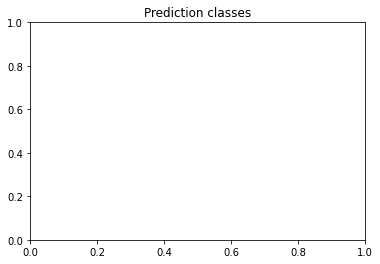

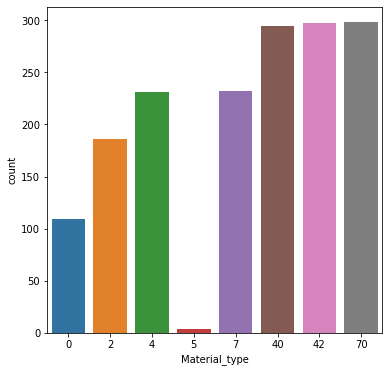

In [45]:
#Select size of plot to be produced
#plt.figure(figsize=(10,4))

# Add title
plt.title("Prediction classes")

fig,ax = plt.subplots(figsize=(6,6))
sns.countplot(x= imageData_csv['Material_type'],ax=ax, data=imageData_csv)

70    298
42    297
40    294
7     232
4     231
2     186
0     109
5       4
Name: Material_type, dtype: int64

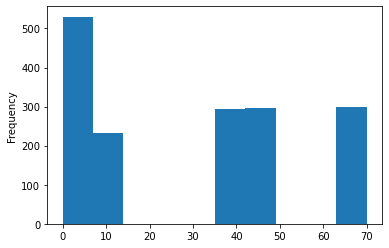

In [46]:
imageData_csv['Material_type'].plot.hist()
imageData_csv['Material_type'].value_counts()

In [63]:
new_data=pd.DataFrame(imageData_csv[(imageData_csv['Material_type'] != 0)])
new_data['GTIN'].astype(str)
new_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1542 entries, 0 to 1649
Data columns (total 18 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   PVID                1542 non-null   int64  
 1   GTIN                1542 non-null   float64
 2   TM                  1542 non-null   int64  
 3   CatCode_l1          1542 non-null   object 
 4   CatCode_l2          1542 non-null   object 
 5   CatCode_l3          1542 non-null   object 
 6   ProductDescription  1542 non-null   object 
 7   1-PET               1542 non-null   int64  
 8   2-HDPE              1542 non-null   int64  
 9   3-PVC               1542 non-null   int64  
 10  4-LDPE              1542 non-null   int64  
 11  5-PP                1542 non-null   int64  
 12  6-PS                1542 non-null   int64  
 13  7-OTHER(Plastics)   1542 non-null   int64  
 14  41-Aluminium        1542 non-null   int64  
 15  40-Steel            1542 non-null   int64  
 16  70-Cle

In [152]:
new_data1=pd.DataFrame(imageData_csv[(imageData_csv['Material_type'] == 0)])
#new_data['GTIN'].astype(str)
new_data1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 109 entries, 7 to 1650
Data columns (total 18 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   PVID                109 non-null    int64  
 1   GTIN                109 non-null    float64
 2   TM                  109 non-null    int64  
 3   CatCode_l1          109 non-null    object 
 4   CatCode_l2          109 non-null    object 
 5   CatCode_l3          109 non-null    object 
 6   ProductDescription  109 non-null    object 
 7   1-PET               109 non-null    int64  
 8   2-HDPE              109 non-null    int64  
 9   3-PVC               109 non-null    int64  
 10  4-LDPE              109 non-null    int64  
 11  5-PP                109 non-null    int64  
 12  6-PS                109 non-null    int64  
 13  7-OTHER(Plastics)   109 non-null    int64  
 14  41-Aluminium        109 non-null    int64  
 15  40-Steel            109 non-null    int64  
 16  70-Clea

In [62]:
new_data['Image_name']= new_data['PVID'].astype(str)+new_data['GTIN'].astype(str)+"_TO.jepg"
new_data['Image_name']



0       82860705909000000000.0_TO.jepg
1       82944548000070000000.0_TO.jepg
2       82944568000070000000.0_TO.jepg
3       83082423850100000000.0_TO.jepg
4       83232194005810000000.0_TO.jepg
                     ...              
1645    97521053574660000000.0_TO.jepg
1646    97609815029050000000.0_TO.jepg
1647    97609865029050000000.0_TO.jepg
1648    97618978584010000000.0_TO.jepg
1649    97710105029050000000.0_TO.jepg
Name: Image_name, Length: 1542, dtype: object

In [31]:
df= pd.DataFrame(imageData_csv)

image_name = imageData_csv['Image_name']+'.jpg'
df['Image_name1']=image_name
imageData_csv['Image_name1']

0       7855782_5000169120811_T0.jpg
1       8377219_5057172445653_T0.jpg
2       8430278_5057753939557_T0.jpg
3       8563962_5099874274568_T0.jpg
4       7977114_5013635755257_T0.jpg
                    ...             
996     8513636_8008698002049_T0.jpg
997          8444852_00400800_T0.jpg
998     8229340_5012035963903_T0.jpg
999     8291500_5098732008680_T0.jpg
1000    8248695_5000169271278_T0.jpg
Name: Image_name1, Length: 1001, dtype: object

In [144]:
import shutil, os


In [105]:
def find_files(inputImgMat, search_path):
   result = []
   destPath = "E:\Dissertation\Packaging_Project\Data\Train1"
   filesInSrc=[]
    # Wlaking top-down from the root
   for files in os.listdir(search_path):
        filesInSrc.append(files)
   #print(filesInSrc)
   for index, row in df.iterrows():
        fileName = row['Image_name1']
        folder = row['Material_type']
        
        if fileName in filesInSrc:
            #print(destPath+'\\'+str(folder))
            #print(search_path+'\\'+fileName)
            shutil.copy(search_path+'\\'+fileName, destPath+'\\'+str(folder))
            #print(fileName+search_path)
        else :
            print("Filename ", fileName, " not found in source directory")
      #if filename in files and imageData_csv['Material_type'=='1']:
         #result.shutil.copy(filename, 'E:\Dissertation\Packaging_Project\Data\1')
         #print(filename,"copied")

   return result


In [106]:
files1 = imageData_csv['Image_name1'].to_list()

path= 'E:\Dissertation\Packaging_Project\New_data\packaging_projectv2\images'

imageData_csv
imgMatData= imageData_csv[['Material_type','Image_name1']]
#imgMatData = imageData_csv['Material_type','Image_name1']
imgMatData
find_files(imgMatData,path)

Filename  7855782_5000169120811_T0.jpg  not found in source directory
Filename  8430278_5057753939557_T0.jpg  not found in source directory
Filename  7977114_5013635755257_T0.jpg  not found in source directory
Filename  7948115_5012686069900_T0.jpg  not found in source directory
Filename  8086696_5018970094528_T0.jpg  not found in source directory
Filename  7901367_5010251890577_T0.jpg  not found in source directory
Filename  8106467_0000000313049_T0.jpg  not found in source directory
Filename  8194889_5020580253707_T0.jpg  not found in source directory
Filename  7865709_5012008511407_T0.jpg  not found in source directory
Filename  8092168_01536812_T0.jpg  not found in source directory
Filename  8454495_5000169552322_T0.jpg  not found in source directory
Filename  8703194_5020379127844_T0.jpg  not found in source directory
Filename  8582028_5600767970513_T0.jpg  not found in source directory
Filename  8438075_5057753914394_T0.jpg  not found in source directory
Filename  7104286_3419280

Filename  8577367_00755034064770_T0.jpg  not found in source directory
Filename  7877273_5019732059656_T0.jpg  not found in source directory
Filename  8153490_5017506119254_T0.jpg  not found in source directory
Filename  7871118_5060099290282_T0.jpg  not found in source directory
Filename  8343478_5010525010236_T0.jpg  not found in source directory
Filename  8460966_5052909439455_T0.jpg  not found in source directory
Filename  8007326_5000354914102_T0.jpg  not found in source directory
Filename  8374922_5054269834970_T0.jpg  not found in source directory
Filename  7900541_5010251555933_T0.jpg  not found in source directory
Filename  8172903_5010251886877_T0.jpg  not found in source directory
Filename  7980691_5010358254814_T0.jpg  not found in source directory
Filename  8748384_5010115901135_T0.jpg  not found in source directory
Filename  8273807_5099649002709_T0.jpg  not found in source directory
Filename  8554678_5099874276692_T0.jpg  not found in source directory
Filename  8191547_0

Filename  8222614_5099874284475_T0.jpg  not found in source directory
Filename  8441181_5057373266477_T0.jpg  not found in source directory
Filename  8410539_5060221203760_T0.jpg  not found in source directory
Filename  8192376_5010251920236_T0.jpg  not found in source directory
Filename  8241825_5060231400647_T0.jpg  not found in source directory
Filename  8273543_8004747007638_T0.jpg  not found in source directory
Filename  8050331_5057967214822_T0.jpg  not found in source directory
Filename  8521303_0238000000000_T0.jpg  not found in source directory
Filename  8626804_01843903_T0.jpg  not found in source directory
Filename  8192232_5000169003756_T0.jpg  not found in source directory
Filename  8193996_5060043610999_T0.jpg  not found in source directory
Filename  8573602_5057753892234_T0.jpg  not found in source directory
Filename  8331188_5039023065746_T0.jpg  not found in source directory
Filename  7874714_5000128651615_T0.jpg  not found in source directory
Filename  8030643_5050668

Filename  8495483_5060448760350_T0.jpg  not found in source directory
Filename  8014335_5000168206509_T0.jpg  not found in source directory
Filename  8133236_5060194391525_T0.jpg  not found in source directory
Filename  7901118_5010251756712_T0.jpg  not found in source directory
Filename  8475081_5000169589359_T0.jpg  not found in source directory
Filename  8112534_5057172229864_T0.jpg  not found in source directory
Filename  8039854_5010525013053_T0.jpg  not found in source directory
Filename  8056766_5011522028835_T0.jpg  not found in source directory
Filename  8043249_5022111011879_T0.jpg  not found in source directory
Filename  7950839_5000169579787_T0.jpg  not found in source directory
Filename  8266056_0887910000050_T0.jpg  not found in source directory
Filename  8701675_5056357901496_T0.jpg  not found in source directory
Filename  8057312_3178530408515_T0.jpg  not found in source directory
Filename  7868667_5011005056355_T0.jpg  not found in source directory
Filename  8075593_50

[]

In [110]:
imgMatData['Material_type'].value_counts()

0    400
1    230
5    218
4     57
2     56
7     39
6      1
Name: Material_type, dtype: int64

In [153]:

import re

#filesinSRc ['001_78688_TO.jpg', '003_8797987_TO.jpg', '6767_67762_TO.jpg']

def find_files(inputImgMat, search_path):
   result = []
   destPath = "E:\Dissertation\Packaging_Project\Data\Extra_unlabled"
   filesInSrc=[]
    # Wlaking top-down from the root
   for files in os.listdir(search_path):
        filesInSrc.append(files)
   #print(filesInSrc)
   for index, row in new_data1.iterrows():
        fileName = str(row['PVID'])
        folder = row['Material_type']
        #pattern = 'fileName.*_TO.jpg'
        p=re.compile(fileName+'.*_T0')
        #print(p)
        for file in filesInSrc:
            print(p.match(file))
            if p.match(file):
                #print('matched')
                shutil.copy(search_path+'\\'+file, destPath+'\\'+str(folder))
                break
            #print(fileName+search_path)
            else :
                print("Filename ", fileName, " not found in source directory")
      #if filename in files and imageData_csv['Material_type'=='1']:
         #result.shutil.copy(filename, 'E:\Dissertation\Packaging_Project\Data\1')
         #print(filename,"copied")

   return result

In [154]:
path='E:\\Dissertation\\Packaging_Project\\New_data\\packaging_projectv2\\images'
#new_data['Image_name']
imgMatData1= new_data1[['PVID','Material_type']]
#imgMatData = imageData_csv['Material_type','Image_name1']
imgMatData1
find_files(imgMatData1,path)

None
Filename  8365138  not found in source directory
None
Filename  8365138  not found in source directory
None
Filename  8365138  not found in source directory
None
Filename  8365138  not found in source directory
None
Filename  8365138  not found in source directory
None
Filename  8365138  not found in source directory
None
Filename  8365138  not found in source directory
None
Filename  8365138  not found in source directory
None
Filename  8365138  not found in source directory
None
Filename  8365138  not found in source directory
None
Filename  8365138  not found in source directory
None
Filename  8365138  not found in source directory
None
Filename  8365138  not found in source directory
None
Filename  8365138  not found in source directory
<re.Match object; span=(0, 24), match='8365138_0000080522621_T0'>
None
Filename  8388858  not found in source directory
None
Filename  8388858  not found in source directory
None
Filename  8388858  not found in source directory
None
Filename  8

None
Filename  8452342  not found in source directory
None
Filename  8452342  not found in source directory
None
Filename  8452342  not found in source directory
None
Filename  8452342  not found in source directory
None
Filename  8452342  not found in source directory
None
Filename  8452342  not found in source directory
None
Filename  8452342  not found in source directory
None
Filename  8452342  not found in source directory
None
Filename  8452342  not found in source directory
None
Filename  8452342  not found in source directory
None
Filename  8452342  not found in source directory
None
Filename  8452342  not found in source directory
None
Filename  8452342  not found in source directory
None
Filename  8452342  not found in source directory
None
Filename  8452342  not found in source directory
None
Filename  8452342  not found in source directory
None
Filename  8452342  not found in source directory
None
Filename  8452342  not found in source directory
None
Filename  8452342  not 

None
Filename  8482220  not found in source directory
None
Filename  8482220  not found in source directory
None
Filename  8482220  not found in source directory
None
Filename  8482220  not found in source directory
None
Filename  8482220  not found in source directory
None
Filename  8482220  not found in source directory
None
Filename  8482220  not found in source directory
None
Filename  8482220  not found in source directory
None
Filename  8482220  not found in source directory
None
Filename  8482220  not found in source directory
None
Filename  8482220  not found in source directory
None
Filename  8482220  not found in source directory
None
Filename  8482220  not found in source directory
None
Filename  8482220  not found in source directory
None
Filename  8482220  not found in source directory
None
Filename  8482220  not found in source directory
None
Filename  8482220  not found in source directory
None
Filename  8482220  not found in source directory
None
Filename  8482220  not 

None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not 

Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found

Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found

Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found

None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not 

None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not 

Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found

Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found

Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found in source directory
None
Filename  8731646  not found

Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found

Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found

None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not 

Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found

None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not 

Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found

Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found

Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found

Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found in source directory
None
Filename  8825031  not found

Filename  8888058  not found in source directory
None
Filename  8888058  not found in source directory
None
Filename  8888058  not found in source directory
None
Filename  8888058  not found in source directory
None
Filename  8888058  not found in source directory
None
Filename  8888058  not found in source directory
None
Filename  8888058  not found in source directory
None
Filename  8888058  not found in source directory
None
Filename  8888058  not found in source directory
None
Filename  8888058  not found in source directory
None
Filename  8888058  not found in source directory
None
Filename  8888058  not found in source directory
None
Filename  8888058  not found in source directory
None
Filename  8888058  not found in source directory
None
Filename  8888058  not found in source directory
None
Filename  8888058  not found in source directory
None
Filename  8888058  not found in source directory
None
Filename  8888058  not found in source directory
None
Filename  8888058  not found

None
Filename  8888237  not found in source directory
None
Filename  8888237  not found in source directory
None
Filename  8888237  not found in source directory
None
Filename  8888237  not found in source directory
None
Filename  8888237  not found in source directory
None
Filename  8888237  not found in source directory
None
Filename  8888237  not found in source directory
None
Filename  8888237  not found in source directory
None
Filename  8888237  not found in source directory
None
Filename  8888237  not found in source directory
None
Filename  8888237  not found in source directory
None
Filename  8888237  not found in source directory
None
Filename  8888237  not found in source directory
None
Filename  8888237  not found in source directory
None
Filename  8888237  not found in source directory
None
Filename  8888237  not found in source directory
None
Filename  8888237  not found in source directory
None
Filename  8888237  not found in source directory
None
Filename  8888237  not 

None
Filename  8933476  not found in source directory
None
Filename  8933476  not found in source directory
None
Filename  8933476  not found in source directory
None
Filename  8933476  not found in source directory
None
Filename  8933476  not found in source directory
None
Filename  8933476  not found in source directory
None
Filename  8933476  not found in source directory
None
Filename  8933476  not found in source directory
None
Filename  8933476  not found in source directory
None
Filename  8933476  not found in source directory
None
Filename  8933476  not found in source directory
None
Filename  8933476  not found in source directory
None
Filename  8933476  not found in source directory
None
Filename  8933476  not found in source directory
None
Filename  8933476  not found in source directory
None
Filename  8933476  not found in source directory
None
Filename  8933476  not found in source directory
None
Filename  8933476  not found in source directory
None
Filename  8933476  not 

Filename  8933476  not found in source directory
None
Filename  8933476  not found in source directory
None
Filename  8933476  not found in source directory
None
Filename  8933476  not found in source directory
None
Filename  8933476  not found in source directory
None
Filename  8933476  not found in source directory
None
Filename  8933476  not found in source directory
None
Filename  8933476  not found in source directory
None
Filename  8933476  not found in source directory
None
Filename  8933476  not found in source directory
None
Filename  8933476  not found in source directory
None
Filename  8933476  not found in source directory
None
Filename  8933476  not found in source directory
None
Filename  8933476  not found in source directory
None
Filename  8933476  not found in source directory
None
Filename  8933476  not found in source directory
None
Filename  8933476  not found in source directory
None
Filename  8933476  not found in source directory
None
Filename  8933476  not found

None
Filename  8933477  not found in source directory
None
Filename  8933477  not found in source directory
None
Filename  8933477  not found in source directory
None
Filename  8933477  not found in source directory
None
Filename  8933477  not found in source directory
None
Filename  8933477  not found in source directory
None
Filename  8933477  not found in source directory
None
Filename  8933477  not found in source directory
None
Filename  8933477  not found in source directory
None
Filename  8933477  not found in source directory
None
Filename  8933477  not found in source directory
None
Filename  8933477  not found in source directory
None
Filename  8933477  not found in source directory
None
Filename  8933477  not found in source directory
None
Filename  8933477  not found in source directory
None
Filename  8933477  not found in source directory
None
Filename  8933477  not found in source directory
None
Filename  8933477  not found in source directory
None
Filename  8933477  not 

None
Filename  8933477  not found in source directory
None
Filename  8933477  not found in source directory
None
Filename  8933477  not found in source directory
None
Filename  8933477  not found in source directory
None
Filename  8933477  not found in source directory
None
Filename  8933477  not found in source directory
None
Filename  8933477  not found in source directory
None
Filename  8933477  not found in source directory
None
Filename  8933477  not found in source directory
None
Filename  8933477  not found in source directory
None
Filename  8933477  not found in source directory
None
Filename  8933477  not found in source directory
None
Filename  8933477  not found in source directory
None
Filename  8933477  not found in source directory
None
Filename  8933477  not found in source directory
None
Filename  8933477  not found in source directory
None
Filename  8933477  not found in source directory
None
Filename  8933477  not found in source directory
None
Filename  8933477  not 

None
Filename  8933478  not found in source directory
None
Filename  8933478  not found in source directory
None
Filename  8933478  not found in source directory
None
Filename  8933478  not found in source directory
None
Filename  8933478  not found in source directory
None
Filename  8933478  not found in source directory
None
Filename  8933478  not found in source directory
None
Filename  8933478  not found in source directory
None
Filename  8933478  not found in source directory
None
Filename  8933478  not found in source directory
None
Filename  8933478  not found in source directory
None
Filename  8933478  not found in source directory
None
Filename  8933478  not found in source directory
None
Filename  8933478  not found in source directory
None
Filename  8933478  not found in source directory
None
Filename  8933478  not found in source directory
None
Filename  8933478  not found in source directory
None
Filename  8933478  not found in source directory
None
Filename  8933478  not 

Filename  8933478  not found in source directory
None
Filename  8933478  not found in source directory
None
Filename  8933478  not found in source directory
None
Filename  8933478  not found in source directory
None
Filename  8933478  not found in source directory
None
Filename  8933478  not found in source directory
None
Filename  8933478  not found in source directory
None
Filename  8933478  not found in source directory
None
Filename  8933478  not found in source directory
None
Filename  8933478  not found in source directory
None
Filename  8933478  not found in source directory
None
Filename  8933478  not found in source directory
None
Filename  8933478  not found in source directory
None
Filename  8933478  not found in source directory
None
Filename  8933478  not found in source directory
None
Filename  8933478  not found in source directory
None
Filename  8933478  not found in source directory
None
Filename  8933478  not found in source directory
None
Filename  8933478  not found

None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not 

Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found

Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found

None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not 

Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found

Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found

Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found

Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found

None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not 

None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not 

Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found

Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found in source directory
None
Filename  8937909  not found

Filename  8940521  not found in source directory
None
Filename  8940521  not found in source directory
None
Filename  8940521  not found in source directory
None
Filename  8940521  not found in source directory
None
Filename  8940521  not found in source directory
None
Filename  8940521  not found in source directory
None
Filename  8940521  not found in source directory
None
Filename  8940521  not found in source directory
None
Filename  8940521  not found in source directory
None
Filename  8940521  not found in source directory
None
Filename  8940521  not found in source directory
None
Filename  8940521  not found in source directory
None
Filename  8940521  not found in source directory
None
Filename  8940521  not found in source directory
None
Filename  8940521  not found in source directory
None
Filename  8940521  not found in source directory
None
Filename  8940521  not found in source directory
None
Filename  8940521  not found in source directory
None
Filename  8940521  not found

Filename  8940521  not found in source directory
None
Filename  8940521  not found in source directory
None
Filename  8940521  not found in source directory
None
Filename  8940521  not found in source directory
None
Filename  8940521  not found in source directory
None
Filename  8940521  not found in source directory
None
Filename  8940521  not found in source directory
None
Filename  8940521  not found in source directory
None
Filename  8940521  not found in source directory
None
Filename  8940521  not found in source directory
None
Filename  8940521  not found in source directory
None
Filename  8940521  not found in source directory
None
Filename  8940521  not found in source directory
None
Filename  8940521  not found in source directory
None
Filename  8940521  not found in source directory
None
Filename  8940521  not found in source directory
None
Filename  8940521  not found in source directory
None
Filename  8940521  not found in source directory
None
Filename  8940521  not found

Filename  8955451  not found in source directory
None
Filename  8955451  not found in source directory
None
Filename  8955451  not found in source directory
None
Filename  8955451  not found in source directory
None
Filename  8955451  not found in source directory
None
Filename  8955451  not found in source directory
None
Filename  8955451  not found in source directory
None
Filename  8955451  not found in source directory
None
Filename  8955451  not found in source directory
None
Filename  8955451  not found in source directory
None
Filename  8955451  not found in source directory
None
Filename  8955451  not found in source directory
None
Filename  8955451  not found in source directory
None
Filename  8955451  not found in source directory
None
Filename  8955451  not found in source directory
None
Filename  8955451  not found in source directory
None
Filename  8955451  not found in source directory
None
Filename  8955451  not found in source directory
None
Filename  8955451  not found

None
Filename  8955451  not found in source directory
None
Filename  8955451  not found in source directory
None
Filename  8955451  not found in source directory
None
Filename  8955451  not found in source directory
None
Filename  8955451  not found in source directory
None
Filename  8955451  not found in source directory
None
Filename  8955451  not found in source directory
None
Filename  8955451  not found in source directory
None
Filename  8955451  not found in source directory
None
Filename  8955451  not found in source directory
None
Filename  8955451  not found in source directory
None
Filename  8955451  not found in source directory
None
Filename  8955451  not found in source directory
None
Filename  8955451  not found in source directory
None
Filename  8955451  not found in source directory
None
Filename  8955451  not found in source directory
None
Filename  8955451  not found in source directory
None
Filename  8955451  not found in source directory
None
Filename  8955451  not 

None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not 

Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found

Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found

Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found

Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found

None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not 

Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found

None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not 

Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found

Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found

Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found in source directory
None
Filename  8959888  not found

Filename  8959944  not found in source directory
None
Filename  8959944  not found in source directory
None
Filename  8959944  not found in source directory
None
Filename  8959944  not found in source directory
None
Filename  8959944  not found in source directory
None
Filename  8959944  not found in source directory
None
Filename  8959944  not found in source directory
None
Filename  8959944  not found in source directory
None
Filename  8959944  not found in source directory
None
Filename  8959944  not found in source directory
None
Filename  8959944  not found in source directory
None
Filename  8959944  not found in source directory
None
Filename  8959944  not found in source directory
None
Filename  8959944  not found in source directory
None
Filename  8959944  not found in source directory
None
Filename  8959944  not found in source directory
None
Filename  8959944  not found in source directory
None
Filename  8959944  not found in source directory
None
Filename  8959944  not found

None
Filename  8959948  not found in source directory
None
Filename  8959948  not found in source directory
None
Filename  8959948  not found in source directory
None
Filename  8959948  not found in source directory
None
Filename  8959948  not found in source directory
None
Filename  8959948  not found in source directory
None
Filename  8959948  not found in source directory
None
Filename  8959948  not found in source directory
None
Filename  8959948  not found in source directory
None
Filename  8959948  not found in source directory
None
Filename  8959948  not found in source directory
None
Filename  8959948  not found in source directory
None
Filename  8959948  not found in source directory
None
Filename  8959948  not found in source directory
None
Filename  8959948  not found in source directory
None
Filename  8959948  not found in source directory
None
Filename  8959948  not found in source directory
None
Filename  8959948  not found in source directory
None
Filename  8959948  not 

Filename  8959948  not found in source directory
None
Filename  8959948  not found in source directory
None
Filename  8959948  not found in source directory
None
Filename  8959948  not found in source directory
None
Filename  8959948  not found in source directory
None
Filename  8959948  not found in source directory
None
Filename  8959948  not found in source directory
None
Filename  8959948  not found in source directory
None
Filename  8959948  not found in source directory
None
Filename  8959948  not found in source directory
None
Filename  8959948  not found in source directory
None
Filename  8959948  not found in source directory
None
Filename  8959948  not found in source directory
None
Filename  8959948  not found in source directory
None
Filename  8959948  not found in source directory
None
Filename  8959948  not found in source directory
None
Filename  8959948  not found in source directory
None
Filename  8959948  not found in source directory
None
Filename  8959948  not found

Filename  8959948  not found in source directory
None
Filename  8959948  not found in source directory
None
Filename  8959948  not found in source directory
None
Filename  8959948  not found in source directory
None
Filename  8959948  not found in source directory
None
Filename  8959948  not found in source directory
None
Filename  8959948  not found in source directory
None
Filename  8959948  not found in source directory
None
Filename  8959948  not found in source directory
None
Filename  8959948  not found in source directory
None
Filename  8959948  not found in source directory
None
Filename  8959948  not found in source directory
None
Filename  8959948  not found in source directory
None
Filename  8959948  not found in source directory
None
Filename  8959948  not found in source directory
None
Filename  8959948  not found in source directory
None
Filename  8959948  not found in source directory
None
Filename  8959948  not found in source directory
None
Filename  8959948  not found

Filename  9008904  not found in source directory
None
Filename  9008904  not found in source directory
None
Filename  9008904  not found in source directory
None
Filename  9008904  not found in source directory
None
Filename  9008904  not found in source directory
None
Filename  9008904  not found in source directory
None
Filename  9008904  not found in source directory
None
Filename  9008904  not found in source directory
None
Filename  9008904  not found in source directory
None
Filename  9008904  not found in source directory
None
Filename  9008904  not found in source directory
None
Filename  9008904  not found in source directory
None
Filename  9008904  not found in source directory
None
Filename  9008904  not found in source directory
None
Filename  9008904  not found in source directory
None
Filename  9008904  not found in source directory
None
Filename  9008904  not found in source directory
None
Filename  9008904  not found in source directory
None
Filename  9008904  not found

None
Filename  9008904  not found in source directory
None
Filename  9008904  not found in source directory
None
Filename  9008904  not found in source directory
None
Filename  9008904  not found in source directory
None
Filename  9008904  not found in source directory
None
Filename  9008904  not found in source directory
None
Filename  9008904  not found in source directory
None
Filename  9008904  not found in source directory
None
Filename  9008904  not found in source directory
None
Filename  9008904  not found in source directory
None
Filename  9008904  not found in source directory
None
Filename  9008904  not found in source directory
None
Filename  9008904  not found in source directory
None
Filename  9008904  not found in source directory
None
Filename  9008904  not found in source directory
None
Filename  9008904  not found in source directory
None
Filename  9008904  not found in source directory
None
Filename  9008904  not found in source directory
None
Filename  9008904  not 

None
Filename  9067602  not found in source directory
None
Filename  9067602  not found in source directory
None
Filename  9067602  not found in source directory
None
Filename  9067602  not found in source directory
None
Filename  9067602  not found in source directory
None
Filename  9067602  not found in source directory
None
Filename  9067602  not found in source directory
None
Filename  9067602  not found in source directory
None
Filename  9067602  not found in source directory
None
Filename  9067602  not found in source directory
None
Filename  9067602  not found in source directory
None
Filename  9067602  not found in source directory
None
Filename  9067602  not found in source directory
None
Filename  9067602  not found in source directory
None
Filename  9067602  not found in source directory
None
Filename  9067602  not found in source directory
None
Filename  9067602  not found in source directory
None
Filename  9067602  not found in source directory
None
Filename  9067602  not 

Filename  9067602  not found in source directory
None
Filename  9067602  not found in source directory
None
Filename  9067602  not found in source directory
None
Filename  9067602  not found in source directory
None
Filename  9067602  not found in source directory
None
Filename  9067602  not found in source directory
None
Filename  9067602  not found in source directory
None
Filename  9067602  not found in source directory
None
Filename  9067602  not found in source directory
None
Filename  9067602  not found in source directory
None
Filename  9067602  not found in source directory
None
Filename  9067602  not found in source directory
None
Filename  9067602  not found in source directory
None
Filename  9067602  not found in source directory
None
Filename  9067602  not found in source directory
None
Filename  9067602  not found in source directory
None
Filename  9067602  not found in source directory
None
Filename  9067602  not found in source directory
None
Filename  9067602  not found

Filename  9067602  not found in source directory
None
Filename  9067602  not found in source directory
None
Filename  9067602  not found in source directory
None
Filename  9067602  not found in source directory
None
Filename  9067602  not found in source directory
None
Filename  9067602  not found in source directory
None
Filename  9067602  not found in source directory
None
Filename  9067602  not found in source directory
None
Filename  9067602  not found in source directory
None
Filename  9067602  not found in source directory
None
Filename  9067602  not found in source directory
None
Filename  9067602  not found in source directory
None
Filename  9067602  not found in source directory
None
Filename  9067602  not found in source directory
None
Filename  9067602  not found in source directory
None
Filename  9067602  not found in source directory
None
Filename  9067602  not found in source directory
None
Filename  9067602  not found in source directory
None
Filename  9067602  not found

Filename  9067602  not found in source directory
None
Filename  9067602  not found in source directory
None
Filename  9067602  not found in source directory
None
Filename  9067602  not found in source directory
None
Filename  9067602  not found in source directory
None
Filename  9067602  not found in source directory
None
Filename  9067602  not found in source directory
None
Filename  9067602  not found in source directory
None
Filename  9067602  not found in source directory
None
Filename  9067602  not found in source directory
None
Filename  9067602  not found in source directory
None
Filename  9067602  not found in source directory
None
Filename  9067602  not found in source directory
None
Filename  9067602  not found in source directory
None
Filename  9067602  not found in source directory
None
Filename  9067602  not found in source directory
None
Filename  9067602  not found in source directory
None
Filename  9067602  not found in source directory
None
Filename  9067602  not found

Filename  9075997  not found in source directory
None
Filename  9075997  not found in source directory
None
Filename  9075997  not found in source directory
None
Filename  9075997  not found in source directory
None
Filename  9075997  not found in source directory
None
Filename  9075997  not found in source directory
None
Filename  9075997  not found in source directory
None
Filename  9075997  not found in source directory
None
Filename  9075997  not found in source directory
None
Filename  9075997  not found in source directory
None
Filename  9075997  not found in source directory
None
Filename  9075997  not found in source directory
None
Filename  9075997  not found in source directory
None
Filename  9075997  not found in source directory
None
Filename  9075997  not found in source directory
None
Filename  9075997  not found in source directory
None
Filename  9075997  not found in source directory
None
Filename  9075997  not found in source directory
None
Filename  9075997  not found

Filename  9075997  not found in source directory
None
Filename  9075997  not found in source directory
None
Filename  9075997  not found in source directory
None
Filename  9075997  not found in source directory
None
Filename  9075997  not found in source directory
None
Filename  9075997  not found in source directory
None
Filename  9075997  not found in source directory
None
Filename  9075997  not found in source directory
None
Filename  9075997  not found in source directory
None
Filename  9075997  not found in source directory
None
Filename  9075997  not found in source directory
None
Filename  9075997  not found in source directory
None
Filename  9075997  not found in source directory
None
Filename  9075997  not found in source directory
None
Filename  9075997  not found in source directory
None
Filename  9075997  not found in source directory
None
Filename  9075997  not found in source directory
None
Filename  9075997  not found in source directory
None
Filename  9075997  not found

Filename  9075997  not found in source directory
None
Filename  9075997  not found in source directory
None
Filename  9075997  not found in source directory
None
Filename  9075997  not found in source directory
None
Filename  9075997  not found in source directory
None
Filename  9075997  not found in source directory
None
Filename  9075997  not found in source directory
None
Filename  9075997  not found in source directory
None
Filename  9075997  not found in source directory
None
Filename  9075997  not found in source directory
None
Filename  9075997  not found in source directory
None
Filename  9075997  not found in source directory
None
Filename  9075997  not found in source directory
None
Filename  9075997  not found in source directory
None
Filename  9075997  not found in source directory
None
Filename  9075997  not found in source directory
None
Filename  9075997  not found in source directory
None
Filename  9075997  not found in source directory
None
Filename  9075997  not found

Filename  9075997  not found in source directory
None
Filename  9075997  not found in source directory
None
Filename  9075997  not found in source directory
None
Filename  9075997  not found in source directory
None
Filename  9075997  not found in source directory
None
Filename  9075997  not found in source directory
None
Filename  9075997  not found in source directory
None
Filename  9075997  not found in source directory
None
Filename  9075997  not found in source directory
None
Filename  9075997  not found in source directory
None
Filename  9075997  not found in source directory
None
Filename  9075997  not found in source directory
None
Filename  9075997  not found in source directory
None
Filename  9075997  not found in source directory
None
Filename  9075997  not found in source directory
None
Filename  9075997  not found in source directory
None
Filename  9075997  not found in source directory
None
Filename  9075997  not found in source directory
None
Filename  9075997  not found

None
Filename  9096908  not found in source directory
None
Filename  9096908  not found in source directory
None
Filename  9096908  not found in source directory
None
Filename  9096908  not found in source directory
None
Filename  9096908  not found in source directory
None
Filename  9096908  not found in source directory
None
Filename  9096908  not found in source directory
None
Filename  9096908  not found in source directory
None
Filename  9096908  not found in source directory
None
Filename  9096908  not found in source directory
None
Filename  9096908  not found in source directory
None
Filename  9096908  not found in source directory
None
Filename  9096908  not found in source directory
None
Filename  9096908  not found in source directory
None
Filename  9096908  not found in source directory
None
Filename  9096908  not found in source directory
None
Filename  9096908  not found in source directory
None
Filename  9096908  not found in source directory
None
Filename  9096908  not 

Filename  9096908  not found in source directory
None
Filename  9096908  not found in source directory
None
Filename  9096908  not found in source directory
None
Filename  9096908  not found in source directory
None
Filename  9096908  not found in source directory
None
Filename  9096908  not found in source directory
None
Filename  9096908  not found in source directory
None
Filename  9096908  not found in source directory
None
Filename  9096908  not found in source directory
None
Filename  9096908  not found in source directory
None
Filename  9096908  not found in source directory
None
Filename  9096908  not found in source directory
None
Filename  9096908  not found in source directory
None
Filename  9096908  not found in source directory
None
Filename  9096908  not found in source directory
None
Filename  9096908  not found in source directory
None
Filename  9096908  not found in source directory
None
Filename  9096908  not found in source directory
None
Filename  9096908  not found

Filename  9096908  not found in source directory
None
Filename  9096908  not found in source directory
None
Filename  9096908  not found in source directory
None
Filename  9096908  not found in source directory
None
Filename  9096908  not found in source directory
None
Filename  9096908  not found in source directory
None
Filename  9096908  not found in source directory
None
Filename  9096908  not found in source directory
None
Filename  9096908  not found in source directory
None
Filename  9096908  not found in source directory
None
Filename  9096908  not found in source directory
None
Filename  9096908  not found in source directory
None
Filename  9096908  not found in source directory
None
Filename  9096908  not found in source directory
None
Filename  9096908  not found in source directory
None
Filename  9096908  not found in source directory
None
Filename  9096908  not found in source directory
None
Filename  9096908  not found in source directory
None
Filename  9096908  not found

Filename  9096908  not found in source directory
None
Filename  9096908  not found in source directory
None
Filename  9096908  not found in source directory
None
Filename  9096908  not found in source directory
None
Filename  9096908  not found in source directory
None
Filename  9096908  not found in source directory
None
Filename  9096908  not found in source directory
None
Filename  9096908  not found in source directory
None
Filename  9096908  not found in source directory
None
Filename  9096908  not found in source directory
None
Filename  9096908  not found in source directory
None
Filename  9096908  not found in source directory
None
Filename  9096908  not found in source directory
None
Filename  9096908  not found in source directory
None
Filename  9096908  not found in source directory
None
Filename  9096908  not found in source directory
None
Filename  9096908  not found in source directory
None
Filename  9096908  not found in source directory
None
Filename  9096908  not found

None
Filename  9109006  not found in source directory
None
Filename  9109006  not found in source directory
None
Filename  9109006  not found in source directory
None
Filename  9109006  not found in source directory
None
Filename  9109006  not found in source directory
None
Filename  9109006  not found in source directory
None
Filename  9109006  not found in source directory
None
Filename  9109006  not found in source directory
None
Filename  9109006  not found in source directory
None
Filename  9109006  not found in source directory
None
Filename  9109006  not found in source directory
None
Filename  9109006  not found in source directory
None
Filename  9109006  not found in source directory
None
Filename  9109006  not found in source directory
None
Filename  9109006  not found in source directory
None
Filename  9109006  not found in source directory
None
Filename  9109006  not found in source directory
None
Filename  9109006  not found in source directory
None
Filename  9109006  not 

Filename  9109006  not found in source directory
None
Filename  9109006  not found in source directory
None
Filename  9109006  not found in source directory
None
Filename  9109006  not found in source directory
None
Filename  9109006  not found in source directory
None
Filename  9109006  not found in source directory
None
Filename  9109006  not found in source directory
None
Filename  9109006  not found in source directory
None
Filename  9109006  not found in source directory
None
Filename  9109006  not found in source directory
None
Filename  9109006  not found in source directory
None
Filename  9109006  not found in source directory
None
Filename  9109006  not found in source directory
None
Filename  9109006  not found in source directory
None
Filename  9109006  not found in source directory
None
Filename  9109006  not found in source directory
None
Filename  9109006  not found in source directory
None
Filename  9109006  not found in source directory
None
Filename  9109006  not found

Filename  9109006  not found in source directory
None
Filename  9109006  not found in source directory
None
Filename  9109006  not found in source directory
None
Filename  9109006  not found in source directory
None
Filename  9109006  not found in source directory
None
Filename  9109006  not found in source directory
None
Filename  9109006  not found in source directory
None
Filename  9109006  not found in source directory
None
Filename  9109006  not found in source directory
None
Filename  9109006  not found in source directory
None
Filename  9109006  not found in source directory
None
Filename  9109006  not found in source directory
None
Filename  9109006  not found in source directory
None
Filename  9109006  not found in source directory
None
Filename  9109006  not found in source directory
None
Filename  9109006  not found in source directory
None
Filename  9109006  not found in source directory
None
Filename  9109006  not found in source directory
None
Filename  9109006  not found

None
Filename  9109006  not found in source directory
None
Filename  9109006  not found in source directory
None
Filename  9109006  not found in source directory
None
Filename  9109006  not found in source directory
None
Filename  9109006  not found in source directory
None
Filename  9109006  not found in source directory
None
Filename  9109006  not found in source directory
None
Filename  9109006  not found in source directory
None
Filename  9109006  not found in source directory
None
Filename  9109006  not found in source directory
None
Filename  9109006  not found in source directory
None
Filename  9109006  not found in source directory
None
Filename  9109006  not found in source directory
None
Filename  9109006  not found in source directory
None
Filename  9109006  not found in source directory
None
Filename  9109006  not found in source directory
None
Filename  9109006  not found in source directory
None
Filename  9109006  not found in source directory
None
Filename  9109006  not 

None
Filename  9109006  not found in source directory
None
Filename  9109006  not found in source directory
None
Filename  9109006  not found in source directory
None
Filename  9109006  not found in source directory
None
Filename  9109006  not found in source directory
None
Filename  9109006  not found in source directory
None
Filename  9109006  not found in source directory
None
Filename  9109006  not found in source directory
None
Filename  9109006  not found in source directory
None
Filename  9109006  not found in source directory
None
Filename  9109006  not found in source directory
None
Filename  9109006  not found in source directory
None
Filename  9109006  not found in source directory
None
Filename  9109006  not found in source directory
None
Filename  9109006  not found in source directory
None
Filename  9109006  not found in source directory
None
Filename  9109006  not found in source directory
None
Filename  9109006  not found in source directory
None
Filename  9109006  not 

None
Filename  9109011  not found in source directory
None
Filename  9109011  not found in source directory
None
Filename  9109011  not found in source directory
None
Filename  9109011  not found in source directory
None
Filename  9109011  not found in source directory
None
Filename  9109011  not found in source directory
None
Filename  9109011  not found in source directory
None
Filename  9109011  not found in source directory
None
Filename  9109011  not found in source directory
None
Filename  9109011  not found in source directory
None
Filename  9109011  not found in source directory
None
Filename  9109011  not found in source directory
None
Filename  9109011  not found in source directory
None
Filename  9109011  not found in source directory
None
Filename  9109011  not found in source directory
None
Filename  9109011  not found in source directory
None
Filename  9109011  not found in source directory
None
Filename  9109011  not found in source directory
None
Filename  9109011  not 

Filename  9109011  not found in source directory
None
Filename  9109011  not found in source directory
None
Filename  9109011  not found in source directory
None
Filename  9109011  not found in source directory
None
Filename  9109011  not found in source directory
None
Filename  9109011  not found in source directory
None
Filename  9109011  not found in source directory
None
Filename  9109011  not found in source directory
None
Filename  9109011  not found in source directory
None
Filename  9109011  not found in source directory
None
Filename  9109011  not found in source directory
None
Filename  9109011  not found in source directory
None
Filename  9109011  not found in source directory
None
Filename  9109011  not found in source directory
None
Filename  9109011  not found in source directory
None
Filename  9109011  not found in source directory
None
Filename  9109011  not found in source directory
None
Filename  9109011  not found in source directory
None
Filename  9109011  not found

Filename  9109011  not found in source directory
None
Filename  9109011  not found in source directory
None
Filename  9109011  not found in source directory
None
Filename  9109011  not found in source directory
None
Filename  9109011  not found in source directory
None
Filename  9109011  not found in source directory
None
Filename  9109011  not found in source directory
None
Filename  9109011  not found in source directory
None
Filename  9109011  not found in source directory
None
Filename  9109011  not found in source directory
None
Filename  9109011  not found in source directory
None
Filename  9109011  not found in source directory
None
Filename  9109011  not found in source directory
None
Filename  9109011  not found in source directory
None
Filename  9109011  not found in source directory
None
Filename  9109011  not found in source directory
None
Filename  9109011  not found in source directory
None
Filename  9109011  not found in source directory
None
Filename  9109011  not found

Filename  9109011  not found in source directory
None
Filename  9109011  not found in source directory
None
Filename  9109011  not found in source directory
None
Filename  9109011  not found in source directory
None
Filename  9109011  not found in source directory
None
Filename  9109011  not found in source directory
None
Filename  9109011  not found in source directory
None
Filename  9109011  not found in source directory
None
Filename  9109011  not found in source directory
None
Filename  9109011  not found in source directory
None
Filename  9109011  not found in source directory
None
Filename  9109011  not found in source directory
None
Filename  9109011  not found in source directory
None
Filename  9109011  not found in source directory
None
Filename  9109011  not found in source directory
None
Filename  9109011  not found in source directory
None
Filename  9109011  not found in source directory
None
Filename  9109011  not found in source directory
None
Filename  9109011  not found

None
Filename  9131842  not found in source directory
None
Filename  9131842  not found in source directory
None
Filename  9131842  not found in source directory
None
Filename  9131842  not found in source directory
None
Filename  9131842  not found in source directory
None
Filename  9131842  not found in source directory
None
Filename  9131842  not found in source directory
None
Filename  9131842  not found in source directory
None
Filename  9131842  not found in source directory
None
Filename  9131842  not found in source directory
None
Filename  9131842  not found in source directory
None
Filename  9131842  not found in source directory
None
Filename  9131842  not found in source directory
None
Filename  9131842  not found in source directory
None
Filename  9131842  not found in source directory
None
Filename  9131842  not found in source directory
None
Filename  9131842  not found in source directory
None
Filename  9131842  not found in source directory
None
Filename  9131842  not 

Filename  9131842  not found in source directory
None
Filename  9131842  not found in source directory
None
Filename  9131842  not found in source directory
None
Filename  9131842  not found in source directory
None
Filename  9131842  not found in source directory
None
Filename  9131842  not found in source directory
None
Filename  9131842  not found in source directory
None
Filename  9131842  not found in source directory
None
Filename  9131842  not found in source directory
None
Filename  9131842  not found in source directory
None
Filename  9131842  not found in source directory
None
Filename  9131842  not found in source directory
None
Filename  9131842  not found in source directory
None
Filename  9131842  not found in source directory
None
Filename  9131842  not found in source directory
None
Filename  9131842  not found in source directory
None
Filename  9131842  not found in source directory
None
Filename  9131842  not found in source directory
None
Filename  9131842  not found

Filename  9131842  not found in source directory
None
Filename  9131842  not found in source directory
None
Filename  9131842  not found in source directory
None
Filename  9131842  not found in source directory
None
Filename  9131842  not found in source directory
None
Filename  9131842  not found in source directory
None
Filename  9131842  not found in source directory
None
Filename  9131842  not found in source directory
None
Filename  9131842  not found in source directory
None
Filename  9131842  not found in source directory
None
Filename  9131842  not found in source directory
None
Filename  9131842  not found in source directory
None
Filename  9131842  not found in source directory
None
Filename  9131842  not found in source directory
None
Filename  9131842  not found in source directory
None
Filename  9131842  not found in source directory
None
Filename  9131842  not found in source directory
None
Filename  9131842  not found in source directory
None
Filename  9131842  not found

Filename  9131842  not found in source directory
None
Filename  9131842  not found in source directory
None
Filename  9131842  not found in source directory
None
Filename  9131842  not found in source directory
None
Filename  9131842  not found in source directory
None
Filename  9131842  not found in source directory
None
Filename  9131842  not found in source directory
None
Filename  9131842  not found in source directory
None
Filename  9131842  not found in source directory
None
Filename  9131842  not found in source directory
None
Filename  9131842  not found in source directory
None
Filename  9131842  not found in source directory
None
Filename  9131842  not found in source directory
None
Filename  9131842  not found in source directory
None
Filename  9131842  not found in source directory
None
Filename  9131842  not found in source directory
None
Filename  9131842  not found in source directory
None
Filename  9131842  not found in source directory
None
Filename  9131842  not found

None
Filename  9140503  not found in source directory
None
Filename  9140503  not found in source directory
None
Filename  9140503  not found in source directory
None
Filename  9140503  not found in source directory
None
Filename  9140503  not found in source directory
None
Filename  9140503  not found in source directory
None
Filename  9140503  not found in source directory
None
Filename  9140503  not found in source directory
None
Filename  9140503  not found in source directory
None
Filename  9140503  not found in source directory
None
Filename  9140503  not found in source directory
None
Filename  9140503  not found in source directory
None
Filename  9140503  not found in source directory
None
Filename  9140503  not found in source directory
None
Filename  9140503  not found in source directory
None
Filename  9140503  not found in source directory
None
Filename  9140503  not found in source directory
None
Filename  9140503  not found in source directory
None
Filename  9140503  not 

None
Filename  9140503  not found in source directory
None
Filename  9140503  not found in source directory
None
Filename  9140503  not found in source directory
None
Filename  9140503  not found in source directory
None
Filename  9140503  not found in source directory
None
Filename  9140503  not found in source directory
None
Filename  9140503  not found in source directory
None
Filename  9140503  not found in source directory
None
Filename  9140503  not found in source directory
None
Filename  9140503  not found in source directory
None
Filename  9140503  not found in source directory
None
Filename  9140503  not found in source directory
None
Filename  9140503  not found in source directory
None
Filename  9140503  not found in source directory
None
Filename  9140503  not found in source directory
None
Filename  9140503  not found in source directory
None
Filename  9140503  not found in source directory
None
Filename  9140503  not found in source directory
None
Filename  9140503  not 

Filename  9140503  not found in source directory
None
Filename  9140503  not found in source directory
None
Filename  9140503  not found in source directory
None
Filename  9140503  not found in source directory
None
Filename  9140503  not found in source directory
None
Filename  9140503  not found in source directory
None
Filename  9140503  not found in source directory
None
Filename  9140503  not found in source directory
None
Filename  9140503  not found in source directory
None
Filename  9140503  not found in source directory
None
Filename  9140503  not found in source directory
None
Filename  9140503  not found in source directory
None
Filename  9140503  not found in source directory
None
Filename  9140503  not found in source directory
None
Filename  9140503  not found in source directory
None
Filename  9140503  not found in source directory
None
Filename  9140503  not found in source directory
None
Filename  9140503  not found in source directory
None
Filename  9140503  not found

Filename  9140503  not found in source directory
None
Filename  9140503  not found in source directory
None
Filename  9140503  not found in source directory
None
Filename  9140503  not found in source directory
None
Filename  9140503  not found in source directory
None
Filename  9140503  not found in source directory
None
Filename  9140503  not found in source directory
None
Filename  9140503  not found in source directory
None
Filename  9140503  not found in source directory
None
Filename  9140503  not found in source directory
None
Filename  9140503  not found in source directory
None
Filename  9140503  not found in source directory
None
Filename  9140503  not found in source directory
None
Filename  9140503  not found in source directory
None
Filename  9140503  not found in source directory
None
Filename  9140503  not found in source directory
None
Filename  9140503  not found in source directory
None
Filename  9140503  not found in source directory
None
Filename  9140503  not found

Filename  9140503  not found in source directory
None
Filename  9140503  not found in source directory
None
Filename  9140503  not found in source directory
None
Filename  9140503  not found in source directory
None
Filename  9140503  not found in source directory
None
Filename  9140503  not found in source directory
None
Filename  9140503  not found in source directory
None
Filename  9140503  not found in source directory
None
Filename  9140503  not found in source directory
None
Filename  9140503  not found in source directory
None
Filename  9140503  not found in source directory
None
Filename  9140503  not found in source directory
None
Filename  9140503  not found in source directory
None
Filename  9140503  not found in source directory
None
Filename  9140503  not found in source directory
None
Filename  9140503  not found in source directory
None
Filename  9140503  not found in source directory
None
Filename  9140503  not found in source directory
None
Filename  9140503  not found

Filename  9140543  not found in source directory
None
Filename  9140543  not found in source directory
None
Filename  9140543  not found in source directory
None
Filename  9140543  not found in source directory
None
Filename  9140543  not found in source directory
None
Filename  9140543  not found in source directory
None
Filename  9140543  not found in source directory
None
Filename  9140543  not found in source directory
None
Filename  9140543  not found in source directory
None
Filename  9140543  not found in source directory
None
Filename  9140543  not found in source directory
None
Filename  9140543  not found in source directory
None
Filename  9140543  not found in source directory
None
Filename  9140543  not found in source directory
None
Filename  9140543  not found in source directory
None
Filename  9140543  not found in source directory
None
Filename  9140543  not found in source directory
None
Filename  9140543  not found in source directory
None
Filename  9140543  not found

None
Filename  9140543  not found in source directory
None
Filename  9140543  not found in source directory
None
Filename  9140543  not found in source directory
None
Filename  9140543  not found in source directory
None
Filename  9140543  not found in source directory
None
Filename  9140543  not found in source directory
None
Filename  9140543  not found in source directory
None
Filename  9140543  not found in source directory
None
Filename  9140543  not found in source directory
None
Filename  9140543  not found in source directory
None
Filename  9140543  not found in source directory
None
Filename  9140543  not found in source directory
None
Filename  9140543  not found in source directory
None
Filename  9140543  not found in source directory
None
Filename  9140543  not found in source directory
None
Filename  9140543  not found in source directory
None
Filename  9140543  not found in source directory
None
Filename  9140543  not found in source directory
None
Filename  9140543  not 

Filename  9140543  not found in source directory
None
Filename  9140543  not found in source directory
None
Filename  9140543  not found in source directory
None
Filename  9140543  not found in source directory
None
Filename  9140543  not found in source directory
None
Filename  9140543  not found in source directory
None
Filename  9140543  not found in source directory
None
Filename  9140543  not found in source directory
None
Filename  9140543  not found in source directory
None
Filename  9140543  not found in source directory
None
Filename  9140543  not found in source directory
None
Filename  9140543  not found in source directory
None
Filename  9140543  not found in source directory
None
Filename  9140543  not found in source directory
None
Filename  9140543  not found in source directory
None
Filename  9140543  not found in source directory
None
Filename  9140543  not found in source directory
None
Filename  9140543  not found in source directory
None
Filename  9140543  not found

Filename  9140543  not found in source directory
None
Filename  9140543  not found in source directory
None
Filename  9140543  not found in source directory
None
Filename  9140543  not found in source directory
None
Filename  9140543  not found in source directory
None
Filename  9140543  not found in source directory
None
Filename  9140543  not found in source directory
None
Filename  9140543  not found in source directory
None
Filename  9140543  not found in source directory
None
Filename  9140543  not found in source directory
None
Filename  9140543  not found in source directory
None
Filename  9140543  not found in source directory
None
Filename  9140543  not found in source directory
None
Filename  9140543  not found in source directory
None
Filename  9140543  not found in source directory
None
Filename  9140543  not found in source directory
None
Filename  9140543  not found in source directory
None
Filename  9140543  not found in source directory
None
Filename  9140543  not found

None
Filename  9140668  not found in source directory
None
Filename  9140668  not found in source directory
None
Filename  9140668  not found in source directory
None
Filename  9140668  not found in source directory
None
Filename  9140668  not found in source directory
None
Filename  9140668  not found in source directory
None
Filename  9140668  not found in source directory
None
Filename  9140668  not found in source directory
None
Filename  9140668  not found in source directory
None
Filename  9140668  not found in source directory
None
Filename  9140668  not found in source directory
None
Filename  9140668  not found in source directory
None
Filename  9140668  not found in source directory
None
Filename  9140668  not found in source directory
None
Filename  9140668  not found in source directory
None
Filename  9140668  not found in source directory
None
Filename  9140668  not found in source directory
None
Filename  9140668  not found in source directory
None
Filename  9140668  not 

Filename  9140668  not found in source directory
None
Filename  9140668  not found in source directory
None
Filename  9140668  not found in source directory
None
Filename  9140668  not found in source directory
None
Filename  9140668  not found in source directory
None
Filename  9140668  not found in source directory
None
Filename  9140668  not found in source directory
None
Filename  9140668  not found in source directory
None
Filename  9140668  not found in source directory
None
Filename  9140668  not found in source directory
None
Filename  9140668  not found in source directory
None
Filename  9140668  not found in source directory
None
Filename  9140668  not found in source directory
None
Filename  9140668  not found in source directory
None
Filename  9140668  not found in source directory
None
Filename  9140668  not found in source directory
None
Filename  9140668  not found in source directory
None
Filename  9140668  not found in source directory
None
Filename  9140668  not found

None
Filename  9140668  not found in source directory
None
Filename  9140668  not found in source directory
None
Filename  9140668  not found in source directory
None
Filename  9140668  not found in source directory
None
Filename  9140668  not found in source directory
None
Filename  9140668  not found in source directory
None
Filename  9140668  not found in source directory
None
Filename  9140668  not found in source directory
None
Filename  9140668  not found in source directory
None
Filename  9140668  not found in source directory
None
Filename  9140668  not found in source directory
None
Filename  9140668  not found in source directory
None
Filename  9140668  not found in source directory
None
Filename  9140668  not found in source directory
None
Filename  9140668  not found in source directory
None
Filename  9140668  not found in source directory
None
Filename  9140668  not found in source directory
None
Filename  9140668  not found in source directory
None
Filename  9140668  not 

None
Filename  9140668  not found in source directory
None
Filename  9140668  not found in source directory
None
Filename  9140668  not found in source directory
None
Filename  9140668  not found in source directory
None
Filename  9140668  not found in source directory
None
Filename  9140668  not found in source directory
None
Filename  9140668  not found in source directory
None
Filename  9140668  not found in source directory
None
Filename  9140668  not found in source directory
None
Filename  9140668  not found in source directory
None
Filename  9140668  not found in source directory
None
Filename  9140668  not found in source directory
None
Filename  9140668  not found in source directory
None
Filename  9140668  not found in source directory
None
Filename  9140668  not found in source directory
None
Filename  9140668  not found in source directory
None
Filename  9140668  not found in source directory
None
Filename  9140668  not found in source directory
None
Filename  9140668  not 

Filename  9140668  not found in source directory
None
Filename  9140668  not found in source directory
None
Filename  9140668  not found in source directory
None
Filename  9140668  not found in source directory
None
Filename  9140668  not found in source directory
None
Filename  9140668  not found in source directory
None
Filename  9140668  not found in source directory
None
Filename  9140668  not found in source directory
None
Filename  9140668  not found in source directory
None
Filename  9140668  not found in source directory
None
Filename  9140668  not found in source directory
None
Filename  9140668  not found in source directory
None
Filename  9140668  not found in source directory
None
Filename  9140668  not found in source directory
None
Filename  9140668  not found in source directory
None
Filename  9140668  not found in source directory
None
Filename  9140668  not found in source directory
None
Filename  9140668  not found in source directory
None
Filename  9140668  not found

None
Filename  9223862  not found in source directory
None
Filename  9223862  not found in source directory
None
Filename  9223862  not found in source directory
None
Filename  9223862  not found in source directory
None
Filename  9223862  not found in source directory
None
Filename  9223862  not found in source directory
None
Filename  9223862  not found in source directory
None
Filename  9223862  not found in source directory
None
Filename  9223862  not found in source directory
None
Filename  9223862  not found in source directory
None
Filename  9223862  not found in source directory
None
Filename  9223862  not found in source directory
None
Filename  9223862  not found in source directory
None
Filename  9223862  not found in source directory
None
Filename  9223862  not found in source directory
None
Filename  9223862  not found in source directory
None
Filename  9223862  not found in source directory
None
Filename  9223862  not found in source directory
None
Filename  9223862  not 

Filename  9223862  not found in source directory
None
Filename  9223862  not found in source directory
None
Filename  9223862  not found in source directory
None
Filename  9223862  not found in source directory
None
Filename  9223862  not found in source directory
None
Filename  9223862  not found in source directory
None
Filename  9223862  not found in source directory
None
Filename  9223862  not found in source directory
None
Filename  9223862  not found in source directory
None
Filename  9223862  not found in source directory
None
Filename  9223862  not found in source directory
None
Filename  9223862  not found in source directory
None
Filename  9223862  not found in source directory
None
Filename  9223862  not found in source directory
None
Filename  9223862  not found in source directory
None
Filename  9223862  not found in source directory
None
Filename  9223862  not found in source directory
None
Filename  9223862  not found in source directory
None
Filename  9223862  not found

Filename  9223862  not found in source directory
None
Filename  9223862  not found in source directory
None
Filename  9223862  not found in source directory
None
Filename  9223862  not found in source directory
None
Filename  9223862  not found in source directory
None
Filename  9223862  not found in source directory
None
Filename  9223862  not found in source directory
None
Filename  9223862  not found in source directory
None
Filename  9223862  not found in source directory
None
Filename  9223862  not found in source directory
None
Filename  9223862  not found in source directory
None
Filename  9223862  not found in source directory
None
Filename  9223862  not found in source directory
None
Filename  9223862  not found in source directory
None
Filename  9223862  not found in source directory
None
Filename  9223862  not found in source directory
None
Filename  9223862  not found in source directory
None
Filename  9223862  not found in source directory
None
Filename  9223862  not found

Filename  9223862  not found in source directory
None
Filename  9223862  not found in source directory
None
Filename  9223862  not found in source directory
None
Filename  9223862  not found in source directory
None
Filename  9223862  not found in source directory
None
Filename  9223862  not found in source directory
None
Filename  9223862  not found in source directory
None
Filename  9223862  not found in source directory
None
Filename  9223862  not found in source directory
None
Filename  9223862  not found in source directory
None
Filename  9223862  not found in source directory
None
Filename  9223862  not found in source directory
None
Filename  9223862  not found in source directory
None
Filename  9223862  not found in source directory
None
Filename  9223862  not found in source directory
None
Filename  9223862  not found in source directory
None
Filename  9223862  not found in source directory
None
Filename  9223862  not found in source directory
None
Filename  9223862  not found

None
Filename  9223862  not found in source directory
None
Filename  9223862  not found in source directory
None
Filename  9223862  not found in source directory
None
Filename  9223862  not found in source directory
None
Filename  9223862  not found in source directory
None
Filename  9223862  not found in source directory
None
Filename  9223862  not found in source directory
None
Filename  9223862  not found in source directory
None
Filename  9223862  not found in source directory
None
Filename  9223862  not found in source directory
None
Filename  9223862  not found in source directory
None
Filename  9223862  not found in source directory
None
Filename  9223862  not found in source directory
None
Filename  9223862  not found in source directory
None
Filename  9223862  not found in source directory
None
Filename  9223862  not found in source directory
None
Filename  9223862  not found in source directory
None
Filename  9223862  not found in source directory
None
Filename  9223862  not 

None
Filename  9223862  not found in source directory
None
Filename  9223862  not found in source directory
None
Filename  9223862  not found in source directory
None
Filename  9223862  not found in source directory
None
Filename  9223862  not found in source directory
None
Filename  9223862  not found in source directory
None
Filename  9223862  not found in source directory
None
Filename  9223862  not found in source directory
None
Filename  9223862  not found in source directory
None
Filename  9223862  not found in source directory
None
Filename  9223862  not found in source directory
None
Filename  9223862  not found in source directory
None
Filename  9223862  not found in source directory
None
Filename  9223862  not found in source directory
None
Filename  9223862  not found in source directory
None
Filename  9223862  not found in source directory
None
Filename  9223862  not found in source directory
None
Filename  9223862  not found in source directory
None
Filename  9223862  not 

Filename  9223907  not found in source directory
None
Filename  9223907  not found in source directory
None
Filename  9223907  not found in source directory
None
Filename  9223907  not found in source directory
None
Filename  9223907  not found in source directory
None
Filename  9223907  not found in source directory
None
Filename  9223907  not found in source directory
None
Filename  9223907  not found in source directory
None
Filename  9223907  not found in source directory
None
Filename  9223907  not found in source directory
None
Filename  9223907  not found in source directory
None
Filename  9223907  not found in source directory
None
Filename  9223907  not found in source directory
None
Filename  9223907  not found in source directory
None
Filename  9223907  not found in source directory
None
Filename  9223907  not found in source directory
None
Filename  9223907  not found in source directory
None
Filename  9223907  not found in source directory
None
Filename  9223907  not found

Filename  9223907  not found in source directory
None
Filename  9223907  not found in source directory
None
Filename  9223907  not found in source directory
None
Filename  9223907  not found in source directory
None
Filename  9223907  not found in source directory
None
Filename  9223907  not found in source directory
None
Filename  9223907  not found in source directory
None
Filename  9223907  not found in source directory
None
Filename  9223907  not found in source directory
None
Filename  9223907  not found in source directory
None
Filename  9223907  not found in source directory
None
Filename  9223907  not found in source directory
None
Filename  9223907  not found in source directory
None
Filename  9223907  not found in source directory
None
Filename  9223907  not found in source directory
None
Filename  9223907  not found in source directory
None
Filename  9223907  not found in source directory
None
Filename  9223907  not found in source directory
None
Filename  9223907  not found

Filename  9223907  not found in source directory
None
Filename  9223907  not found in source directory
None
Filename  9223907  not found in source directory
None
Filename  9223907  not found in source directory
None
Filename  9223907  not found in source directory
None
Filename  9223907  not found in source directory
None
Filename  9223907  not found in source directory
None
Filename  9223907  not found in source directory
None
Filename  9223907  not found in source directory
None
Filename  9223907  not found in source directory
None
Filename  9223907  not found in source directory
None
Filename  9223907  not found in source directory
None
Filename  9223907  not found in source directory
None
Filename  9223907  not found in source directory
None
Filename  9223907  not found in source directory
None
Filename  9223907  not found in source directory
None
Filename  9223907  not found in source directory
None
Filename  9223907  not found in source directory
None
Filename  9223907  not found

None
Filename  9223907  not found in source directory
None
Filename  9223907  not found in source directory
None
Filename  9223907  not found in source directory
None
Filename  9223907  not found in source directory
None
Filename  9223907  not found in source directory
None
Filename  9223907  not found in source directory
None
Filename  9223907  not found in source directory
None
Filename  9223907  not found in source directory
None
Filename  9223907  not found in source directory
None
Filename  9223907  not found in source directory
None
Filename  9223907  not found in source directory
None
Filename  9223907  not found in source directory
None
Filename  9223907  not found in source directory
None
Filename  9223907  not found in source directory
None
Filename  9223907  not found in source directory
None
Filename  9223907  not found in source directory
None
Filename  9223907  not found in source directory
None
Filename  9223907  not found in source directory
None
Filename  9223907  not 

Filename  9223907  not found in source directory
None
Filename  9223907  not found in source directory
None
Filename  9223907  not found in source directory
None
Filename  9223907  not found in source directory
None
Filename  9223907  not found in source directory
None
Filename  9223907  not found in source directory
None
Filename  9223907  not found in source directory
None
Filename  9223907  not found in source directory
None
Filename  9223907  not found in source directory
None
Filename  9223907  not found in source directory
None
Filename  9223907  not found in source directory
None
Filename  9223907  not found in source directory
None
Filename  9223907  not found in source directory
None
Filename  9223907  not found in source directory
None
Filename  9223907  not found in source directory
None
Filename  9223907  not found in source directory
None
Filename  9223907  not found in source directory
None
Filename  9223907  not found in source directory
None
Filename  9223907  not found

Filename  9225859  not found in source directory
None
Filename  9225859  not found in source directory
None
Filename  9225859  not found in source directory
None
Filename  9225859  not found in source directory
None
Filename  9225859  not found in source directory
None
Filename  9225859  not found in source directory
None
Filename  9225859  not found in source directory
None
Filename  9225859  not found in source directory
None
Filename  9225859  not found in source directory
None
Filename  9225859  not found in source directory
None
Filename  9225859  not found in source directory
None
Filename  9225859  not found in source directory
None
Filename  9225859  not found in source directory
None
Filename  9225859  not found in source directory
None
Filename  9225859  not found in source directory
None
Filename  9225859  not found in source directory
None
Filename  9225859  not found in source directory
None
Filename  9225859  not found in source directory
None
Filename  9225859  not found

Filename  9225859  not found in source directory
None
Filename  9225859  not found in source directory
None
Filename  9225859  not found in source directory
None
Filename  9225859  not found in source directory
None
Filename  9225859  not found in source directory
None
Filename  9225859  not found in source directory
None
Filename  9225859  not found in source directory
None
Filename  9225859  not found in source directory
None
Filename  9225859  not found in source directory
None
Filename  9225859  not found in source directory
None
Filename  9225859  not found in source directory
None
Filename  9225859  not found in source directory
None
Filename  9225859  not found in source directory
None
Filename  9225859  not found in source directory
None
Filename  9225859  not found in source directory
None
Filename  9225859  not found in source directory
None
Filename  9225859  not found in source directory
None
Filename  9225859  not found in source directory
None
Filename  9225859  not found

Filename  9225859  not found in source directory
None
Filename  9225859  not found in source directory
None
Filename  9225859  not found in source directory
None
Filename  9225859  not found in source directory
None
Filename  9225859  not found in source directory
None
Filename  9225859  not found in source directory
None
Filename  9225859  not found in source directory
None
Filename  9225859  not found in source directory
None
Filename  9225859  not found in source directory
None
Filename  9225859  not found in source directory
None
Filename  9225859  not found in source directory
None
Filename  9225859  not found in source directory
None
Filename  9225859  not found in source directory
None
Filename  9225859  not found in source directory
None
Filename  9225859  not found in source directory
None
Filename  9225859  not found in source directory
None
Filename  9225859  not found in source directory
None
Filename  9225859  not found in source directory
None
Filename  9225859  not found

Filename  9225859  not found in source directory
None
Filename  9225859  not found in source directory
None
Filename  9225859  not found in source directory
None
Filename  9225859  not found in source directory
None
Filename  9225859  not found in source directory
None
Filename  9225859  not found in source directory
None
Filename  9225859  not found in source directory
None
Filename  9225859  not found in source directory
None
Filename  9225859  not found in source directory
None
Filename  9225859  not found in source directory
None
Filename  9225859  not found in source directory
None
Filename  9225859  not found in source directory
None
Filename  9225859  not found in source directory
None
Filename  9225859  not found in source directory
None
Filename  9225859  not found in source directory
None
Filename  9225859  not found in source directory
None
Filename  9225859  not found in source directory
None
Filename  9225859  not found in source directory
None
Filename  9225859  not found

Filename  9225859  not found in source directory
None
Filename  9225859  not found in source directory
None
Filename  9225859  not found in source directory
None
Filename  9225859  not found in source directory
None
Filename  9225859  not found in source directory
None
Filename  9225859  not found in source directory
None
Filename  9225859  not found in source directory
None
Filename  9225859  not found in source directory
None
Filename  9225859  not found in source directory
None
Filename  9225859  not found in source directory
None
Filename  9225859  not found in source directory
None
Filename  9225859  not found in source directory
None
Filename  9225859  not found in source directory
None
Filename  9225859  not found in source directory
None
Filename  9225859  not found in source directory
None
Filename  9225859  not found in source directory
None
Filename  9225859  not found in source directory
None
Filename  9225859  not found in source directory
None
Filename  9225859  not found

None
Filename  9225860  not found in source directory
None
Filename  9225860  not found in source directory
None
Filename  9225860  not found in source directory
None
Filename  9225860  not found in source directory
None
Filename  9225860  not found in source directory
None
Filename  9225860  not found in source directory
None
Filename  9225860  not found in source directory
None
Filename  9225860  not found in source directory
None
Filename  9225860  not found in source directory
None
Filename  9225860  not found in source directory
None
Filename  9225860  not found in source directory
None
Filename  9225860  not found in source directory
None
Filename  9225860  not found in source directory
None
Filename  9225860  not found in source directory
None
Filename  9225860  not found in source directory
None
Filename  9225860  not found in source directory
None
Filename  9225860  not found in source directory
None
Filename  9225860  not found in source directory
None
Filename  9225860  not 

Filename  9225860  not found in source directory
None
Filename  9225860  not found in source directory
None
Filename  9225860  not found in source directory
None
Filename  9225860  not found in source directory
None
Filename  9225860  not found in source directory
None
Filename  9225860  not found in source directory
None
Filename  9225860  not found in source directory
None
Filename  9225860  not found in source directory
None
Filename  9225860  not found in source directory
None
Filename  9225860  not found in source directory
None
Filename  9225860  not found in source directory
None
Filename  9225860  not found in source directory
None
Filename  9225860  not found in source directory
None
Filename  9225860  not found in source directory
None
Filename  9225860  not found in source directory
None
Filename  9225860  not found in source directory
None
Filename  9225860  not found in source directory
None
Filename  9225860  not found in source directory
None
Filename  9225860  not found

Filename  9225860  not found in source directory
None
Filename  9225860  not found in source directory
None
Filename  9225860  not found in source directory
None
Filename  9225860  not found in source directory
None
Filename  9225860  not found in source directory
None
Filename  9225860  not found in source directory
None
Filename  9225860  not found in source directory
None
Filename  9225860  not found in source directory
None
Filename  9225860  not found in source directory
None
Filename  9225860  not found in source directory
None
Filename  9225860  not found in source directory
None
Filename  9225860  not found in source directory
None
Filename  9225860  not found in source directory
None
Filename  9225860  not found in source directory
None
Filename  9225860  not found in source directory
None
Filename  9225860  not found in source directory
None
Filename  9225860  not found in source directory
None
Filename  9225860  not found in source directory
None
Filename  9225860  not found

Filename  9225860  not found in source directory
None
Filename  9225860  not found in source directory
None
Filename  9225860  not found in source directory
None
Filename  9225860  not found in source directory
None
Filename  9225860  not found in source directory
None
Filename  9225860  not found in source directory
None
Filename  9225860  not found in source directory
None
Filename  9225860  not found in source directory
None
Filename  9225860  not found in source directory
None
Filename  9225860  not found in source directory
None
Filename  9225860  not found in source directory
None
Filename  9225860  not found in source directory
None
Filename  9225860  not found in source directory
None
Filename  9225860  not found in source directory
None
Filename  9225860  not found in source directory
None
Filename  9225860  not found in source directory
None
Filename  9225860  not found in source directory
None
Filename  9225860  not found in source directory
None
Filename  9225860  not found

Filename  9225860  not found in source directory
None
Filename  9225860  not found in source directory
None
Filename  9225860  not found in source directory
None
Filename  9225860  not found in source directory
None
Filename  9225860  not found in source directory
None
Filename  9225860  not found in source directory
None
Filename  9225860  not found in source directory
None
Filename  9225860  not found in source directory
None
Filename  9225860  not found in source directory
None
Filename  9225860  not found in source directory
None
Filename  9225860  not found in source directory
None
Filename  9225860  not found in source directory
None
Filename  9225860  not found in source directory
None
Filename  9225860  not found in source directory
None
Filename  9225860  not found in source directory
None
Filename  9225860  not found in source directory
None
Filename  9225860  not found in source directory
None
Filename  9225860  not found in source directory
None
Filename  9225860  not found

Filename  9225861  not found in source directory
None
Filename  9225861  not found in source directory
None
Filename  9225861  not found in source directory
None
Filename  9225861  not found in source directory
None
Filename  9225861  not found in source directory
None
Filename  9225861  not found in source directory
None
Filename  9225861  not found in source directory
None
Filename  9225861  not found in source directory
None
Filename  9225861  not found in source directory
None
Filename  9225861  not found in source directory
None
Filename  9225861  not found in source directory
None
Filename  9225861  not found in source directory
None
Filename  9225861  not found in source directory
None
Filename  9225861  not found in source directory
None
Filename  9225861  not found in source directory
None
Filename  9225861  not found in source directory
None
Filename  9225861  not found in source directory
None
Filename  9225861  not found in source directory
None
Filename  9225861  not found

None
Filename  9225861  not found in source directory
None
Filename  9225861  not found in source directory
None
Filename  9225861  not found in source directory
None
Filename  9225861  not found in source directory
None
Filename  9225861  not found in source directory
None
Filename  9225861  not found in source directory
None
Filename  9225861  not found in source directory
None
Filename  9225861  not found in source directory
None
Filename  9225861  not found in source directory
None
Filename  9225861  not found in source directory
None
Filename  9225861  not found in source directory
None
Filename  9225861  not found in source directory
None
Filename  9225861  not found in source directory
None
Filename  9225861  not found in source directory
None
Filename  9225861  not found in source directory
None
Filename  9225861  not found in source directory
None
Filename  9225861  not found in source directory
None
Filename  9225861  not found in source directory
None
Filename  9225861  not 

Filename  9225861  not found in source directory
None
Filename  9225861  not found in source directory
None
Filename  9225861  not found in source directory
None
Filename  9225861  not found in source directory
None
Filename  9225861  not found in source directory
None
Filename  9225861  not found in source directory
None
Filename  9225861  not found in source directory
None
Filename  9225861  not found in source directory
None
Filename  9225861  not found in source directory
None
Filename  9225861  not found in source directory
None
Filename  9225861  not found in source directory
None
Filename  9225861  not found in source directory
None
Filename  9225861  not found in source directory
None
Filename  9225861  not found in source directory
None
Filename  9225861  not found in source directory
None
Filename  9225861  not found in source directory
None
Filename  9225861  not found in source directory
None
Filename  9225861  not found in source directory
None
Filename  9225861  not found

None
Filename  9225861  not found in source directory
None
Filename  9225861  not found in source directory
None
Filename  9225861  not found in source directory
None
Filename  9225861  not found in source directory
None
Filename  9225861  not found in source directory
None
Filename  9225861  not found in source directory
None
Filename  9225861  not found in source directory
None
Filename  9225861  not found in source directory
None
Filename  9225861  not found in source directory
None
Filename  9225861  not found in source directory
None
Filename  9225861  not found in source directory
None
Filename  9225861  not found in source directory
None
Filename  9225861  not found in source directory
None
Filename  9225861  not found in source directory
None
Filename  9225861  not found in source directory
None
Filename  9225861  not found in source directory
None
Filename  9225861  not found in source directory
None
Filename  9225861  not found in source directory
None
Filename  9225861  not 

Filename  9225861  not found in source directory
None
Filename  9225861  not found in source directory
None
Filename  9225861  not found in source directory
None
Filename  9225861  not found in source directory
None
Filename  9225861  not found in source directory
None
Filename  9225861  not found in source directory
None
Filename  9225861  not found in source directory
None
Filename  9225861  not found in source directory
None
Filename  9225861  not found in source directory
None
Filename  9225861  not found in source directory
None
Filename  9225861  not found in source directory
None
Filename  9225861  not found in source directory
None
Filename  9225861  not found in source directory
None
Filename  9225861  not found in source directory
None
Filename  9225861  not found in source directory
None
Filename  9225861  not found in source directory
None
Filename  9225861  not found in source directory
None
Filename  9225861  not found in source directory
None
Filename  9225861  not found

Filename  9225862  not found in source directory
None
Filename  9225862  not found in source directory
None
Filename  9225862  not found in source directory
None
Filename  9225862  not found in source directory
None
Filename  9225862  not found in source directory
None
Filename  9225862  not found in source directory
None
Filename  9225862  not found in source directory
None
Filename  9225862  not found in source directory
None
Filename  9225862  not found in source directory
None
Filename  9225862  not found in source directory
None
Filename  9225862  not found in source directory
None
Filename  9225862  not found in source directory
None
Filename  9225862  not found in source directory
None
Filename  9225862  not found in source directory
None
Filename  9225862  not found in source directory
None
Filename  9225862  not found in source directory
None
Filename  9225862  not found in source directory
None
Filename  9225862  not found in source directory
None
Filename  9225862  not found

Filename  9225862  not found in source directory
None
Filename  9225862  not found in source directory
None
Filename  9225862  not found in source directory
None
Filename  9225862  not found in source directory
None
Filename  9225862  not found in source directory
None
Filename  9225862  not found in source directory
None
Filename  9225862  not found in source directory
None
Filename  9225862  not found in source directory
None
Filename  9225862  not found in source directory
None
Filename  9225862  not found in source directory
None
Filename  9225862  not found in source directory
None
Filename  9225862  not found in source directory
None
Filename  9225862  not found in source directory
None
Filename  9225862  not found in source directory
None
Filename  9225862  not found in source directory
None
Filename  9225862  not found in source directory
None
Filename  9225862  not found in source directory
None
Filename  9225862  not found in source directory
None
Filename  9225862  not found

Filename  9225862  not found in source directory
None
Filename  9225862  not found in source directory
None
Filename  9225862  not found in source directory
None
Filename  9225862  not found in source directory
None
Filename  9225862  not found in source directory
None
Filename  9225862  not found in source directory
None
Filename  9225862  not found in source directory
None
Filename  9225862  not found in source directory
None
Filename  9225862  not found in source directory
None
Filename  9225862  not found in source directory
None
Filename  9225862  not found in source directory
None
Filename  9225862  not found in source directory
None
Filename  9225862  not found in source directory
None
Filename  9225862  not found in source directory
None
Filename  9225862  not found in source directory
None
Filename  9225862  not found in source directory
None
Filename  9225862  not found in source directory
None
Filename  9225862  not found in source directory
None
Filename  9225862  not found

None
Filename  9225862  not found in source directory
None
Filename  9225862  not found in source directory
None
Filename  9225862  not found in source directory
None
Filename  9225862  not found in source directory
None
Filename  9225862  not found in source directory
None
Filename  9225862  not found in source directory
None
Filename  9225862  not found in source directory
None
Filename  9225862  not found in source directory
None
Filename  9225862  not found in source directory
None
Filename  9225862  not found in source directory
None
Filename  9225862  not found in source directory
None
Filename  9225862  not found in source directory
None
Filename  9225862  not found in source directory
None
Filename  9225862  not found in source directory
None
Filename  9225862  not found in source directory
None
Filename  9225862  not found in source directory
None
Filename  9225862  not found in source directory
None
Filename  9225862  not found in source directory
None
Filename  9225862  not 

None
Filename  9225862  not found in source directory
None
Filename  9225862  not found in source directory
None
Filename  9225862  not found in source directory
None
Filename  9225862  not found in source directory
None
Filename  9225862  not found in source directory
None
Filename  9225862  not found in source directory
None
Filename  9225862  not found in source directory
None
Filename  9225862  not found in source directory
None
Filename  9225862  not found in source directory
None
Filename  9225862  not found in source directory
None
Filename  9225862  not found in source directory
None
Filename  9225862  not found in source directory
None
Filename  9225862  not found in source directory
None
Filename  9225862  not found in source directory
None
Filename  9225862  not found in source directory
None
Filename  9225862  not found in source directory
None
Filename  9225862  not found in source directory
None
Filename  9225862  not found in source directory
None
Filename  9225862  not 

Filename  9225862  not found in source directory
None
Filename  9225862  not found in source directory
None
Filename  9225862  not found in source directory
None
Filename  9225862  not found in source directory
None
Filename  9225862  not found in source directory
None
Filename  9225862  not found in source directory
None
Filename  9225862  not found in source directory
None
Filename  9225862  not found in source directory
None
Filename  9225862  not found in source directory
None
Filename  9225862  not found in source directory
None
Filename  9225862  not found in source directory
None
Filename  9225862  not found in source directory
None
Filename  9225862  not found in source directory
None
Filename  9225862  not found in source directory
None
Filename  9225862  not found in source directory
None
Filename  9225862  not found in source directory
None
Filename  9225862  not found in source directory
None
Filename  9225862  not found in source directory
None
Filename  9225862  not found

None
Filename  9225874  not found in source directory
None
Filename  9225874  not found in source directory
None
Filename  9225874  not found in source directory
None
Filename  9225874  not found in source directory
None
Filename  9225874  not found in source directory
None
Filename  9225874  not found in source directory
None
Filename  9225874  not found in source directory
None
Filename  9225874  not found in source directory
None
Filename  9225874  not found in source directory
None
Filename  9225874  not found in source directory
None
Filename  9225874  not found in source directory
None
Filename  9225874  not found in source directory
None
Filename  9225874  not found in source directory
None
Filename  9225874  not found in source directory
None
Filename  9225874  not found in source directory
None
Filename  9225874  not found in source directory
None
Filename  9225874  not found in source directory
None
Filename  9225874  not found in source directory
None
Filename  9225874  not 

Filename  9225874  not found in source directory
None
Filename  9225874  not found in source directory
None
Filename  9225874  not found in source directory
None
Filename  9225874  not found in source directory
None
Filename  9225874  not found in source directory
None
Filename  9225874  not found in source directory
None
Filename  9225874  not found in source directory
None
Filename  9225874  not found in source directory
None
Filename  9225874  not found in source directory
None
Filename  9225874  not found in source directory
None
Filename  9225874  not found in source directory
None
Filename  9225874  not found in source directory
None
Filename  9225874  not found in source directory
None
Filename  9225874  not found in source directory
None
Filename  9225874  not found in source directory
None
Filename  9225874  not found in source directory
None
Filename  9225874  not found in source directory
None
Filename  9225874  not found in source directory
None
Filename  9225874  not found

None
Filename  9225874  not found in source directory
None
Filename  9225874  not found in source directory
None
Filename  9225874  not found in source directory
None
Filename  9225874  not found in source directory
None
Filename  9225874  not found in source directory
None
Filename  9225874  not found in source directory
None
Filename  9225874  not found in source directory
None
Filename  9225874  not found in source directory
None
Filename  9225874  not found in source directory
None
Filename  9225874  not found in source directory
None
Filename  9225874  not found in source directory
None
Filename  9225874  not found in source directory
None
Filename  9225874  not found in source directory
None
Filename  9225874  not found in source directory
None
Filename  9225874  not found in source directory
None
Filename  9225874  not found in source directory
None
Filename  9225874  not found in source directory
None
Filename  9225874  not found in source directory
None
Filename  9225874  not 

Filename  9225874  not found in source directory
None
Filename  9225874  not found in source directory
None
Filename  9225874  not found in source directory
None
Filename  9225874  not found in source directory
None
Filename  9225874  not found in source directory
None
Filename  9225874  not found in source directory
None
Filename  9225874  not found in source directory
None
Filename  9225874  not found in source directory
None
Filename  9225874  not found in source directory
None
Filename  9225874  not found in source directory
None
Filename  9225874  not found in source directory
None
Filename  9225874  not found in source directory
None
Filename  9225874  not found in source directory
None
Filename  9225874  not found in source directory
None
Filename  9225874  not found in source directory
None
Filename  9225874  not found in source directory
None
Filename  9225874  not found in source directory
None
Filename  9225874  not found in source directory
None
Filename  9225874  not found

Filename  9225874  not found in source directory
None
Filename  9225874  not found in source directory
None
Filename  9225874  not found in source directory
None
Filename  9225874  not found in source directory
None
Filename  9225874  not found in source directory
None
Filename  9225874  not found in source directory
None
Filename  9225874  not found in source directory
None
Filename  9225874  not found in source directory
None
Filename  9225874  not found in source directory
None
Filename  9225874  not found in source directory
None
Filename  9225874  not found in source directory
None
Filename  9225874  not found in source directory
None
Filename  9225874  not found in source directory
None
Filename  9225874  not found in source directory
None
Filename  9225874  not found in source directory
None
Filename  9225874  not found in source directory
None
Filename  9225874  not found in source directory
None
Filename  9225874  not found in source directory
None
Filename  9225874  not found

None
Filename  9225876  not found in source directory
None
Filename  9225876  not found in source directory
None
Filename  9225876  not found in source directory
None
Filename  9225876  not found in source directory
None
Filename  9225876  not found in source directory
None
Filename  9225876  not found in source directory
None
Filename  9225876  not found in source directory
None
Filename  9225876  not found in source directory
None
Filename  9225876  not found in source directory
None
Filename  9225876  not found in source directory
None
Filename  9225876  not found in source directory
None
Filename  9225876  not found in source directory
None
Filename  9225876  not found in source directory
None
Filename  9225876  not found in source directory
None
Filename  9225876  not found in source directory
None
Filename  9225876  not found in source directory
None
Filename  9225876  not found in source directory
None
Filename  9225876  not found in source directory
None
Filename  9225876  not 

None
Filename  9225876  not found in source directory
None
Filename  9225876  not found in source directory
None
Filename  9225876  not found in source directory
None
Filename  9225876  not found in source directory
None
Filename  9225876  not found in source directory
None
Filename  9225876  not found in source directory
None
Filename  9225876  not found in source directory
None
Filename  9225876  not found in source directory
None
Filename  9225876  not found in source directory
None
Filename  9225876  not found in source directory
None
Filename  9225876  not found in source directory
None
Filename  9225876  not found in source directory
None
Filename  9225876  not found in source directory
None
Filename  9225876  not found in source directory
None
Filename  9225876  not found in source directory
None
Filename  9225876  not found in source directory
None
Filename  9225876  not found in source directory
None
Filename  9225876  not found in source directory
None
Filename  9225876  not 

Filename  9225876  not found in source directory
None
Filename  9225876  not found in source directory
None
Filename  9225876  not found in source directory
None
Filename  9225876  not found in source directory
None
Filename  9225876  not found in source directory
None
Filename  9225876  not found in source directory
None
Filename  9225876  not found in source directory
None
Filename  9225876  not found in source directory
None
Filename  9225876  not found in source directory
None
Filename  9225876  not found in source directory
None
Filename  9225876  not found in source directory
None
Filename  9225876  not found in source directory
None
Filename  9225876  not found in source directory
None
Filename  9225876  not found in source directory
None
Filename  9225876  not found in source directory
None
Filename  9225876  not found in source directory
None
Filename  9225876  not found in source directory
None
Filename  9225876  not found in source directory
None
Filename  9225876  not found

Filename  9225876  not found in source directory
None
Filename  9225876  not found in source directory
None
Filename  9225876  not found in source directory
None
Filename  9225876  not found in source directory
None
Filename  9225876  not found in source directory
None
Filename  9225876  not found in source directory
None
Filename  9225876  not found in source directory
None
Filename  9225876  not found in source directory
None
Filename  9225876  not found in source directory
None
Filename  9225876  not found in source directory
None
Filename  9225876  not found in source directory
None
Filename  9225876  not found in source directory
None
Filename  9225876  not found in source directory
None
Filename  9225876  not found in source directory
None
Filename  9225876  not found in source directory
None
Filename  9225876  not found in source directory
None
Filename  9225876  not found in source directory
None
Filename  9225876  not found in source directory
None
Filename  9225876  not found

Filename  9225876  not found in source directory
None
Filename  9225876  not found in source directory
None
Filename  9225876  not found in source directory
None
Filename  9225876  not found in source directory
None
Filename  9225876  not found in source directory
None
Filename  9225876  not found in source directory
None
Filename  9225876  not found in source directory
None
Filename  9225876  not found in source directory
None
Filename  9225876  not found in source directory
None
Filename  9225876  not found in source directory
None
Filename  9225876  not found in source directory
None
Filename  9225876  not found in source directory
None
Filename  9225876  not found in source directory
None
Filename  9225876  not found in source directory
None
Filename  9225876  not found in source directory
None
Filename  9225876  not found in source directory
None
Filename  9225876  not found in source directory
None
Filename  9225876  not found in source directory
None
Filename  9225876  not found

None
Filename  9225878  not found in source directory
None
Filename  9225878  not found in source directory
None
Filename  9225878  not found in source directory
None
Filename  9225878  not found in source directory
None
Filename  9225878  not found in source directory
None
Filename  9225878  not found in source directory
None
Filename  9225878  not found in source directory
None
Filename  9225878  not found in source directory
None
Filename  9225878  not found in source directory
None
Filename  9225878  not found in source directory
None
Filename  9225878  not found in source directory
None
Filename  9225878  not found in source directory
None
Filename  9225878  not found in source directory
None
Filename  9225878  not found in source directory
None
Filename  9225878  not found in source directory
None
Filename  9225878  not found in source directory
None
Filename  9225878  not found in source directory
None
Filename  9225878  not found in source directory
None
Filename  9225878  not 

None
Filename  9225878  not found in source directory
None
Filename  9225878  not found in source directory
None
Filename  9225878  not found in source directory
None
Filename  9225878  not found in source directory
None
Filename  9225878  not found in source directory
None
Filename  9225878  not found in source directory
None
Filename  9225878  not found in source directory
None
Filename  9225878  not found in source directory
None
Filename  9225878  not found in source directory
None
Filename  9225878  not found in source directory
None
Filename  9225878  not found in source directory
None
Filename  9225878  not found in source directory
None
Filename  9225878  not found in source directory
None
Filename  9225878  not found in source directory
None
Filename  9225878  not found in source directory
None
Filename  9225878  not found in source directory
None
Filename  9225878  not found in source directory
None
Filename  9225878  not found in source directory
None
Filename  9225878  not 

Filename  9225878  not found in source directory
None
Filename  9225878  not found in source directory
None
Filename  9225878  not found in source directory
None
Filename  9225878  not found in source directory
None
Filename  9225878  not found in source directory
None
Filename  9225878  not found in source directory
None
Filename  9225878  not found in source directory
None
Filename  9225878  not found in source directory
None
Filename  9225878  not found in source directory
None
Filename  9225878  not found in source directory
None
Filename  9225878  not found in source directory
None
Filename  9225878  not found in source directory
None
Filename  9225878  not found in source directory
None
Filename  9225878  not found in source directory
None
Filename  9225878  not found in source directory
None
Filename  9225878  not found in source directory
None
Filename  9225878  not found in source directory
None
Filename  9225878  not found in source directory
None
Filename  9225878  not found

Filename  9225878  not found in source directory
None
Filename  9225878  not found in source directory
None
Filename  9225878  not found in source directory
None
Filename  9225878  not found in source directory
None
Filename  9225878  not found in source directory
None
Filename  9225878  not found in source directory
None
Filename  9225878  not found in source directory
None
Filename  9225878  not found in source directory
None
Filename  9225878  not found in source directory
None
Filename  9225878  not found in source directory
None
Filename  9225878  not found in source directory
None
Filename  9225878  not found in source directory
None
Filename  9225878  not found in source directory
None
Filename  9225878  not found in source directory
None
Filename  9225878  not found in source directory
None
Filename  9225878  not found in source directory
None
Filename  9225878  not found in source directory
None
Filename  9225878  not found in source directory
None
Filename  9225878  not found

Filename  9225878  not found in source directory
None
Filename  9225878  not found in source directory
None
Filename  9225878  not found in source directory
None
Filename  9225878  not found in source directory
None
Filename  9225878  not found in source directory
None
Filename  9225878  not found in source directory
None
Filename  9225878  not found in source directory
None
Filename  9225878  not found in source directory
None
Filename  9225878  not found in source directory
None
Filename  9225878  not found in source directory
None
Filename  9225878  not found in source directory
None
Filename  9225878  not found in source directory
None
Filename  9225878  not found in source directory
None
Filename  9225878  not found in source directory
None
Filename  9225878  not found in source directory
None
Filename  9225878  not found in source directory
None
Filename  9225878  not found in source directory
None
Filename  9225878  not found in source directory
None
Filename  9225878  not found

Filename  9225878  not found in source directory
None
Filename  9225878  not found in source directory
None
Filename  9225878  not found in source directory
None
Filename  9225878  not found in source directory
None
Filename  9225878  not found in source directory
None
Filename  9225878  not found in source directory
None
Filename  9225878  not found in source directory
None
Filename  9225878  not found in source directory
None
Filename  9225878  not found in source directory
None
Filename  9225878  not found in source directory
None
Filename  9225878  not found in source directory
None
Filename  9225878  not found in source directory
None
Filename  9225878  not found in source directory
None
Filename  9225878  not found in source directory
None
Filename  9225878  not found in source directory
None
Filename  9225878  not found in source directory
None
Filename  9225878  not found in source directory
None
Filename  9225878  not found in source directory
None
Filename  9225878  not found

None
Filename  9248763  not found in source directory
None
Filename  9248763  not found in source directory
None
Filename  9248763  not found in source directory
None
Filename  9248763  not found in source directory
None
Filename  9248763  not found in source directory
None
Filename  9248763  not found in source directory
None
Filename  9248763  not found in source directory
None
Filename  9248763  not found in source directory
None
Filename  9248763  not found in source directory
None
Filename  9248763  not found in source directory
None
Filename  9248763  not found in source directory
None
Filename  9248763  not found in source directory
None
Filename  9248763  not found in source directory
None
Filename  9248763  not found in source directory
None
Filename  9248763  not found in source directory
None
Filename  9248763  not found in source directory
None
Filename  9248763  not found in source directory
None
Filename  9248763  not found in source directory
None
Filename  9248763  not 

Filename  9248763  not found in source directory
None
Filename  9248763  not found in source directory
None
Filename  9248763  not found in source directory
None
Filename  9248763  not found in source directory
None
Filename  9248763  not found in source directory
None
Filename  9248763  not found in source directory
None
Filename  9248763  not found in source directory
None
Filename  9248763  not found in source directory
None
Filename  9248763  not found in source directory
None
Filename  9248763  not found in source directory
None
Filename  9248763  not found in source directory
None
Filename  9248763  not found in source directory
None
Filename  9248763  not found in source directory
None
Filename  9248763  not found in source directory
None
Filename  9248763  not found in source directory
None
Filename  9248763  not found in source directory
None
Filename  9248763  not found in source directory
None
Filename  9248763  not found in source directory
None
Filename  9248763  not found

None
Filename  9248763  not found in source directory
None
Filename  9248763  not found in source directory
None
Filename  9248763  not found in source directory
None
Filename  9248763  not found in source directory
None
Filename  9248763  not found in source directory
None
Filename  9248763  not found in source directory
None
Filename  9248763  not found in source directory
None
Filename  9248763  not found in source directory
None
Filename  9248763  not found in source directory
None
Filename  9248763  not found in source directory
None
Filename  9248763  not found in source directory
None
Filename  9248763  not found in source directory
None
Filename  9248763  not found in source directory
None
Filename  9248763  not found in source directory
None
Filename  9248763  not found in source directory
None
Filename  9248763  not found in source directory
None
Filename  9248763  not found in source directory
None
Filename  9248763  not found in source directory
None
Filename  9248763  not 

None
Filename  9248763  not found in source directory
None
Filename  9248763  not found in source directory
None
Filename  9248763  not found in source directory
None
Filename  9248763  not found in source directory
None
Filename  9248763  not found in source directory
None
Filename  9248763  not found in source directory
None
Filename  9248763  not found in source directory
None
Filename  9248763  not found in source directory
None
Filename  9248763  not found in source directory
None
Filename  9248763  not found in source directory
None
Filename  9248763  not found in source directory
None
Filename  9248763  not found in source directory
None
Filename  9248763  not found in source directory
None
Filename  9248763  not found in source directory
None
Filename  9248763  not found in source directory
None
Filename  9248763  not found in source directory
None
Filename  9248763  not found in source directory
None
Filename  9248763  not found in source directory
None
Filename  9248763  not 

Filename  9248763  not found in source directory
None
Filename  9248763  not found in source directory
None
Filename  9248763  not found in source directory
None
Filename  9248763  not found in source directory
None
Filename  9248763  not found in source directory
None
Filename  9248763  not found in source directory
None
Filename  9248763  not found in source directory
None
Filename  9248763  not found in source directory
None
Filename  9248763  not found in source directory
None
Filename  9248763  not found in source directory
None
Filename  9248763  not found in source directory
None
Filename  9248763  not found in source directory
None
Filename  9248763  not found in source directory
None
Filename  9248763  not found in source directory
None
Filename  9248763  not found in source directory
None
Filename  9248763  not found in source directory
None
Filename  9248763  not found in source directory
None
Filename  9248763  not found in source directory
None
Filename  9248763  not found

Filename  9248763  not found in source directory
None
Filename  9248763  not found in source directory
None
Filename  9248763  not found in source directory
None
Filename  9248763  not found in source directory
None
Filename  9248763  not found in source directory
None
Filename  9248763  not found in source directory
None
Filename  9248763  not found in source directory
None
Filename  9248763  not found in source directory
None
Filename  9248763  not found in source directory
None
Filename  9248763  not found in source directory
None
Filename  9248763  not found in source directory
None
Filename  9248763  not found in source directory
None
Filename  9248763  not found in source directory
None
Filename  9248763  not found in source directory
None
Filename  9248763  not found in source directory
None
Filename  9248763  not found in source directory
None
Filename  9248763  not found in source directory
None
Filename  9248763  not found in source directory
None
Filename  9248763  not found

Filename  9248766  not found in source directory
None
Filename  9248766  not found in source directory
None
Filename  9248766  not found in source directory
None
Filename  9248766  not found in source directory
None
Filename  9248766  not found in source directory
None
Filename  9248766  not found in source directory
None
Filename  9248766  not found in source directory
None
Filename  9248766  not found in source directory
None
Filename  9248766  not found in source directory
None
Filename  9248766  not found in source directory
None
Filename  9248766  not found in source directory
None
Filename  9248766  not found in source directory
None
Filename  9248766  not found in source directory
None
Filename  9248766  not found in source directory
None
Filename  9248766  not found in source directory
None
Filename  9248766  not found in source directory
None
Filename  9248766  not found in source directory
None
Filename  9248766  not found in source directory
None
Filename  9248766  not found

None
Filename  9248766  not found in source directory
None
Filename  9248766  not found in source directory
None
Filename  9248766  not found in source directory
None
Filename  9248766  not found in source directory
None
Filename  9248766  not found in source directory
None
Filename  9248766  not found in source directory
None
Filename  9248766  not found in source directory
None
Filename  9248766  not found in source directory
None
Filename  9248766  not found in source directory
None
Filename  9248766  not found in source directory
None
Filename  9248766  not found in source directory
None
Filename  9248766  not found in source directory
None
Filename  9248766  not found in source directory
None
Filename  9248766  not found in source directory
None
Filename  9248766  not found in source directory
None
Filename  9248766  not found in source directory
None
Filename  9248766  not found in source directory
None
Filename  9248766  not found in source directory
None
Filename  9248766  not 

Filename  9248766  not found in source directory
None
Filename  9248766  not found in source directory
None
Filename  9248766  not found in source directory
None
Filename  9248766  not found in source directory
None
Filename  9248766  not found in source directory
None
Filename  9248766  not found in source directory
None
Filename  9248766  not found in source directory
None
Filename  9248766  not found in source directory
None
Filename  9248766  not found in source directory
None
Filename  9248766  not found in source directory
None
Filename  9248766  not found in source directory
None
Filename  9248766  not found in source directory
None
Filename  9248766  not found in source directory
None
Filename  9248766  not found in source directory
None
Filename  9248766  not found in source directory
None
Filename  9248766  not found in source directory
None
Filename  9248766  not found in source directory
None
Filename  9248766  not found in source directory
None
Filename  9248766  not found

Filename  9248766  not found in source directory
None
Filename  9248766  not found in source directory
None
Filename  9248766  not found in source directory
None
Filename  9248766  not found in source directory
None
Filename  9248766  not found in source directory
None
Filename  9248766  not found in source directory
None
Filename  9248766  not found in source directory
None
Filename  9248766  not found in source directory
None
Filename  9248766  not found in source directory
None
Filename  9248766  not found in source directory
None
Filename  9248766  not found in source directory
None
Filename  9248766  not found in source directory
None
Filename  9248766  not found in source directory
None
Filename  9248766  not found in source directory
None
Filename  9248766  not found in source directory
None
Filename  9248766  not found in source directory
None
Filename  9248766  not found in source directory
None
Filename  9248766  not found in source directory
None
Filename  9248766  not found

Filename  9248766  not found in source directory
None
Filename  9248766  not found in source directory
None
Filename  9248766  not found in source directory
None
Filename  9248766  not found in source directory
None
Filename  9248766  not found in source directory
None
Filename  9248766  not found in source directory
None
Filename  9248766  not found in source directory
None
Filename  9248766  not found in source directory
None
Filename  9248766  not found in source directory
None
Filename  9248766  not found in source directory
None
Filename  9248766  not found in source directory
None
Filename  9248766  not found in source directory
None
Filename  9248766  not found in source directory
None
Filename  9248766  not found in source directory
None
Filename  9248766  not found in source directory
None
Filename  9248766  not found in source directory
None
Filename  9248766  not found in source directory
None
Filename  9248766  not found in source directory
None
Filename  9248766  not found

Filename  9258968  not found in source directory
None
Filename  9258968  not found in source directory
None
Filename  9258968  not found in source directory
None
Filename  9258968  not found in source directory
None
Filename  9258968  not found in source directory
None
Filename  9258968  not found in source directory
None
Filename  9258968  not found in source directory
None
Filename  9258968  not found in source directory
None
Filename  9258968  not found in source directory
None
Filename  9258968  not found in source directory
None
Filename  9258968  not found in source directory
None
Filename  9258968  not found in source directory
None
Filename  9258968  not found in source directory
None
Filename  9258968  not found in source directory
None
Filename  9258968  not found in source directory
None
Filename  9258968  not found in source directory
None
Filename  9258968  not found in source directory
None
Filename  9258968  not found in source directory
None
Filename  9258968  not found

None
Filename  9258968  not found in source directory
None
Filename  9258968  not found in source directory
None
Filename  9258968  not found in source directory
None
Filename  9258968  not found in source directory
None
Filename  9258968  not found in source directory
None
Filename  9258968  not found in source directory
None
Filename  9258968  not found in source directory
None
Filename  9258968  not found in source directory
None
Filename  9258968  not found in source directory
None
Filename  9258968  not found in source directory
None
Filename  9258968  not found in source directory
None
Filename  9258968  not found in source directory
None
Filename  9258968  not found in source directory
None
Filename  9258968  not found in source directory
None
Filename  9258968  not found in source directory
None
Filename  9258968  not found in source directory
None
Filename  9258968  not found in source directory
None
Filename  9258968  not found in source directory
None
Filename  9258968  not 

Filename  9258968  not found in source directory
None
Filename  9258968  not found in source directory
None
Filename  9258968  not found in source directory
None
Filename  9258968  not found in source directory
None
Filename  9258968  not found in source directory
None
Filename  9258968  not found in source directory
None
Filename  9258968  not found in source directory
None
Filename  9258968  not found in source directory
None
Filename  9258968  not found in source directory
None
Filename  9258968  not found in source directory
None
Filename  9258968  not found in source directory
None
Filename  9258968  not found in source directory
None
Filename  9258968  not found in source directory
None
Filename  9258968  not found in source directory
None
Filename  9258968  not found in source directory
None
Filename  9258968  not found in source directory
None
Filename  9258968  not found in source directory
None
Filename  9258968  not found in source directory
None
Filename  9258968  not found

Filename  9258968  not found in source directory
None
Filename  9258968  not found in source directory
None
Filename  9258968  not found in source directory
None
Filename  9258968  not found in source directory
None
Filename  9258968  not found in source directory
None
Filename  9258968  not found in source directory
None
Filename  9258968  not found in source directory
None
Filename  9258968  not found in source directory
None
Filename  9258968  not found in source directory
None
Filename  9258968  not found in source directory
None
Filename  9258968  not found in source directory
None
Filename  9258968  not found in source directory
None
Filename  9258968  not found in source directory
None
Filename  9258968  not found in source directory
None
Filename  9258968  not found in source directory
None
Filename  9258968  not found in source directory
None
Filename  9258968  not found in source directory
None
Filename  9258968  not found in source directory
None
Filename  9258968  not found

Filename  9258968  not found in source directory
None
Filename  9258968  not found in source directory
None
Filename  9258968  not found in source directory
None
Filename  9258968  not found in source directory
None
Filename  9258968  not found in source directory
None
Filename  9258968  not found in source directory
None
Filename  9258968  not found in source directory
None
Filename  9258968  not found in source directory
None
Filename  9258968  not found in source directory
None
Filename  9258968  not found in source directory
None
Filename  9258968  not found in source directory
None
Filename  9258968  not found in source directory
None
Filename  9258968  not found in source directory
None
Filename  9258968  not found in source directory
None
Filename  9258968  not found in source directory
None
Filename  9258968  not found in source directory
None
Filename  9258968  not found in source directory
None
Filename  9258968  not found in source directory
None
Filename  9258968  not found

Filename  9258970  not found in source directory
None
Filename  9258970  not found in source directory
None
Filename  9258970  not found in source directory
None
Filename  9258970  not found in source directory
None
Filename  9258970  not found in source directory
None
Filename  9258970  not found in source directory
None
Filename  9258970  not found in source directory
None
Filename  9258970  not found in source directory
None
Filename  9258970  not found in source directory
None
Filename  9258970  not found in source directory
None
Filename  9258970  not found in source directory
None
Filename  9258970  not found in source directory
None
Filename  9258970  not found in source directory
None
Filename  9258970  not found in source directory
None
Filename  9258970  not found in source directory
None
Filename  9258970  not found in source directory
None
Filename  9258970  not found in source directory
None
Filename  9258970  not found in source directory
None
Filename  9258970  not found

Filename  9258970  not found in source directory
None
Filename  9258970  not found in source directory
None
Filename  9258970  not found in source directory
None
Filename  9258970  not found in source directory
None
Filename  9258970  not found in source directory
None
Filename  9258970  not found in source directory
None
Filename  9258970  not found in source directory
None
Filename  9258970  not found in source directory
None
Filename  9258970  not found in source directory
None
Filename  9258970  not found in source directory
None
Filename  9258970  not found in source directory
None
Filename  9258970  not found in source directory
None
Filename  9258970  not found in source directory
None
Filename  9258970  not found in source directory
None
Filename  9258970  not found in source directory
None
Filename  9258970  not found in source directory
None
Filename  9258970  not found in source directory
None
Filename  9258970  not found in source directory
None
Filename  9258970  not found

Filename  9258970  not found in source directory
None
Filename  9258970  not found in source directory
None
Filename  9258970  not found in source directory
None
Filename  9258970  not found in source directory
None
Filename  9258970  not found in source directory
None
Filename  9258970  not found in source directory
None
Filename  9258970  not found in source directory
None
Filename  9258970  not found in source directory
None
Filename  9258970  not found in source directory
None
Filename  9258970  not found in source directory
None
Filename  9258970  not found in source directory
None
Filename  9258970  not found in source directory
None
Filename  9258970  not found in source directory
None
Filename  9258970  not found in source directory
None
Filename  9258970  not found in source directory
None
Filename  9258970  not found in source directory
None
Filename  9258970  not found in source directory
None
Filename  9258970  not found in source directory
None
Filename  9258970  not found

Filename  9258970  not found in source directory
None
Filename  9258970  not found in source directory
None
Filename  9258970  not found in source directory
None
Filename  9258970  not found in source directory
None
Filename  9258970  not found in source directory
None
Filename  9258970  not found in source directory
None
Filename  9258970  not found in source directory
None
Filename  9258970  not found in source directory
None
Filename  9258970  not found in source directory
None
Filename  9258970  not found in source directory
None
Filename  9258970  not found in source directory
None
Filename  9258970  not found in source directory
None
Filename  9258970  not found in source directory
None
Filename  9258970  not found in source directory
None
Filename  9258970  not found in source directory
None
Filename  9258970  not found in source directory
None
Filename  9258970  not found in source directory
None
Filename  9258970  not found in source directory
None
Filename  9258970  not found

Filename  9258970  not found in source directory
None
Filename  9258970  not found in source directory
None
Filename  9258970  not found in source directory
None
Filename  9258970  not found in source directory
None
Filename  9258970  not found in source directory
None
Filename  9258970  not found in source directory
None
Filename  9258970  not found in source directory
None
Filename  9258970  not found in source directory
None
Filename  9258970  not found in source directory
None
Filename  9258970  not found in source directory
None
Filename  9258970  not found in source directory
None
Filename  9258970  not found in source directory
None
Filename  9258970  not found in source directory
None
Filename  9258970  not found in source directory
None
Filename  9258970  not found in source directory
None
Filename  9258970  not found in source directory
None
Filename  9258970  not found in source directory
None
Filename  9258970  not found in source directory
None
Filename  9258970  not found

Filename  9258970  not found in source directory
None
Filename  9258970  not found in source directory
None
Filename  9258970  not found in source directory
None
Filename  9258970  not found in source directory
None
Filename  9258970  not found in source directory
None
Filename  9258970  not found in source directory
None
Filename  9258970  not found in source directory
None
Filename  9258970  not found in source directory
None
Filename  9258970  not found in source directory
None
Filename  9258970  not found in source directory
None
Filename  9258970  not found in source directory
None
Filename  9258970  not found in source directory
None
Filename  9258970  not found in source directory
None
Filename  9258970  not found in source directory
None
Filename  9258970  not found in source directory
None
Filename  9258970  not found in source directory
None
Filename  9258970  not found in source directory
None
Filename  9258970  not found in source directory
None
Filename  9258970  not found

Filename  9258972  not found in source directory
None
Filename  9258972  not found in source directory
None
Filename  9258972  not found in source directory
None
Filename  9258972  not found in source directory
None
Filename  9258972  not found in source directory
None
Filename  9258972  not found in source directory
None
Filename  9258972  not found in source directory
None
Filename  9258972  not found in source directory
None
Filename  9258972  not found in source directory
None
Filename  9258972  not found in source directory
None
Filename  9258972  not found in source directory
None
Filename  9258972  not found in source directory
None
Filename  9258972  not found in source directory
None
Filename  9258972  not found in source directory
None
Filename  9258972  not found in source directory
None
Filename  9258972  not found in source directory
None
Filename  9258972  not found in source directory
None
Filename  9258972  not found in source directory
None
Filename  9258972  not found

Filename  9258972  not found in source directory
None
Filename  9258972  not found in source directory
None
Filename  9258972  not found in source directory
None
Filename  9258972  not found in source directory
None
Filename  9258972  not found in source directory
None
Filename  9258972  not found in source directory
None
Filename  9258972  not found in source directory
None
Filename  9258972  not found in source directory
None
Filename  9258972  not found in source directory
None
Filename  9258972  not found in source directory
None
Filename  9258972  not found in source directory
None
Filename  9258972  not found in source directory
None
Filename  9258972  not found in source directory
None
Filename  9258972  not found in source directory
None
Filename  9258972  not found in source directory
None
Filename  9258972  not found in source directory
None
Filename  9258972  not found in source directory
None
Filename  9258972  not found in source directory
None
Filename  9258972  not found

Filename  9258972  not found in source directory
None
Filename  9258972  not found in source directory
None
Filename  9258972  not found in source directory
None
Filename  9258972  not found in source directory
None
Filename  9258972  not found in source directory
None
Filename  9258972  not found in source directory
None
Filename  9258972  not found in source directory
None
Filename  9258972  not found in source directory
None
Filename  9258972  not found in source directory
None
Filename  9258972  not found in source directory
None
Filename  9258972  not found in source directory
None
Filename  9258972  not found in source directory
None
Filename  9258972  not found in source directory
None
Filename  9258972  not found in source directory
None
Filename  9258972  not found in source directory
None
Filename  9258972  not found in source directory
None
Filename  9258972  not found in source directory
None
Filename  9258972  not found in source directory
None
Filename  9258972  not found

None
Filename  9258972  not found in source directory
None
Filename  9258972  not found in source directory
None
Filename  9258972  not found in source directory
None
Filename  9258972  not found in source directory
None
Filename  9258972  not found in source directory
None
Filename  9258972  not found in source directory
None
Filename  9258972  not found in source directory
None
Filename  9258972  not found in source directory
None
Filename  9258972  not found in source directory
None
Filename  9258972  not found in source directory
None
Filename  9258972  not found in source directory
None
Filename  9258972  not found in source directory
None
Filename  9258972  not found in source directory
None
Filename  9258972  not found in source directory
None
Filename  9258972  not found in source directory
None
Filename  9258972  not found in source directory
None
Filename  9258972  not found in source directory
None
Filename  9258972  not found in source directory
None
Filename  9258972  not 

Filename  9258972  not found in source directory
None
Filename  9258972  not found in source directory
None
Filename  9258972  not found in source directory
None
Filename  9258972  not found in source directory
None
Filename  9258972  not found in source directory
None
Filename  9258972  not found in source directory
None
Filename  9258972  not found in source directory
None
Filename  9258972  not found in source directory
None
Filename  9258972  not found in source directory
None
Filename  9258972  not found in source directory
None
Filename  9258972  not found in source directory
None
Filename  9258972  not found in source directory
None
Filename  9258972  not found in source directory
None
Filename  9258972  not found in source directory
None
Filename  9258972  not found in source directory
None
Filename  9258972  not found in source directory
None
Filename  9258972  not found in source directory
None
Filename  9258972  not found in source directory
None
Filename  9258972  not found

Filename  9258972  not found in source directory
None
Filename  9258972  not found in source directory
None
Filename  9258972  not found in source directory
None
Filename  9258972  not found in source directory
None
Filename  9258972  not found in source directory
None
Filename  9258972  not found in source directory
None
Filename  9258972  not found in source directory
None
Filename  9258972  not found in source directory
None
Filename  9258972  not found in source directory
None
Filename  9258972  not found in source directory
None
Filename  9258972  not found in source directory
None
Filename  9258972  not found in source directory
None
Filename  9258972  not found in source directory
None
Filename  9258972  not found in source directory
None
Filename  9258972  not found in source directory
None
Filename  9258972  not found in source directory
None
Filename  9258972  not found in source directory
None
Filename  9258972  not found in source directory
None
Filename  9258972  not found

Filename  9258973  not found in source directory
None
Filename  9258973  not found in source directory
None
Filename  9258973  not found in source directory
None
Filename  9258973  not found in source directory
None
Filename  9258973  not found in source directory
None
Filename  9258973  not found in source directory
None
Filename  9258973  not found in source directory
None
Filename  9258973  not found in source directory
None
Filename  9258973  not found in source directory
None
Filename  9258973  not found in source directory
None
Filename  9258973  not found in source directory
None
Filename  9258973  not found in source directory
None
Filename  9258973  not found in source directory
None
Filename  9258973  not found in source directory
None
Filename  9258973  not found in source directory
None
Filename  9258973  not found in source directory
None
Filename  9258973  not found in source directory
None
Filename  9258973  not found in source directory
None
Filename  9258973  not found

Filename  9258973  not found in source directory
None
Filename  9258973  not found in source directory
None
Filename  9258973  not found in source directory
None
Filename  9258973  not found in source directory
None
Filename  9258973  not found in source directory
None
Filename  9258973  not found in source directory
None
Filename  9258973  not found in source directory
None
Filename  9258973  not found in source directory
None
Filename  9258973  not found in source directory
None
Filename  9258973  not found in source directory
None
Filename  9258973  not found in source directory
None
Filename  9258973  not found in source directory
None
Filename  9258973  not found in source directory
None
Filename  9258973  not found in source directory
None
Filename  9258973  not found in source directory
None
Filename  9258973  not found in source directory
None
Filename  9258973  not found in source directory
None
Filename  9258973  not found in source directory
None
Filename  9258973  not found

None
Filename  9258973  not found in source directory
None
Filename  9258973  not found in source directory
None
Filename  9258973  not found in source directory
None
Filename  9258973  not found in source directory
None
Filename  9258973  not found in source directory
None
Filename  9258973  not found in source directory
None
Filename  9258973  not found in source directory
None
Filename  9258973  not found in source directory
None
Filename  9258973  not found in source directory
None
Filename  9258973  not found in source directory
None
Filename  9258973  not found in source directory
None
Filename  9258973  not found in source directory
None
Filename  9258973  not found in source directory
None
Filename  9258973  not found in source directory
None
Filename  9258973  not found in source directory
None
Filename  9258973  not found in source directory
None
Filename  9258973  not found in source directory
None
Filename  9258973  not found in source directory
None
Filename  9258973  not 

None
Filename  9258973  not found in source directory
None
Filename  9258973  not found in source directory
None
Filename  9258973  not found in source directory
None
Filename  9258973  not found in source directory
None
Filename  9258973  not found in source directory
None
Filename  9258973  not found in source directory
None
Filename  9258973  not found in source directory
None
Filename  9258973  not found in source directory
None
Filename  9258973  not found in source directory
None
Filename  9258973  not found in source directory
None
Filename  9258973  not found in source directory
None
Filename  9258973  not found in source directory
None
Filename  9258973  not found in source directory
None
Filename  9258973  not found in source directory
None
Filename  9258973  not found in source directory
None
Filename  9258973  not found in source directory
None
Filename  9258973  not found in source directory
None
Filename  9258973  not found in source directory
None
Filename  9258973  not 

None
Filename  9258973  not found in source directory
None
Filename  9258973  not found in source directory
None
Filename  9258973  not found in source directory
None
Filename  9258973  not found in source directory
None
Filename  9258973  not found in source directory
None
Filename  9258973  not found in source directory
None
Filename  9258973  not found in source directory
None
Filename  9258973  not found in source directory
None
Filename  9258973  not found in source directory
None
Filename  9258973  not found in source directory
None
Filename  9258973  not found in source directory
None
Filename  9258973  not found in source directory
None
Filename  9258973  not found in source directory
None
Filename  9258973  not found in source directory
None
Filename  9258973  not found in source directory
None
Filename  9258973  not found in source directory
None
Filename  9258973  not found in source directory
None
Filename  9258973  not found in source directory
None
Filename  9258973  not 

Filename  9258976  not found in source directory
None
Filename  9258976  not found in source directory
None
Filename  9258976  not found in source directory
None
Filename  9258976  not found in source directory
None
Filename  9258976  not found in source directory
None
Filename  9258976  not found in source directory
None
Filename  9258976  not found in source directory
None
Filename  9258976  not found in source directory
None
Filename  9258976  not found in source directory
None
Filename  9258976  not found in source directory
None
Filename  9258976  not found in source directory
None
Filename  9258976  not found in source directory
None
Filename  9258976  not found in source directory
None
Filename  9258976  not found in source directory
None
Filename  9258976  not found in source directory
None
Filename  9258976  not found in source directory
None
Filename  9258976  not found in source directory
None
Filename  9258976  not found in source directory
None
Filename  9258976  not found

Filename  9258976  not found in source directory
None
Filename  9258976  not found in source directory
None
Filename  9258976  not found in source directory
None
Filename  9258976  not found in source directory
None
Filename  9258976  not found in source directory
None
Filename  9258976  not found in source directory
None
Filename  9258976  not found in source directory
None
Filename  9258976  not found in source directory
None
Filename  9258976  not found in source directory
None
Filename  9258976  not found in source directory
None
Filename  9258976  not found in source directory
None
Filename  9258976  not found in source directory
None
Filename  9258976  not found in source directory
None
Filename  9258976  not found in source directory
None
Filename  9258976  not found in source directory
None
Filename  9258976  not found in source directory
None
Filename  9258976  not found in source directory
None
Filename  9258976  not found in source directory
None
Filename  9258976  not found

Filename  9258976  not found in source directory
None
Filename  9258976  not found in source directory
None
Filename  9258976  not found in source directory
None
Filename  9258976  not found in source directory
None
Filename  9258976  not found in source directory
None
Filename  9258976  not found in source directory
None
Filename  9258976  not found in source directory
None
Filename  9258976  not found in source directory
None
Filename  9258976  not found in source directory
None
Filename  9258976  not found in source directory
None
Filename  9258976  not found in source directory
None
Filename  9258976  not found in source directory
None
Filename  9258976  not found in source directory
None
Filename  9258976  not found in source directory
None
Filename  9258976  not found in source directory
None
Filename  9258976  not found in source directory
None
Filename  9258976  not found in source directory
None
Filename  9258976  not found in source directory
None
Filename  9258976  not found

Filename  9258976  not found in source directory
None
Filename  9258976  not found in source directory
None
Filename  9258976  not found in source directory
None
Filename  9258976  not found in source directory
None
Filename  9258976  not found in source directory
None
Filename  9258976  not found in source directory
None
Filename  9258976  not found in source directory
None
Filename  9258976  not found in source directory
None
Filename  9258976  not found in source directory
None
Filename  9258976  not found in source directory
None
Filename  9258976  not found in source directory
None
Filename  9258976  not found in source directory
None
Filename  9258976  not found in source directory
None
Filename  9258976  not found in source directory
None
Filename  9258976  not found in source directory
None
Filename  9258976  not found in source directory
None
Filename  9258976  not found in source directory
None
Filename  9258976  not found in source directory
None
Filename  9258976  not found

Filename  9258976  not found in source directory
None
Filename  9258976  not found in source directory
None
Filename  9258976  not found in source directory
None
Filename  9258976  not found in source directory
None
Filename  9258976  not found in source directory
None
Filename  9258976  not found in source directory
None
Filename  9258976  not found in source directory
None
Filename  9258976  not found in source directory
None
Filename  9258976  not found in source directory
None
Filename  9258976  not found in source directory
None
Filename  9258976  not found in source directory
None
Filename  9258976  not found in source directory
None
Filename  9258976  not found in source directory
None
Filename  9258976  not found in source directory
None
Filename  9258976  not found in source directory
None
Filename  9258976  not found in source directory
None
Filename  9258976  not found in source directory
None
Filename  9258976  not found in source directory
None
Filename  9258976  not found

Filename  9258976  not found in source directory
None
Filename  9258976  not found in source directory
None
Filename  9258976  not found in source directory
None
Filename  9258976  not found in source directory
None
Filename  9258976  not found in source directory
None
Filename  9258976  not found in source directory
None
Filename  9258976  not found in source directory
None
Filename  9258976  not found in source directory
None
Filename  9258976  not found in source directory
None
Filename  9258976  not found in source directory
None
Filename  9258976  not found in source directory
None
Filename  9258976  not found in source directory
None
Filename  9258976  not found in source directory
None
Filename  9258976  not found in source directory
None
Filename  9258976  not found in source directory
None
Filename  9258976  not found in source directory
None
Filename  9258976  not found in source directory
None
Filename  9258976  not found in source directory
None
Filename  9258976  not found

Filename  9258976  not found in source directory
None
Filename  9258976  not found in source directory
None
Filename  9258976  not found in source directory
None
Filename  9258976  not found in source directory
None
Filename  9258976  not found in source directory
None
Filename  9258976  not found in source directory
None
Filename  9258976  not found in source directory
None
Filename  9258976  not found in source directory
None
Filename  9258976  not found in source directory
None
Filename  9258976  not found in source directory
None
Filename  9258976  not found in source directory
None
Filename  9258976  not found in source directory
None
Filename  9258976  not found in source directory
<re.Match object; span=(0, 24), match='9258976_8594001697410_T0'>
None
Filename  9258978  not found in source directory
None
Filename  9258978  not found in source directory
None
Filename  9258978  not found in source directory
None
Filename  9258978  not found in source directory
None
Filename  925897

Filename  9258978  not found in source directory
None
Filename  9258978  not found in source directory
None
Filename  9258978  not found in source directory
None
Filename  9258978  not found in source directory
None
Filename  9258978  not found in source directory
None
Filename  9258978  not found in source directory
None
Filename  9258978  not found in source directory
None
Filename  9258978  not found in source directory
None
Filename  9258978  not found in source directory
None
Filename  9258978  not found in source directory
None
Filename  9258978  not found in source directory
None
Filename  9258978  not found in source directory
None
Filename  9258978  not found in source directory
None
Filename  9258978  not found in source directory
None
Filename  9258978  not found in source directory
None
Filename  9258978  not found in source directory
None
Filename  9258978  not found in source directory
None
Filename  9258978  not found in source directory
None
Filename  9258978  not found

Filename  9258978  not found in source directory
None
Filename  9258978  not found in source directory
None
Filename  9258978  not found in source directory
None
Filename  9258978  not found in source directory
None
Filename  9258978  not found in source directory
None
Filename  9258978  not found in source directory
None
Filename  9258978  not found in source directory
None
Filename  9258978  not found in source directory
None
Filename  9258978  not found in source directory
None
Filename  9258978  not found in source directory
None
Filename  9258978  not found in source directory
None
Filename  9258978  not found in source directory
None
Filename  9258978  not found in source directory
None
Filename  9258978  not found in source directory
None
Filename  9258978  not found in source directory
None
Filename  9258978  not found in source directory
None
Filename  9258978  not found in source directory
None
Filename  9258978  not found in source directory
None
Filename  9258978  not found

None
Filename  9258978  not found in source directory
None
Filename  9258978  not found in source directory
None
Filename  9258978  not found in source directory
None
Filename  9258978  not found in source directory
None
Filename  9258978  not found in source directory
None
Filename  9258978  not found in source directory
None
Filename  9258978  not found in source directory
None
Filename  9258978  not found in source directory
None
Filename  9258978  not found in source directory
None
Filename  9258978  not found in source directory
None
Filename  9258978  not found in source directory
None
Filename  9258978  not found in source directory
None
Filename  9258978  not found in source directory
None
Filename  9258978  not found in source directory
None
Filename  9258978  not found in source directory
None
Filename  9258978  not found in source directory
None
Filename  9258978  not found in source directory
None
Filename  9258978  not found in source directory
None
Filename  9258978  not 

Filename  9258978  not found in source directory
None
Filename  9258978  not found in source directory
None
Filename  9258978  not found in source directory
None
Filename  9258978  not found in source directory
None
Filename  9258978  not found in source directory
None
Filename  9258978  not found in source directory
None
Filename  9258978  not found in source directory
None
Filename  9258978  not found in source directory
None
Filename  9258978  not found in source directory
None
Filename  9258978  not found in source directory
None
Filename  9258978  not found in source directory
None
Filename  9258978  not found in source directory
None
Filename  9258978  not found in source directory
None
Filename  9258978  not found in source directory
None
Filename  9258978  not found in source directory
None
Filename  9258978  not found in source directory
None
Filename  9258978  not found in source directory
None
Filename  9258978  not found in source directory
None
Filename  9258978  not found

Filename  9258978  not found in source directory
None
Filename  9258978  not found in source directory
None
Filename  9258978  not found in source directory
None
Filename  9258978  not found in source directory
None
Filename  9258978  not found in source directory
None
Filename  9258978  not found in source directory
None
Filename  9258978  not found in source directory
None
Filename  9258978  not found in source directory
None
Filename  9258978  not found in source directory
None
Filename  9258978  not found in source directory
None
Filename  9258978  not found in source directory
None
Filename  9258978  not found in source directory
None
Filename  9258978  not found in source directory
None
Filename  9258978  not found in source directory
None
Filename  9258978  not found in source directory
None
Filename  9258978  not found in source directory
None
Filename  9258978  not found in source directory
None
Filename  9258978  not found in source directory
None
Filename  9258978  not found

None
Filename  9258979  not found in source directory
None
Filename  9258979  not found in source directory
None
Filename  9258979  not found in source directory
None
Filename  9258979  not found in source directory
None
Filename  9258979  not found in source directory
None
Filename  9258979  not found in source directory
None
Filename  9258979  not found in source directory
None
Filename  9258979  not found in source directory
None
Filename  9258979  not found in source directory
None
Filename  9258979  not found in source directory
None
Filename  9258979  not found in source directory
None
Filename  9258979  not found in source directory
None
Filename  9258979  not found in source directory
None
Filename  9258979  not found in source directory
None
Filename  9258979  not found in source directory
None
Filename  9258979  not found in source directory
None
Filename  9258979  not found in source directory
None
Filename  9258979  not found in source directory
None
Filename  9258979  not 

Filename  9258979  not found in source directory
None
Filename  9258979  not found in source directory
None
Filename  9258979  not found in source directory
None
Filename  9258979  not found in source directory
None
Filename  9258979  not found in source directory
None
Filename  9258979  not found in source directory
None
Filename  9258979  not found in source directory
None
Filename  9258979  not found in source directory
None
Filename  9258979  not found in source directory
None
Filename  9258979  not found in source directory
None
Filename  9258979  not found in source directory
None
Filename  9258979  not found in source directory
None
Filename  9258979  not found in source directory
None
Filename  9258979  not found in source directory
None
Filename  9258979  not found in source directory
None
Filename  9258979  not found in source directory
None
Filename  9258979  not found in source directory
None
Filename  9258979  not found in source directory
None
Filename  9258979  not found

Filename  9258979  not found in source directory
None
Filename  9258979  not found in source directory
None
Filename  9258979  not found in source directory
None
Filename  9258979  not found in source directory
None
Filename  9258979  not found in source directory
None
Filename  9258979  not found in source directory
None
Filename  9258979  not found in source directory
None
Filename  9258979  not found in source directory
None
Filename  9258979  not found in source directory
None
Filename  9258979  not found in source directory
None
Filename  9258979  not found in source directory
None
Filename  9258979  not found in source directory
None
Filename  9258979  not found in source directory
None
Filename  9258979  not found in source directory
None
Filename  9258979  not found in source directory
None
Filename  9258979  not found in source directory
None
Filename  9258979  not found in source directory
None
Filename  9258979  not found in source directory
None
Filename  9258979  not found

Filename  9258979  not found in source directory
None
Filename  9258979  not found in source directory
None
Filename  9258979  not found in source directory
None
Filename  9258979  not found in source directory
None
Filename  9258979  not found in source directory
None
Filename  9258979  not found in source directory
None
Filename  9258979  not found in source directory
None
Filename  9258979  not found in source directory
None
Filename  9258979  not found in source directory
None
Filename  9258979  not found in source directory
None
Filename  9258979  not found in source directory
None
Filename  9258979  not found in source directory
None
Filename  9258979  not found in source directory
None
Filename  9258979  not found in source directory
None
Filename  9258979  not found in source directory
None
Filename  9258979  not found in source directory
None
Filename  9258979  not found in source directory
None
Filename  9258979  not found in source directory
None
Filename  9258979  not found

None
Filename  9258979  not found in source directory
None
Filename  9258979  not found in source directory
None
Filename  9258979  not found in source directory
None
Filename  9258979  not found in source directory
None
Filename  9258979  not found in source directory
None
Filename  9258979  not found in source directory
None
Filename  9258979  not found in source directory
None
Filename  9258979  not found in source directory
None
Filename  9258979  not found in source directory
None
Filename  9258979  not found in source directory
None
Filename  9258979  not found in source directory
None
Filename  9258979  not found in source directory
None
Filename  9258979  not found in source directory
None
Filename  9258979  not found in source directory
None
Filename  9258979  not found in source directory
None
Filename  9258979  not found in source directory
None
Filename  9258979  not found in source directory
None
Filename  9258979  not found in source directory
None
Filename  9258979  not 

Filename  9258979  not found in source directory
None
Filename  9258979  not found in source directory
None
Filename  9258979  not found in source directory
None
Filename  9258979  not found in source directory
None
Filename  9258979  not found in source directory
None
Filename  9258979  not found in source directory
None
Filename  9258979  not found in source directory
None
Filename  9258979  not found in source directory
None
Filename  9258979  not found in source directory
None
Filename  9258979  not found in source directory
None
Filename  9258979  not found in source directory
None
Filename  9258979  not found in source directory
None
Filename  9258979  not found in source directory
None
Filename  9258979  not found in source directory
None
Filename  9258979  not found in source directory
None
Filename  9258979  not found in source directory
None
Filename  9258979  not found in source directory
None
Filename  9258979  not found in source directory
None
Filename  9258979  not found

Filename  9258981  not found in source directory
None
Filename  9258981  not found in source directory
None
Filename  9258981  not found in source directory
None
Filename  9258981  not found in source directory
None
Filename  9258981  not found in source directory
None
Filename  9258981  not found in source directory
None
Filename  9258981  not found in source directory
None
Filename  9258981  not found in source directory
None
Filename  9258981  not found in source directory
None
Filename  9258981  not found in source directory
None
Filename  9258981  not found in source directory
None
Filename  9258981  not found in source directory
None
Filename  9258981  not found in source directory
None
Filename  9258981  not found in source directory
None
Filename  9258981  not found in source directory
None
Filename  9258981  not found in source directory
None
Filename  9258981  not found in source directory
None
Filename  9258981  not found in source directory
None
Filename  9258981  not found

Filename  9258981  not found in source directory
None
Filename  9258981  not found in source directory
None
Filename  9258981  not found in source directory
None
Filename  9258981  not found in source directory
None
Filename  9258981  not found in source directory
None
Filename  9258981  not found in source directory
None
Filename  9258981  not found in source directory
None
Filename  9258981  not found in source directory
None
Filename  9258981  not found in source directory
None
Filename  9258981  not found in source directory
None
Filename  9258981  not found in source directory
None
Filename  9258981  not found in source directory
None
Filename  9258981  not found in source directory
None
Filename  9258981  not found in source directory
None
Filename  9258981  not found in source directory
None
Filename  9258981  not found in source directory
None
Filename  9258981  not found in source directory
None
Filename  9258981  not found in source directory
None
Filename  9258981  not found

Filename  9258981  not found in source directory
None
Filename  9258981  not found in source directory
None
Filename  9258981  not found in source directory
None
Filename  9258981  not found in source directory
None
Filename  9258981  not found in source directory
None
Filename  9258981  not found in source directory
None
Filename  9258981  not found in source directory
None
Filename  9258981  not found in source directory
None
Filename  9258981  not found in source directory
None
Filename  9258981  not found in source directory
None
Filename  9258981  not found in source directory
None
Filename  9258981  not found in source directory
None
Filename  9258981  not found in source directory
None
Filename  9258981  not found in source directory
None
Filename  9258981  not found in source directory
None
Filename  9258981  not found in source directory
None
Filename  9258981  not found in source directory
None
Filename  9258981  not found in source directory
None
Filename  9258981  not found

None
Filename  9258981  not found in source directory
None
Filename  9258981  not found in source directory
None
Filename  9258981  not found in source directory
None
Filename  9258981  not found in source directory
None
Filename  9258981  not found in source directory
None
Filename  9258981  not found in source directory
None
Filename  9258981  not found in source directory
None
Filename  9258981  not found in source directory
None
Filename  9258981  not found in source directory
None
Filename  9258981  not found in source directory
None
Filename  9258981  not found in source directory
None
Filename  9258981  not found in source directory
None
Filename  9258981  not found in source directory
None
Filename  9258981  not found in source directory
None
Filename  9258981  not found in source directory
None
Filename  9258981  not found in source directory
None
Filename  9258981  not found in source directory
None
Filename  9258981  not found in source directory
None
Filename  9258981  not 

None
Filename  9258981  not found in source directory
None
Filename  9258981  not found in source directory
None
Filename  9258981  not found in source directory
None
Filename  9258981  not found in source directory
None
Filename  9258981  not found in source directory
None
Filename  9258981  not found in source directory
None
Filename  9258981  not found in source directory
None
Filename  9258981  not found in source directory
None
Filename  9258981  not found in source directory
None
Filename  9258981  not found in source directory
None
Filename  9258981  not found in source directory
None
Filename  9258981  not found in source directory
None
Filename  9258981  not found in source directory
None
Filename  9258981  not found in source directory
None
Filename  9258981  not found in source directory
None
Filename  9258981  not found in source directory
None
Filename  9258981  not found in source directory
None
Filename  9258981  not found in source directory
None
Filename  9258981  not 

None
Filename  9258981  not found in source directory
None
Filename  9258981  not found in source directory
None
Filename  9258981  not found in source directory
None
Filename  9258981  not found in source directory
None
Filename  9258981  not found in source directory
None
Filename  9258981  not found in source directory
None
Filename  9258981  not found in source directory
None
Filename  9258981  not found in source directory
None
Filename  9258981  not found in source directory
None
Filename  9258981  not found in source directory
None
Filename  9258981  not found in source directory
None
Filename  9258981  not found in source directory
None
Filename  9258981  not found in source directory
None
Filename  9258981  not found in source directory
None
Filename  9258981  not found in source directory
None
Filename  9258981  not found in source directory
None
Filename  9258981  not found in source directory
None
Filename  9258981  not found in source directory
None
Filename  9258981  not 

Filename  9258982  not found in source directory
None
Filename  9258982  not found in source directory
None
Filename  9258982  not found in source directory
None
Filename  9258982  not found in source directory
None
Filename  9258982  not found in source directory
None
Filename  9258982  not found in source directory
None
Filename  9258982  not found in source directory
None
Filename  9258982  not found in source directory
None
Filename  9258982  not found in source directory
None
Filename  9258982  not found in source directory
None
Filename  9258982  not found in source directory
None
Filename  9258982  not found in source directory
None
Filename  9258982  not found in source directory
None
Filename  9258982  not found in source directory
None
Filename  9258982  not found in source directory
None
Filename  9258982  not found in source directory
None
Filename  9258982  not found in source directory
None
Filename  9258982  not found in source directory
None
Filename  9258982  not found

None
Filename  9258982  not found in source directory
None
Filename  9258982  not found in source directory
None
Filename  9258982  not found in source directory
None
Filename  9258982  not found in source directory
None
Filename  9258982  not found in source directory
None
Filename  9258982  not found in source directory
None
Filename  9258982  not found in source directory
None
Filename  9258982  not found in source directory
None
Filename  9258982  not found in source directory
None
Filename  9258982  not found in source directory
None
Filename  9258982  not found in source directory
None
Filename  9258982  not found in source directory
None
Filename  9258982  not found in source directory
None
Filename  9258982  not found in source directory
None
Filename  9258982  not found in source directory
None
Filename  9258982  not found in source directory
None
Filename  9258982  not found in source directory
None
Filename  9258982  not found in source directory
None
Filename  9258982  not 

Filename  9258982  not found in source directory
None
Filename  9258982  not found in source directory
None
Filename  9258982  not found in source directory
None
Filename  9258982  not found in source directory
None
Filename  9258982  not found in source directory
None
Filename  9258982  not found in source directory
None
Filename  9258982  not found in source directory
None
Filename  9258982  not found in source directory
None
Filename  9258982  not found in source directory
None
Filename  9258982  not found in source directory
None
Filename  9258982  not found in source directory
None
Filename  9258982  not found in source directory
None
Filename  9258982  not found in source directory
None
Filename  9258982  not found in source directory
None
Filename  9258982  not found in source directory
None
Filename  9258982  not found in source directory
None
Filename  9258982  not found in source directory
None
Filename  9258982  not found in source directory
None
Filename  9258982  not found

Filename  9258982  not found in source directory
None
Filename  9258982  not found in source directory
None
Filename  9258982  not found in source directory
None
Filename  9258982  not found in source directory
None
Filename  9258982  not found in source directory
None
Filename  9258982  not found in source directory
None
Filename  9258982  not found in source directory
None
Filename  9258982  not found in source directory
None
Filename  9258982  not found in source directory
None
Filename  9258982  not found in source directory
None
Filename  9258982  not found in source directory
None
Filename  9258982  not found in source directory
None
Filename  9258982  not found in source directory
None
Filename  9258982  not found in source directory
None
Filename  9258982  not found in source directory
None
Filename  9258982  not found in source directory
None
Filename  9258982  not found in source directory
None
Filename  9258982  not found in source directory
None
Filename  9258982  not found

None
Filename  9258982  not found in source directory
None
Filename  9258982  not found in source directory
None
Filename  9258982  not found in source directory
None
Filename  9258982  not found in source directory
None
Filename  9258982  not found in source directory
None
Filename  9258982  not found in source directory
None
Filename  9258982  not found in source directory
None
Filename  9258982  not found in source directory
None
Filename  9258982  not found in source directory
None
Filename  9258982  not found in source directory
None
Filename  9258982  not found in source directory
None
Filename  9258982  not found in source directory
None
Filename  9258982  not found in source directory
None
Filename  9258982  not found in source directory
None
Filename  9258982  not found in source directory
None
Filename  9258982  not found in source directory
None
Filename  9258982  not found in source directory
None
Filename  9258982  not found in source directory
None
Filename  9258982  not 

None
Filename  9258986  not found in source directory
None
Filename  9258986  not found in source directory
None
Filename  9258986  not found in source directory
None
Filename  9258986  not found in source directory
None
Filename  9258986  not found in source directory
None
Filename  9258986  not found in source directory
None
Filename  9258986  not found in source directory
None
Filename  9258986  not found in source directory
None
Filename  9258986  not found in source directory
None
Filename  9258986  not found in source directory
None
Filename  9258986  not found in source directory
None
Filename  9258986  not found in source directory
None
Filename  9258986  not found in source directory
None
Filename  9258986  not found in source directory
None
Filename  9258986  not found in source directory
None
Filename  9258986  not found in source directory
None
Filename  9258986  not found in source directory
None
Filename  9258986  not found in source directory
None
Filename  9258986  not 

Filename  9258986  not found in source directory
None
Filename  9258986  not found in source directory
None
Filename  9258986  not found in source directory
None
Filename  9258986  not found in source directory
None
Filename  9258986  not found in source directory
None
Filename  9258986  not found in source directory
None
Filename  9258986  not found in source directory
None
Filename  9258986  not found in source directory
None
Filename  9258986  not found in source directory
None
Filename  9258986  not found in source directory
None
Filename  9258986  not found in source directory
None
Filename  9258986  not found in source directory
None
Filename  9258986  not found in source directory
None
Filename  9258986  not found in source directory
None
Filename  9258986  not found in source directory
None
Filename  9258986  not found in source directory
None
Filename  9258986  not found in source directory
None
Filename  9258986  not found in source directory
None
Filename  9258986  not found

Filename  9258986  not found in source directory
None
Filename  9258986  not found in source directory
None
Filename  9258986  not found in source directory
None
Filename  9258986  not found in source directory
None
Filename  9258986  not found in source directory
None
Filename  9258986  not found in source directory
None
Filename  9258986  not found in source directory
None
Filename  9258986  not found in source directory
None
Filename  9258986  not found in source directory
None
Filename  9258986  not found in source directory
None
Filename  9258986  not found in source directory
None
Filename  9258986  not found in source directory
None
Filename  9258986  not found in source directory
None
Filename  9258986  not found in source directory
None
Filename  9258986  not found in source directory
None
Filename  9258986  not found in source directory
None
Filename  9258986  not found in source directory
None
Filename  9258986  not found in source directory
None
Filename  9258986  not found

Filename  9258986  not found in source directory
None
Filename  9258986  not found in source directory
None
Filename  9258986  not found in source directory
None
Filename  9258986  not found in source directory
None
Filename  9258986  not found in source directory
None
Filename  9258986  not found in source directory
None
Filename  9258986  not found in source directory
None
Filename  9258986  not found in source directory
None
Filename  9258986  not found in source directory
None
Filename  9258986  not found in source directory
None
Filename  9258986  not found in source directory
None
Filename  9258986  not found in source directory
None
Filename  9258986  not found in source directory
None
Filename  9258986  not found in source directory
None
Filename  9258986  not found in source directory
None
Filename  9258986  not found in source directory
None
Filename  9258986  not found in source directory
None
Filename  9258986  not found in source directory
None
Filename  9258986  not found

None
Filename  9258986  not found in source directory
None
Filename  9258986  not found in source directory
None
Filename  9258986  not found in source directory
None
Filename  9258986  not found in source directory
None
Filename  9258986  not found in source directory
None
Filename  9258986  not found in source directory
None
Filename  9258986  not found in source directory
None
Filename  9258986  not found in source directory
None
Filename  9258986  not found in source directory
None
Filename  9258986  not found in source directory
None
Filename  9258986  not found in source directory
None
Filename  9258986  not found in source directory
None
Filename  9258986  not found in source directory
None
Filename  9258986  not found in source directory
None
Filename  9258986  not found in source directory
None
Filename  9258986  not found in source directory
None
Filename  9258986  not found in source directory
None
Filename  9258986  not found in source directory
None
Filename  9258986  not 

Filename  9258986  not found in source directory
None
Filename  9258986  not found in source directory
None
Filename  9258986  not found in source directory
None
Filename  9258986  not found in source directory
None
Filename  9258986  not found in source directory
None
Filename  9258986  not found in source directory
None
Filename  9258986  not found in source directory
None
Filename  9258986  not found in source directory
None
Filename  9258986  not found in source directory
None
Filename  9258986  not found in source directory
None
Filename  9258986  not found in source directory
None
Filename  9258986  not found in source directory
None
Filename  9258986  not found in source directory
None
Filename  9258986  not found in source directory
None
Filename  9258986  not found in source directory
None
Filename  9258986  not found in source directory
None
Filename  9258986  not found in source directory
None
Filename  9258986  not found in source directory
None
Filename  9258986  not found

None
Filename  9259011  not found in source directory
None
Filename  9259011  not found in source directory
None
Filename  9259011  not found in source directory
None
Filename  9259011  not found in source directory
None
Filename  9259011  not found in source directory
None
Filename  9259011  not found in source directory
None
Filename  9259011  not found in source directory
None
Filename  9259011  not found in source directory
None
Filename  9259011  not found in source directory
None
Filename  9259011  not found in source directory
None
Filename  9259011  not found in source directory
None
Filename  9259011  not found in source directory
None
Filename  9259011  not found in source directory
None
Filename  9259011  not found in source directory
None
Filename  9259011  not found in source directory
None
Filename  9259011  not found in source directory
None
Filename  9259011  not found in source directory
None
Filename  9259011  not found in source directory
None
Filename  9259011  not 

Filename  9259011  not found in source directory
None
Filename  9259011  not found in source directory
None
Filename  9259011  not found in source directory
None
Filename  9259011  not found in source directory
None
Filename  9259011  not found in source directory
None
Filename  9259011  not found in source directory
None
Filename  9259011  not found in source directory
None
Filename  9259011  not found in source directory
None
Filename  9259011  not found in source directory
None
Filename  9259011  not found in source directory
None
Filename  9259011  not found in source directory
None
Filename  9259011  not found in source directory
None
Filename  9259011  not found in source directory
None
Filename  9259011  not found in source directory
None
Filename  9259011  not found in source directory
None
Filename  9259011  not found in source directory
None
Filename  9259011  not found in source directory
None
Filename  9259011  not found in source directory
None
Filename  9259011  not found

Filename  9259011  not found in source directory
None
Filename  9259011  not found in source directory
None
Filename  9259011  not found in source directory
None
Filename  9259011  not found in source directory
None
Filename  9259011  not found in source directory
None
Filename  9259011  not found in source directory
None
Filename  9259011  not found in source directory
None
Filename  9259011  not found in source directory
None
Filename  9259011  not found in source directory
None
Filename  9259011  not found in source directory
None
Filename  9259011  not found in source directory
None
Filename  9259011  not found in source directory
None
Filename  9259011  not found in source directory
None
Filename  9259011  not found in source directory
None
Filename  9259011  not found in source directory
None
Filename  9259011  not found in source directory
None
Filename  9259011  not found in source directory
None
Filename  9259011  not found in source directory
None
Filename  9259011  not found

Filename  9259011  not found in source directory
None
Filename  9259011  not found in source directory
None
Filename  9259011  not found in source directory
None
Filename  9259011  not found in source directory
None
Filename  9259011  not found in source directory
None
Filename  9259011  not found in source directory
None
Filename  9259011  not found in source directory
None
Filename  9259011  not found in source directory
None
Filename  9259011  not found in source directory
None
Filename  9259011  not found in source directory
None
Filename  9259011  not found in source directory
None
Filename  9259011  not found in source directory
None
Filename  9259011  not found in source directory
None
Filename  9259011  not found in source directory
None
Filename  9259011  not found in source directory
None
Filename  9259011  not found in source directory
None
Filename  9259011  not found in source directory
None
Filename  9259011  not found in source directory
None
Filename  9259011  not found

None
Filename  9259011  not found in source directory
None
Filename  9259011  not found in source directory
None
Filename  9259011  not found in source directory
None
Filename  9259011  not found in source directory
None
Filename  9259011  not found in source directory
None
Filename  9259011  not found in source directory
None
Filename  9259011  not found in source directory
None
Filename  9259011  not found in source directory
None
Filename  9259011  not found in source directory
None
Filename  9259011  not found in source directory
None
Filename  9259011  not found in source directory
None
Filename  9259011  not found in source directory
None
Filename  9259011  not found in source directory
None
Filename  9259011  not found in source directory
None
Filename  9259011  not found in source directory
None
Filename  9259011  not found in source directory
None
Filename  9259011  not found in source directory
None
Filename  9259011  not found in source directory
None
Filename  9259011  not 

None
Filename  9259013  not found in source directory
None
Filename  9259013  not found in source directory
None
Filename  9259013  not found in source directory
None
Filename  9259013  not found in source directory
None
Filename  9259013  not found in source directory
None
Filename  9259013  not found in source directory
None
Filename  9259013  not found in source directory
None
Filename  9259013  not found in source directory
None
Filename  9259013  not found in source directory
None
Filename  9259013  not found in source directory
None
Filename  9259013  not found in source directory
None
Filename  9259013  not found in source directory
None
Filename  9259013  not found in source directory
None
Filename  9259013  not found in source directory
None
Filename  9259013  not found in source directory
None
Filename  9259013  not found in source directory
None
Filename  9259013  not found in source directory
None
Filename  9259013  not found in source directory
None
Filename  9259013  not 

Filename  9259013  not found in source directory
None
Filename  9259013  not found in source directory
None
Filename  9259013  not found in source directory
None
Filename  9259013  not found in source directory
None
Filename  9259013  not found in source directory
None
Filename  9259013  not found in source directory
None
Filename  9259013  not found in source directory
None
Filename  9259013  not found in source directory
None
Filename  9259013  not found in source directory
None
Filename  9259013  not found in source directory
None
Filename  9259013  not found in source directory
None
Filename  9259013  not found in source directory
None
Filename  9259013  not found in source directory
None
Filename  9259013  not found in source directory
None
Filename  9259013  not found in source directory
None
Filename  9259013  not found in source directory
None
Filename  9259013  not found in source directory
None
Filename  9259013  not found in source directory
None
Filename  9259013  not found

Filename  9259013  not found in source directory
None
Filename  9259013  not found in source directory
None
Filename  9259013  not found in source directory
None
Filename  9259013  not found in source directory
None
Filename  9259013  not found in source directory
None
Filename  9259013  not found in source directory
None
Filename  9259013  not found in source directory
None
Filename  9259013  not found in source directory
None
Filename  9259013  not found in source directory
None
Filename  9259013  not found in source directory
None
Filename  9259013  not found in source directory
None
Filename  9259013  not found in source directory
None
Filename  9259013  not found in source directory
None
Filename  9259013  not found in source directory
None
Filename  9259013  not found in source directory
None
Filename  9259013  not found in source directory
None
Filename  9259013  not found in source directory
None
Filename  9259013  not found in source directory
None
Filename  9259013  not found

Filename  9259013  not found in source directory
None
Filename  9259013  not found in source directory
None
Filename  9259013  not found in source directory
None
Filename  9259013  not found in source directory
None
Filename  9259013  not found in source directory
None
Filename  9259013  not found in source directory
None
Filename  9259013  not found in source directory
None
Filename  9259013  not found in source directory
None
Filename  9259013  not found in source directory
None
Filename  9259013  not found in source directory
None
Filename  9259013  not found in source directory
None
Filename  9259013  not found in source directory
None
Filename  9259013  not found in source directory
None
Filename  9259013  not found in source directory
None
Filename  9259013  not found in source directory
None
Filename  9259013  not found in source directory
None
Filename  9259013  not found in source directory
None
Filename  9259013  not found in source directory
None
Filename  9259013  not found

Filename  9259013  not found in source directory
None
Filename  9259013  not found in source directory
None
Filename  9259013  not found in source directory
None
Filename  9259013  not found in source directory
None
Filename  9259013  not found in source directory
None
Filename  9259013  not found in source directory
None
Filename  9259013  not found in source directory
None
Filename  9259013  not found in source directory
None
Filename  9259013  not found in source directory
None
Filename  9259013  not found in source directory
None
Filename  9259013  not found in source directory
None
Filename  9259013  not found in source directory
None
Filename  9259013  not found in source directory
None
Filename  9259013  not found in source directory
None
Filename  9259013  not found in source directory
None
Filename  9259013  not found in source directory
None
Filename  9259013  not found in source directory
None
Filename  9259013  not found in source directory
None
Filename  9259013  not found

None
Filename  9259013  not found in source directory
None
Filename  9259013  not found in source directory
None
Filename  9259013  not found in source directory
None
Filename  9259013  not found in source directory
None
Filename  9259013  not found in source directory
None
Filename  9259013  not found in source directory
None
Filename  9259013  not found in source directory
None
Filename  9259013  not found in source directory
None
Filename  9259013  not found in source directory
None
Filename  9259013  not found in source directory
None
Filename  9259013  not found in source directory
None
Filename  9259013  not found in source directory
None
Filename  9259013  not found in source directory
None
Filename  9259013  not found in source directory
None
Filename  9259013  not found in source directory
None
Filename  9259013  not found in source directory
None
Filename  9259013  not found in source directory
None
Filename  9259013  not found in source directory
None
Filename  9259013  not 

Filename  9259016  not found in source directory
None
Filename  9259016  not found in source directory
None
Filename  9259016  not found in source directory
None
Filename  9259016  not found in source directory
None
Filename  9259016  not found in source directory
None
Filename  9259016  not found in source directory
None
Filename  9259016  not found in source directory
None
Filename  9259016  not found in source directory
None
Filename  9259016  not found in source directory
None
Filename  9259016  not found in source directory
None
Filename  9259016  not found in source directory
None
Filename  9259016  not found in source directory
None
Filename  9259016  not found in source directory
None
Filename  9259016  not found in source directory
None
Filename  9259016  not found in source directory
None
Filename  9259016  not found in source directory
None
Filename  9259016  not found in source directory
None
Filename  9259016  not found in source directory
None
Filename  9259016  not found

Filename  9259016  not found in source directory
None
Filename  9259016  not found in source directory
None
Filename  9259016  not found in source directory
None
Filename  9259016  not found in source directory
None
Filename  9259016  not found in source directory
None
Filename  9259016  not found in source directory
None
Filename  9259016  not found in source directory
None
Filename  9259016  not found in source directory
None
Filename  9259016  not found in source directory
None
Filename  9259016  not found in source directory
None
Filename  9259016  not found in source directory
None
Filename  9259016  not found in source directory
None
Filename  9259016  not found in source directory
None
Filename  9259016  not found in source directory
None
Filename  9259016  not found in source directory
None
Filename  9259016  not found in source directory
None
Filename  9259016  not found in source directory
None
Filename  9259016  not found in source directory
None
Filename  9259016  not found

Filename  9259016  not found in source directory
None
Filename  9259016  not found in source directory
None
Filename  9259016  not found in source directory
None
Filename  9259016  not found in source directory
None
Filename  9259016  not found in source directory
None
Filename  9259016  not found in source directory
None
Filename  9259016  not found in source directory
None
Filename  9259016  not found in source directory
None
Filename  9259016  not found in source directory
None
Filename  9259016  not found in source directory
None
Filename  9259016  not found in source directory
None
Filename  9259016  not found in source directory
None
Filename  9259016  not found in source directory
None
Filename  9259016  not found in source directory
None
Filename  9259016  not found in source directory
None
Filename  9259016  not found in source directory
None
Filename  9259016  not found in source directory
None
Filename  9259016  not found in source directory
None
Filename  9259016  not found

Filename  9259016  not found in source directory
None
Filename  9259016  not found in source directory
None
Filename  9259016  not found in source directory
None
Filename  9259016  not found in source directory
None
Filename  9259016  not found in source directory
None
Filename  9259016  not found in source directory
None
Filename  9259016  not found in source directory
None
Filename  9259016  not found in source directory
None
Filename  9259016  not found in source directory
None
Filename  9259016  not found in source directory
None
Filename  9259016  not found in source directory
None
Filename  9259016  not found in source directory
None
Filename  9259016  not found in source directory
None
Filename  9259016  not found in source directory
None
Filename  9259016  not found in source directory
None
Filename  9259016  not found in source directory
None
Filename  9259016  not found in source directory
None
Filename  9259016  not found in source directory
None
Filename  9259016  not found

None
Filename  9259016  not found in source directory
None
Filename  9259016  not found in source directory
None
Filename  9259016  not found in source directory
None
Filename  9259016  not found in source directory
None
Filename  9259016  not found in source directory
None
Filename  9259016  not found in source directory
None
Filename  9259016  not found in source directory
None
Filename  9259016  not found in source directory
None
Filename  9259016  not found in source directory
None
Filename  9259016  not found in source directory
None
Filename  9259016  not found in source directory
None
Filename  9259016  not found in source directory
None
Filename  9259016  not found in source directory
None
Filename  9259016  not found in source directory
None
Filename  9259016  not found in source directory
None
Filename  9259016  not found in source directory
None
Filename  9259016  not found in source directory
None
Filename  9259016  not found in source directory
None
Filename  9259016  not 

None
Filename  9269445  not found in source directory
None
Filename  9269445  not found in source directory
None
Filename  9269445  not found in source directory
None
Filename  9269445  not found in source directory
None
Filename  9269445  not found in source directory
None
Filename  9269445  not found in source directory
None
Filename  9269445  not found in source directory
None
Filename  9269445  not found in source directory
None
Filename  9269445  not found in source directory
None
Filename  9269445  not found in source directory
None
Filename  9269445  not found in source directory
None
Filename  9269445  not found in source directory
None
Filename  9269445  not found in source directory
None
Filename  9269445  not found in source directory
None
Filename  9269445  not found in source directory
None
Filename  9269445  not found in source directory
None
Filename  9269445  not found in source directory
None
Filename  9269445  not found in source directory
None
Filename  9269445  not 

Filename  9269445  not found in source directory
None
Filename  9269445  not found in source directory
None
Filename  9269445  not found in source directory
None
Filename  9269445  not found in source directory
None
Filename  9269445  not found in source directory
None
Filename  9269445  not found in source directory
None
Filename  9269445  not found in source directory
None
Filename  9269445  not found in source directory
None
Filename  9269445  not found in source directory
None
Filename  9269445  not found in source directory
None
Filename  9269445  not found in source directory
None
Filename  9269445  not found in source directory
None
Filename  9269445  not found in source directory
None
Filename  9269445  not found in source directory
None
Filename  9269445  not found in source directory
None
Filename  9269445  not found in source directory
None
Filename  9269445  not found in source directory
None
Filename  9269445  not found in source directory
None
Filename  9269445  not found

Filename  9269445  not found in source directory
None
Filename  9269445  not found in source directory
None
Filename  9269445  not found in source directory
None
Filename  9269445  not found in source directory
None
Filename  9269445  not found in source directory
None
Filename  9269445  not found in source directory
None
Filename  9269445  not found in source directory
None
Filename  9269445  not found in source directory
None
Filename  9269445  not found in source directory
None
Filename  9269445  not found in source directory
None
Filename  9269445  not found in source directory
None
Filename  9269445  not found in source directory
None
Filename  9269445  not found in source directory
None
Filename  9269445  not found in source directory
None
Filename  9269445  not found in source directory
None
Filename  9269445  not found in source directory
None
Filename  9269445  not found in source directory
None
Filename  9269445  not found in source directory
None
Filename  9269445  not found

Filename  9269445  not found in source directory
None
Filename  9269445  not found in source directory
None
Filename  9269445  not found in source directory
None
Filename  9269445  not found in source directory
None
Filename  9269445  not found in source directory
None
Filename  9269445  not found in source directory
None
Filename  9269445  not found in source directory
None
Filename  9269445  not found in source directory
None
Filename  9269445  not found in source directory
None
Filename  9269445  not found in source directory
None
Filename  9269445  not found in source directory
None
Filename  9269445  not found in source directory
None
Filename  9269445  not found in source directory
None
Filename  9269445  not found in source directory
None
Filename  9269445  not found in source directory
None
Filename  9269445  not found in source directory
None
Filename  9269445  not found in source directory
None
Filename  9269445  not found in source directory
None
Filename  9269445  not found

Filename  9269445  not found in source directory
None
Filename  9269445  not found in source directory
None
Filename  9269445  not found in source directory
None
Filename  9269445  not found in source directory
None
Filename  9269445  not found in source directory
None
Filename  9269445  not found in source directory
None
Filename  9269445  not found in source directory
None
Filename  9269445  not found in source directory
None
Filename  9269445  not found in source directory
None
Filename  9269445  not found in source directory
None
Filename  9269445  not found in source directory
None
Filename  9269445  not found in source directory
None
Filename  9269445  not found in source directory
None
Filename  9269445  not found in source directory
None
Filename  9269445  not found in source directory
None
Filename  9269445  not found in source directory
None
Filename  9269445  not found in source directory
None
Filename  9269445  not found in source directory
None
Filename  9269445  not found

None
Filename  9277026  not found in source directory
None
Filename  9277026  not found in source directory
None
Filename  9277026  not found in source directory
None
Filename  9277026  not found in source directory
None
Filename  9277026  not found in source directory
None
Filename  9277026  not found in source directory
None
Filename  9277026  not found in source directory
None
Filename  9277026  not found in source directory
None
Filename  9277026  not found in source directory
None
Filename  9277026  not found in source directory
None
Filename  9277026  not found in source directory
None
Filename  9277026  not found in source directory
None
Filename  9277026  not found in source directory
None
Filename  9277026  not found in source directory
None
Filename  9277026  not found in source directory
None
Filename  9277026  not found in source directory
None
Filename  9277026  not found in source directory
None
Filename  9277026  not found in source directory
None
Filename  9277026  not 

Filename  9277026  not found in source directory
None
Filename  9277026  not found in source directory
None
Filename  9277026  not found in source directory
None
Filename  9277026  not found in source directory
None
Filename  9277026  not found in source directory
None
Filename  9277026  not found in source directory
None
Filename  9277026  not found in source directory
None
Filename  9277026  not found in source directory
None
Filename  9277026  not found in source directory
None
Filename  9277026  not found in source directory
None
Filename  9277026  not found in source directory
None
Filename  9277026  not found in source directory
None
Filename  9277026  not found in source directory
None
Filename  9277026  not found in source directory
None
Filename  9277026  not found in source directory
None
Filename  9277026  not found in source directory
None
Filename  9277026  not found in source directory
None
Filename  9277026  not found in source directory
None
Filename  9277026  not found

Filename  9277026  not found in source directory
None
Filename  9277026  not found in source directory
None
Filename  9277026  not found in source directory
None
Filename  9277026  not found in source directory
None
Filename  9277026  not found in source directory
None
Filename  9277026  not found in source directory
None
Filename  9277026  not found in source directory
None
Filename  9277026  not found in source directory
None
Filename  9277026  not found in source directory
None
Filename  9277026  not found in source directory
None
Filename  9277026  not found in source directory
None
Filename  9277026  not found in source directory
None
Filename  9277026  not found in source directory
None
Filename  9277026  not found in source directory
None
Filename  9277026  not found in source directory
None
Filename  9277026  not found in source directory
None
Filename  9277026  not found in source directory
None
Filename  9277026  not found in source directory
None
Filename  9277026  not found

Filename  9277026  not found in source directory
None
Filename  9277026  not found in source directory
None
Filename  9277026  not found in source directory
None
Filename  9277026  not found in source directory
None
Filename  9277026  not found in source directory
None
Filename  9277026  not found in source directory
None
Filename  9277026  not found in source directory
None
Filename  9277026  not found in source directory
None
Filename  9277026  not found in source directory
None
Filename  9277026  not found in source directory
None
Filename  9277026  not found in source directory
None
Filename  9277026  not found in source directory
None
Filename  9277026  not found in source directory
None
Filename  9277026  not found in source directory
None
Filename  9277026  not found in source directory
None
Filename  9277026  not found in source directory
None
Filename  9277026  not found in source directory
None
Filename  9277026  not found in source directory
None
Filename  9277026  not found

Filename  9277026  not found in source directory
None
Filename  9277026  not found in source directory
None
Filename  9277026  not found in source directory
None
Filename  9277026  not found in source directory
None
Filename  9277026  not found in source directory
None
Filename  9277026  not found in source directory
None
Filename  9277026  not found in source directory
None
Filename  9277026  not found in source directory
None
Filename  9277026  not found in source directory
None
Filename  9277026  not found in source directory
None
Filename  9277026  not found in source directory
None
Filename  9277026  not found in source directory
None
Filename  9277026  not found in source directory
None
Filename  9277026  not found in source directory
None
Filename  9277026  not found in source directory
None
Filename  9277026  not found in source directory
None
Filename  9277026  not found in source directory
None
Filename  9277026  not found in source directory
None
Filename  9277026  not found

Filename  9277026  not found in source directory
None
Filename  9277026  not found in source directory
None
Filename  9277026  not found in source directory
None
Filename  9277026  not found in source directory
None
Filename  9277026  not found in source directory
None
Filename  9277026  not found in source directory
None
Filename  9277026  not found in source directory
None
Filename  9277026  not found in source directory
None
Filename  9277026  not found in source directory
None
Filename  9277026  not found in source directory
None
Filename  9277026  not found in source directory
None
Filename  9277026  not found in source directory
None
Filename  9277026  not found in source directory
None
Filename  9277026  not found in source directory
None
Filename  9277026  not found in source directory
None
Filename  9277026  not found in source directory
None
Filename  9277026  not found in source directory
None
Filename  9277026  not found in source directory
None
Filename  9277026  not found

None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not 

None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not 

None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not 

Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found

None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not 

Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found

Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found

Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found

Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found in source directory
None
Filename  9277925  not found

Filename  9278010  not found in source directory
None
Filename  9278010  not found in source directory
None
Filename  9278010  not found in source directory
None
Filename  9278010  not found in source directory
None
Filename  9278010  not found in source directory
None
Filename  9278010  not found in source directory
None
Filename  9278010  not found in source directory
None
Filename  9278010  not found in source directory
None
Filename  9278010  not found in source directory
None
Filename  9278010  not found in source directory
None
Filename  9278010  not found in source directory
None
Filename  9278010  not found in source directory
None
Filename  9278010  not found in source directory
None
Filename  9278010  not found in source directory
None
Filename  9278010  not found in source directory
None
Filename  9278010  not found in source directory
None
Filename  9278010  not found in source directory
None
Filename  9278010  not found in source directory
None
Filename  9278010  not found

Filename  9278010  not found in source directory
None
Filename  9278010  not found in source directory
None
Filename  9278010  not found in source directory
None
Filename  9278010  not found in source directory
None
Filename  9278010  not found in source directory
None
Filename  9278010  not found in source directory
None
Filename  9278010  not found in source directory
None
Filename  9278010  not found in source directory
None
Filename  9278010  not found in source directory
None
Filename  9278010  not found in source directory
None
Filename  9278010  not found in source directory
None
Filename  9278010  not found in source directory
None
Filename  9278010  not found in source directory
None
Filename  9278010  not found in source directory
None
Filename  9278010  not found in source directory
None
Filename  9278010  not found in source directory
None
Filename  9278010  not found in source directory
None
Filename  9278010  not found in source directory
None
Filename  9278010  not found

Filename  9278010  not found in source directory
None
Filename  9278010  not found in source directory
None
Filename  9278010  not found in source directory
None
Filename  9278010  not found in source directory
None
Filename  9278010  not found in source directory
None
Filename  9278010  not found in source directory
None
Filename  9278010  not found in source directory
None
Filename  9278010  not found in source directory
None
Filename  9278010  not found in source directory
None
Filename  9278010  not found in source directory
None
Filename  9278010  not found in source directory
None
Filename  9278010  not found in source directory
None
Filename  9278010  not found in source directory
None
Filename  9278010  not found in source directory
None
Filename  9278010  not found in source directory
None
Filename  9278010  not found in source directory
None
Filename  9278010  not found in source directory
None
Filename  9278010  not found in source directory
None
Filename  9278010  not found

Filename  9278010  not found in source directory
None
Filename  9278010  not found in source directory
None
Filename  9278010  not found in source directory
None
Filename  9278010  not found in source directory
None
Filename  9278010  not found in source directory
None
Filename  9278010  not found in source directory
None
Filename  9278010  not found in source directory
None
Filename  9278010  not found in source directory
None
Filename  9278010  not found in source directory
None
Filename  9278010  not found in source directory
None
Filename  9278010  not found in source directory
None
Filename  9278010  not found in source directory
None
Filename  9278010  not found in source directory
None
Filename  9278010  not found in source directory
None
Filename  9278010  not found in source directory
None
Filename  9278010  not found in source directory
None
Filename  9278010  not found in source directory
None
Filename  9278010  not found in source directory
None
Filename  9278010  not found

None
Filename  9278010  not found in source directory
None
Filename  9278010  not found in source directory
None
Filename  9278010  not found in source directory
None
Filename  9278010  not found in source directory
None
Filename  9278010  not found in source directory
None
Filename  9278010  not found in source directory
None
Filename  9278010  not found in source directory
None
Filename  9278010  not found in source directory
None
Filename  9278010  not found in source directory
None
Filename  9278010  not found in source directory
None
Filename  9278010  not found in source directory
None
Filename  9278010  not found in source directory
None
Filename  9278010  not found in source directory
None
Filename  9278010  not found in source directory
None
Filename  9278010  not found in source directory
None
Filename  9278010  not found in source directory
None
Filename  9278010  not found in source directory
None
Filename  9278010  not found in source directory
None
Filename  9278010  not 

None
Filename  9278011  not found in source directory
None
Filename  9278011  not found in source directory
None
Filename  9278011  not found in source directory
None
Filename  9278011  not found in source directory
None
Filename  9278011  not found in source directory
None
Filename  9278011  not found in source directory
None
Filename  9278011  not found in source directory
None
Filename  9278011  not found in source directory
None
Filename  9278011  not found in source directory
None
Filename  9278011  not found in source directory
None
Filename  9278011  not found in source directory
None
Filename  9278011  not found in source directory
None
Filename  9278011  not found in source directory
None
Filename  9278011  not found in source directory
None
Filename  9278011  not found in source directory
None
Filename  9278011  not found in source directory
None
Filename  9278011  not found in source directory
None
Filename  9278011  not found in source directory
None
Filename  9278011  not 

Filename  9278011  not found in source directory
None
Filename  9278011  not found in source directory
None
Filename  9278011  not found in source directory
None
Filename  9278011  not found in source directory
None
Filename  9278011  not found in source directory
None
Filename  9278011  not found in source directory
None
Filename  9278011  not found in source directory
None
Filename  9278011  not found in source directory
None
Filename  9278011  not found in source directory
None
Filename  9278011  not found in source directory
None
Filename  9278011  not found in source directory
None
Filename  9278011  not found in source directory
None
Filename  9278011  not found in source directory
None
Filename  9278011  not found in source directory
None
Filename  9278011  not found in source directory
None
Filename  9278011  not found in source directory
None
Filename  9278011  not found in source directory
None
Filename  9278011  not found in source directory
None
Filename  9278011  not found

Filename  9278011  not found in source directory
None
Filename  9278011  not found in source directory
None
Filename  9278011  not found in source directory
None
Filename  9278011  not found in source directory
None
Filename  9278011  not found in source directory
None
Filename  9278011  not found in source directory
None
Filename  9278011  not found in source directory
None
Filename  9278011  not found in source directory
None
Filename  9278011  not found in source directory
None
Filename  9278011  not found in source directory
None
Filename  9278011  not found in source directory
None
Filename  9278011  not found in source directory
None
Filename  9278011  not found in source directory
None
Filename  9278011  not found in source directory
None
Filename  9278011  not found in source directory
None
Filename  9278011  not found in source directory
None
Filename  9278011  not found in source directory
None
Filename  9278011  not found in source directory
None
Filename  9278011  not found

Filename  9278011  not found in source directory
None
Filename  9278011  not found in source directory
None
Filename  9278011  not found in source directory
None
Filename  9278011  not found in source directory
None
Filename  9278011  not found in source directory
None
Filename  9278011  not found in source directory
None
Filename  9278011  not found in source directory
None
Filename  9278011  not found in source directory
None
Filename  9278011  not found in source directory
None
Filename  9278011  not found in source directory
None
Filename  9278011  not found in source directory
None
Filename  9278011  not found in source directory
None
Filename  9278011  not found in source directory
None
Filename  9278011  not found in source directory
None
Filename  9278011  not found in source directory
None
Filename  9278011  not found in source directory
None
Filename  9278011  not found in source directory
None
Filename  9278011  not found in source directory
None
Filename  9278011  not found

None
Filename  9278011  not found in source directory
None
Filename  9278011  not found in source directory
None
Filename  9278011  not found in source directory
None
Filename  9278011  not found in source directory
None
Filename  9278011  not found in source directory
None
Filename  9278011  not found in source directory
None
Filename  9278011  not found in source directory
None
Filename  9278011  not found in source directory
None
Filename  9278011  not found in source directory
None
Filename  9278011  not found in source directory
None
Filename  9278011  not found in source directory
None
Filename  9278011  not found in source directory
None
Filename  9278011  not found in source directory
None
Filename  9278011  not found in source directory
None
Filename  9278011  not found in source directory
None
Filename  9278011  not found in source directory
None
Filename  9278011  not found in source directory
None
Filename  9278011  not found in source directory
None
Filename  9278011  not 

Filename  9278011  not found in source directory
None
Filename  9278011  not found in source directory
None
Filename  9278011  not found in source directory
None
Filename  9278011  not found in source directory
None
Filename  9278011  not found in source directory
None
Filename  9278011  not found in source directory
None
Filename  9278011  not found in source directory
None
Filename  9278011  not found in source directory
None
Filename  9278011  not found in source directory
None
Filename  9278011  not found in source directory
None
Filename  9278011  not found in source directory
None
Filename  9278011  not found in source directory
None
Filename  9278011  not found in source directory
None
Filename  9278011  not found in source directory
None
Filename  9278011  not found in source directory
None
Filename  9278011  not found in source directory
None
Filename  9278011  not found in source directory
None
Filename  9278011  not found in source directory
None
Filename  9278011  not found

Filename  9278011  not found in source directory
None
Filename  9278011  not found in source directory
None
Filename  9278011  not found in source directory
None
Filename  9278011  not found in source directory
None
Filename  9278011  not found in source directory
None
Filename  9278011  not found in source directory
None
Filename  9278011  not found in source directory
None
Filename  9278011  not found in source directory
None
Filename  9278011  not found in source directory
None
Filename  9278011  not found in source directory
None
Filename  9278011  not found in source directory
None
Filename  9278011  not found in source directory
None
Filename  9278011  not found in source directory
None
Filename  9278011  not found in source directory
None
Filename  9278011  not found in source directory
None
Filename  9278011  not found in source directory
None
Filename  9278011  not found in source directory
None
Filename  9278011  not found in source directory
None
Filename  9278011  not found

Filename  9278012  not found in source directory
None
Filename  9278012  not found in source directory
None
Filename  9278012  not found in source directory
None
Filename  9278012  not found in source directory
None
Filename  9278012  not found in source directory
None
Filename  9278012  not found in source directory
None
Filename  9278012  not found in source directory
None
Filename  9278012  not found in source directory
None
Filename  9278012  not found in source directory
None
Filename  9278012  not found in source directory
None
Filename  9278012  not found in source directory
None
Filename  9278012  not found in source directory
None
Filename  9278012  not found in source directory
None
Filename  9278012  not found in source directory
None
Filename  9278012  not found in source directory
None
Filename  9278012  not found in source directory
None
Filename  9278012  not found in source directory
None
Filename  9278012  not found in source directory
None
Filename  9278012  not found

None
Filename  9278012  not found in source directory
None
Filename  9278012  not found in source directory
None
Filename  9278012  not found in source directory
None
Filename  9278012  not found in source directory
None
Filename  9278012  not found in source directory
None
Filename  9278012  not found in source directory
None
Filename  9278012  not found in source directory
None
Filename  9278012  not found in source directory
None
Filename  9278012  not found in source directory
None
Filename  9278012  not found in source directory
None
Filename  9278012  not found in source directory
None
Filename  9278012  not found in source directory
None
Filename  9278012  not found in source directory
None
Filename  9278012  not found in source directory
None
Filename  9278012  not found in source directory
None
Filename  9278012  not found in source directory
None
Filename  9278012  not found in source directory
None
Filename  9278012  not found in source directory
None
Filename  9278012  not 

Filename  9278012  not found in source directory
None
Filename  9278012  not found in source directory
None
Filename  9278012  not found in source directory
None
Filename  9278012  not found in source directory
None
Filename  9278012  not found in source directory
None
Filename  9278012  not found in source directory
None
Filename  9278012  not found in source directory
None
Filename  9278012  not found in source directory
None
Filename  9278012  not found in source directory
None
Filename  9278012  not found in source directory
None
Filename  9278012  not found in source directory
None
Filename  9278012  not found in source directory
None
Filename  9278012  not found in source directory
None
Filename  9278012  not found in source directory
None
Filename  9278012  not found in source directory
None
Filename  9278012  not found in source directory
None
Filename  9278012  not found in source directory
None
Filename  9278012  not found in source directory
None
Filename  9278012  not found

Filename  9278012  not found in source directory
None
Filename  9278012  not found in source directory
None
Filename  9278012  not found in source directory
None
Filename  9278012  not found in source directory
None
Filename  9278012  not found in source directory
None
Filename  9278012  not found in source directory
None
Filename  9278012  not found in source directory
None
Filename  9278012  not found in source directory
None
Filename  9278012  not found in source directory
None
Filename  9278012  not found in source directory
None
Filename  9278012  not found in source directory
None
Filename  9278012  not found in source directory
None
Filename  9278012  not found in source directory
None
Filename  9278012  not found in source directory
None
Filename  9278012  not found in source directory
None
Filename  9278012  not found in source directory
None
Filename  9278012  not found in source directory
None
Filename  9278012  not found in source directory
None
Filename  9278012  not found

Filename  9278012  not found in source directory
None
Filename  9278012  not found in source directory
None
Filename  9278012  not found in source directory
None
Filename  9278012  not found in source directory
None
Filename  9278012  not found in source directory
None
Filename  9278012  not found in source directory
None
Filename  9278012  not found in source directory
None
Filename  9278012  not found in source directory
None
Filename  9278012  not found in source directory
None
Filename  9278012  not found in source directory
None
Filename  9278012  not found in source directory
None
Filename  9278012  not found in source directory
None
Filename  9278012  not found in source directory
None
Filename  9278012  not found in source directory
None
Filename  9278012  not found in source directory
None
Filename  9278012  not found in source directory
None
Filename  9278012  not found in source directory
None
Filename  9278012  not found in source directory
None
Filename  9278012  not found

None
Filename  9302664  not found in source directory
None
Filename  9302664  not found in source directory
None
Filename  9302664  not found in source directory
None
Filename  9302664  not found in source directory
None
Filename  9302664  not found in source directory
None
Filename  9302664  not found in source directory
None
Filename  9302664  not found in source directory
None
Filename  9302664  not found in source directory
None
Filename  9302664  not found in source directory
None
Filename  9302664  not found in source directory
None
Filename  9302664  not found in source directory
None
Filename  9302664  not found in source directory
None
Filename  9302664  not found in source directory
None
Filename  9302664  not found in source directory
None
Filename  9302664  not found in source directory
None
Filename  9302664  not found in source directory
None
Filename  9302664  not found in source directory
None
Filename  9302664  not found in source directory
None
Filename  9302664  not 

Filename  9302664  not found in source directory
None
Filename  9302664  not found in source directory
None
Filename  9302664  not found in source directory
None
Filename  9302664  not found in source directory
None
Filename  9302664  not found in source directory
None
Filename  9302664  not found in source directory
None
Filename  9302664  not found in source directory
None
Filename  9302664  not found in source directory
None
Filename  9302664  not found in source directory
None
Filename  9302664  not found in source directory
None
Filename  9302664  not found in source directory
None
Filename  9302664  not found in source directory
None
Filename  9302664  not found in source directory
None
Filename  9302664  not found in source directory
None
Filename  9302664  not found in source directory
None
Filename  9302664  not found in source directory
None
Filename  9302664  not found in source directory
None
Filename  9302664  not found in source directory
None
Filename  9302664  not found

Filename  9302664  not found in source directory
None
Filename  9302664  not found in source directory
None
Filename  9302664  not found in source directory
None
Filename  9302664  not found in source directory
None
Filename  9302664  not found in source directory
None
Filename  9302664  not found in source directory
None
Filename  9302664  not found in source directory
None
Filename  9302664  not found in source directory
None
Filename  9302664  not found in source directory
None
Filename  9302664  not found in source directory
None
Filename  9302664  not found in source directory
None
Filename  9302664  not found in source directory
None
Filename  9302664  not found in source directory
None
Filename  9302664  not found in source directory
None
Filename  9302664  not found in source directory
None
Filename  9302664  not found in source directory
None
Filename  9302664  not found in source directory
None
Filename  9302664  not found in source directory
None
Filename  9302664  not found

Filename  9302664  not found in source directory
None
Filename  9302664  not found in source directory
None
Filename  9302664  not found in source directory
None
Filename  9302664  not found in source directory
None
Filename  9302664  not found in source directory
None
Filename  9302664  not found in source directory
None
Filename  9302664  not found in source directory
None
Filename  9302664  not found in source directory
None
Filename  9302664  not found in source directory
None
Filename  9302664  not found in source directory
None
Filename  9302664  not found in source directory
None
Filename  9302664  not found in source directory
None
Filename  9302664  not found in source directory
None
Filename  9302664  not found in source directory
None
Filename  9302664  not found in source directory
None
Filename  9302664  not found in source directory
None
Filename  9302664  not found in source directory
None
Filename  9302664  not found in source directory
None
Filename  9302664  not found

Filename  9302664  not found in source directory
None
Filename  9302664  not found in source directory
None
Filename  9302664  not found in source directory
None
Filename  9302664  not found in source directory
None
Filename  9302664  not found in source directory
None
Filename  9302664  not found in source directory
None
Filename  9302664  not found in source directory
None
Filename  9302664  not found in source directory
None
Filename  9302664  not found in source directory
None
Filename  9302664  not found in source directory
None
Filename  9302664  not found in source directory
None
Filename  9302664  not found in source directory
None
Filename  9302664  not found in source directory
None
Filename  9302664  not found in source directory
None
Filename  9302664  not found in source directory
None
Filename  9302664  not found in source directory
None
Filename  9302664  not found in source directory
None
Filename  9302664  not found in source directory
None
Filename  9302664  not found

Filename  9302664  not found in source directory
None
Filename  9302664  not found in source directory
None
Filename  9302664  not found in source directory
None
Filename  9302664  not found in source directory
None
Filename  9302664  not found in source directory
None
Filename  9302664  not found in source directory
None
Filename  9302664  not found in source directory
None
Filename  9302664  not found in source directory
None
Filename  9302664  not found in source directory
None
Filename  9302664  not found in source directory
None
Filename  9302664  not found in source directory
None
Filename  9302664  not found in source directory
None
Filename  9302664  not found in source directory
None
Filename  9302664  not found in source directory
None
Filename  9302664  not found in source directory
None
Filename  9302664  not found in source directory
None
Filename  9302664  not found in source directory
None
Filename  9302664  not found in source directory
None
Filename  9302664  not found

Filename  9302664  not found in source directory
None
Filename  9302664  not found in source directory
None
Filename  9302664  not found in source directory
None
Filename  9302664  not found in source directory
None
Filename  9302664  not found in source directory
None
Filename  9302664  not found in source directory
None
Filename  9302664  not found in source directory
None
Filename  9302664  not found in source directory
None
Filename  9302664  not found in source directory
None
Filename  9302664  not found in source directory
None
Filename  9302664  not found in source directory
None
Filename  9302664  not found in source directory
None
Filename  9302664  not found in source directory
None
Filename  9302664  not found in source directory
None
Filename  9302664  not found in source directory
None
Filename  9302664  not found in source directory
None
Filename  9302664  not found in source directory
None
Filename  9302664  not found in source directory
None
Filename  9302664  not found

None
Filename  9302665  not found in source directory
None
Filename  9302665  not found in source directory
None
Filename  9302665  not found in source directory
None
Filename  9302665  not found in source directory
None
Filename  9302665  not found in source directory
None
Filename  9302665  not found in source directory
None
Filename  9302665  not found in source directory
None
Filename  9302665  not found in source directory
None
Filename  9302665  not found in source directory
None
Filename  9302665  not found in source directory
None
Filename  9302665  not found in source directory
None
Filename  9302665  not found in source directory
None
Filename  9302665  not found in source directory
None
Filename  9302665  not found in source directory
None
Filename  9302665  not found in source directory
None
Filename  9302665  not found in source directory
None
Filename  9302665  not found in source directory
None
Filename  9302665  not found in source directory
None
Filename  9302665  not 

Filename  9302665  not found in source directory
None
Filename  9302665  not found in source directory
None
Filename  9302665  not found in source directory
None
Filename  9302665  not found in source directory
None
Filename  9302665  not found in source directory
None
Filename  9302665  not found in source directory
None
Filename  9302665  not found in source directory
None
Filename  9302665  not found in source directory
None
Filename  9302665  not found in source directory
None
Filename  9302665  not found in source directory
None
Filename  9302665  not found in source directory
None
Filename  9302665  not found in source directory
None
Filename  9302665  not found in source directory
None
Filename  9302665  not found in source directory
None
Filename  9302665  not found in source directory
None
Filename  9302665  not found in source directory
None
Filename  9302665  not found in source directory
None
Filename  9302665  not found in source directory
None
Filename  9302665  not found

Filename  9302665  not found in source directory
None
Filename  9302665  not found in source directory
None
Filename  9302665  not found in source directory
None
Filename  9302665  not found in source directory
None
Filename  9302665  not found in source directory
None
Filename  9302665  not found in source directory
None
Filename  9302665  not found in source directory
None
Filename  9302665  not found in source directory
None
Filename  9302665  not found in source directory
None
Filename  9302665  not found in source directory
None
Filename  9302665  not found in source directory
None
Filename  9302665  not found in source directory
None
Filename  9302665  not found in source directory
None
Filename  9302665  not found in source directory
None
Filename  9302665  not found in source directory
None
Filename  9302665  not found in source directory
None
Filename  9302665  not found in source directory
None
Filename  9302665  not found in source directory
None
Filename  9302665  not found

Filename  9302665  not found in source directory
None
Filename  9302665  not found in source directory
None
Filename  9302665  not found in source directory
None
Filename  9302665  not found in source directory
None
Filename  9302665  not found in source directory
None
Filename  9302665  not found in source directory
None
Filename  9302665  not found in source directory
None
Filename  9302665  not found in source directory
None
Filename  9302665  not found in source directory
None
Filename  9302665  not found in source directory
None
Filename  9302665  not found in source directory
None
Filename  9302665  not found in source directory
None
Filename  9302665  not found in source directory
None
Filename  9302665  not found in source directory
None
Filename  9302665  not found in source directory
None
Filename  9302665  not found in source directory
None
Filename  9302665  not found in source directory
None
Filename  9302665  not found in source directory
None
Filename  9302665  not found

Filename  9302665  not found in source directory
None
Filename  9302665  not found in source directory
None
Filename  9302665  not found in source directory
None
Filename  9302665  not found in source directory
None
Filename  9302665  not found in source directory
None
Filename  9302665  not found in source directory
None
Filename  9302665  not found in source directory
None
Filename  9302665  not found in source directory
None
Filename  9302665  not found in source directory
None
Filename  9302665  not found in source directory
None
Filename  9302665  not found in source directory
None
Filename  9302665  not found in source directory
None
Filename  9302665  not found in source directory
None
Filename  9302665  not found in source directory
None
Filename  9302665  not found in source directory
None
Filename  9302665  not found in source directory
None
Filename  9302665  not found in source directory
None
Filename  9302665  not found in source directory
None
Filename  9302665  not found

Filename  9302665  not found in source directory
None
Filename  9302665  not found in source directory
None
Filename  9302665  not found in source directory
None
Filename  9302665  not found in source directory
None
Filename  9302665  not found in source directory
None
Filename  9302665  not found in source directory
None
Filename  9302665  not found in source directory
None
Filename  9302665  not found in source directory
None
Filename  9302665  not found in source directory
None
Filename  9302665  not found in source directory
None
Filename  9302665  not found in source directory
None
Filename  9302665  not found in source directory
None
Filename  9302665  not found in source directory
None
Filename  9302665  not found in source directory
None
Filename  9302665  not found in source directory
None
Filename  9302665  not found in source directory
None
Filename  9302665  not found in source directory
None
Filename  9302665  not found in source directory
None
Filename  9302665  not found

Filename  9302665  not found in source directory
None
Filename  9302665  not found in source directory
None
Filename  9302665  not found in source directory
None
Filename  9302665  not found in source directory
None
Filename  9302665  not found in source directory
None
Filename  9302665  not found in source directory
None
Filename  9302665  not found in source directory
None
Filename  9302665  not found in source directory
None
Filename  9302665  not found in source directory
None
Filename  9302665  not found in source directory
None
Filename  9302665  not found in source directory
None
Filename  9302665  not found in source directory
None
Filename  9302665  not found in source directory
None
Filename  9302665  not found in source directory
None
Filename  9302665  not found in source directory
None
Filename  9302665  not found in source directory
None
Filename  9302665  not found in source directory
None
Filename  9302665  not found in source directory
None
Filename  9302665  not found

Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found

Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found

Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found

None
Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not 

Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found

Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found

None
Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not 

Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found in source directory
None
Filename  9304631  not found

Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found

Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found

Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found

None
Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not 

None
Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not 

Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found

Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found

Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found in source directory
None
Filename  9307525  not found

Filename  9310551  not found in source directory
None
Filename  9310551  not found in source directory
None
Filename  9310551  not found in source directory
None
Filename  9310551  not found in source directory
None
Filename  9310551  not found in source directory
None
Filename  9310551  not found in source directory
None
Filename  9310551  not found in source directory
None
Filename  9310551  not found in source directory
None
Filename  9310551  not found in source directory
None
Filename  9310551  not found in source directory
None
Filename  9310551  not found in source directory
None
Filename  9310551  not found in source directory
None
Filename  9310551  not found in source directory
None
Filename  9310551  not found in source directory
None
Filename  9310551  not found in source directory
None
Filename  9310551  not found in source directory
None
Filename  9310551  not found in source directory
None
Filename  9310551  not found in source directory
None
Filename  9310551  not found

None
Filename  9310551  not found in source directory
None
Filename  9310551  not found in source directory
None
Filename  9310551  not found in source directory
None
Filename  9310551  not found in source directory
None
Filename  9310551  not found in source directory
None
Filename  9310551  not found in source directory
None
Filename  9310551  not found in source directory
None
Filename  9310551  not found in source directory
None
Filename  9310551  not found in source directory
None
Filename  9310551  not found in source directory
None
Filename  9310551  not found in source directory
None
Filename  9310551  not found in source directory
None
Filename  9310551  not found in source directory
None
Filename  9310551  not found in source directory
None
Filename  9310551  not found in source directory
None
Filename  9310551  not found in source directory
None
Filename  9310551  not found in source directory
None
Filename  9310551  not found in source directory
None
Filename  9310551  not 

Filename  9310551  not found in source directory
None
Filename  9310551  not found in source directory
None
Filename  9310551  not found in source directory
None
Filename  9310551  not found in source directory
None
Filename  9310551  not found in source directory
None
Filename  9310551  not found in source directory
None
Filename  9310551  not found in source directory
None
Filename  9310551  not found in source directory
None
Filename  9310551  not found in source directory
None
Filename  9310551  not found in source directory
None
Filename  9310551  not found in source directory
None
Filename  9310551  not found in source directory
None
Filename  9310551  not found in source directory
None
Filename  9310551  not found in source directory
None
Filename  9310551  not found in source directory
None
Filename  9310551  not found in source directory
None
Filename  9310551  not found in source directory
None
Filename  9310551  not found in source directory
None
Filename  9310551  not found

Filename  9310551  not found in source directory
None
Filename  9310551  not found in source directory
None
Filename  9310551  not found in source directory
None
Filename  9310551  not found in source directory
None
Filename  9310551  not found in source directory
None
Filename  9310551  not found in source directory
None
Filename  9310551  not found in source directory
None
Filename  9310551  not found in source directory
None
Filename  9310551  not found in source directory
None
Filename  9310551  not found in source directory
None
Filename  9310551  not found in source directory
None
Filename  9310551  not found in source directory
None
Filename  9310551  not found in source directory
None
Filename  9310551  not found in source directory
None
Filename  9310551  not found in source directory
None
Filename  9310551  not found in source directory
None
Filename  9310551  not found in source directory
None
Filename  9310551  not found in source directory
None
Filename  9310551  not found

None
Filename  9310551  not found in source directory
None
Filename  9310551  not found in source directory
None
Filename  9310551  not found in source directory
None
Filename  9310551  not found in source directory
None
Filename  9310551  not found in source directory
None
Filename  9310551  not found in source directory
None
Filename  9310551  not found in source directory
None
Filename  9310551  not found in source directory
None
Filename  9310551  not found in source directory
None
Filename  9310551  not found in source directory
None
Filename  9310551  not found in source directory
None
Filename  9310551  not found in source directory
None
Filename  9310551  not found in source directory
None
Filename  9310551  not found in source directory
None
Filename  9310551  not found in source directory
None
Filename  9310551  not found in source directory
None
Filename  9310551  not found in source directory
None
Filename  9310551  not found in source directory
None
Filename  9310551  not 

None
Filename  9310551  not found in source directory
None
Filename  9310551  not found in source directory
None
Filename  9310551  not found in source directory
None
Filename  9310551  not found in source directory
None
Filename  9310551  not found in source directory
None
Filename  9310551  not found in source directory
None
Filename  9310551  not found in source directory
None
Filename  9310551  not found in source directory
None
Filename  9310551  not found in source directory
None
Filename  9310551  not found in source directory
None
Filename  9310551  not found in source directory
None
Filename  9310551  not found in source directory
None
Filename  9310551  not found in source directory
None
Filename  9310551  not found in source directory
None
Filename  9310551  not found in source directory
None
Filename  9310551  not found in source directory
None
Filename  9310551  not found in source directory
None
Filename  9310551  not found in source directory
None
Filename  9310551  not 

None
Filename  9320556  not found in source directory
None
Filename  9320556  not found in source directory
None
Filename  9320556  not found in source directory
None
Filename  9320556  not found in source directory
None
Filename  9320556  not found in source directory
None
Filename  9320556  not found in source directory
None
Filename  9320556  not found in source directory
None
Filename  9320556  not found in source directory
None
Filename  9320556  not found in source directory
None
Filename  9320556  not found in source directory
None
Filename  9320556  not found in source directory
None
Filename  9320556  not found in source directory
None
Filename  9320556  not found in source directory
None
Filename  9320556  not found in source directory
None
Filename  9320556  not found in source directory
None
Filename  9320556  not found in source directory
None
Filename  9320556  not found in source directory
None
Filename  9320556  not found in source directory
None
Filename  9320556  not 

Filename  9320556  not found in source directory
None
Filename  9320556  not found in source directory
None
Filename  9320556  not found in source directory
None
Filename  9320556  not found in source directory
None
Filename  9320556  not found in source directory
None
Filename  9320556  not found in source directory
None
Filename  9320556  not found in source directory
None
Filename  9320556  not found in source directory
None
Filename  9320556  not found in source directory
None
Filename  9320556  not found in source directory
None
Filename  9320556  not found in source directory
None
Filename  9320556  not found in source directory
None
Filename  9320556  not found in source directory
None
Filename  9320556  not found in source directory
None
Filename  9320556  not found in source directory
None
Filename  9320556  not found in source directory
None
Filename  9320556  not found in source directory
None
Filename  9320556  not found in source directory
None
Filename  9320556  not found

None
Filename  9320556  not found in source directory
None
Filename  9320556  not found in source directory
None
Filename  9320556  not found in source directory
None
Filename  9320556  not found in source directory
None
Filename  9320556  not found in source directory
None
Filename  9320556  not found in source directory
None
Filename  9320556  not found in source directory
None
Filename  9320556  not found in source directory
None
Filename  9320556  not found in source directory
None
Filename  9320556  not found in source directory
None
Filename  9320556  not found in source directory
None
Filename  9320556  not found in source directory
None
Filename  9320556  not found in source directory
None
Filename  9320556  not found in source directory
None
Filename  9320556  not found in source directory
None
Filename  9320556  not found in source directory
None
Filename  9320556  not found in source directory
None
Filename  9320556  not found in source directory
None
Filename  9320556  not 

None
Filename  9320556  not found in source directory
None
Filename  9320556  not found in source directory
None
Filename  9320556  not found in source directory
None
Filename  9320556  not found in source directory
None
Filename  9320556  not found in source directory
None
Filename  9320556  not found in source directory
None
Filename  9320556  not found in source directory
None
Filename  9320556  not found in source directory
None
Filename  9320556  not found in source directory
None
Filename  9320556  not found in source directory
None
Filename  9320556  not found in source directory
None
Filename  9320556  not found in source directory
None
Filename  9320556  not found in source directory
None
Filename  9320556  not found in source directory
None
Filename  9320556  not found in source directory
None
Filename  9320556  not found in source directory
None
Filename  9320556  not found in source directory
None
Filename  9320556  not found in source directory
None
Filename  9320556  not 

Filename  9320556  not found in source directory
None
Filename  9320556  not found in source directory
None
Filename  9320556  not found in source directory
None
Filename  9320556  not found in source directory
None
Filename  9320556  not found in source directory
None
Filename  9320556  not found in source directory
None
Filename  9320556  not found in source directory
None
Filename  9320556  not found in source directory
None
Filename  9320556  not found in source directory
None
Filename  9320556  not found in source directory
None
Filename  9320556  not found in source directory
None
Filename  9320556  not found in source directory
None
Filename  9320556  not found in source directory
None
Filename  9320556  not found in source directory
None
Filename  9320556  not found in source directory
None
Filename  9320556  not found in source directory
None
Filename  9320556  not found in source directory
None
Filename  9320556  not found in source directory
None
Filename  9320556  not found

None
Filename  9320556  not found in source directory
None
Filename  9320556  not found in source directory
None
Filename  9320556  not found in source directory
None
Filename  9320556  not found in source directory
None
Filename  9320556  not found in source directory
None
Filename  9320556  not found in source directory
None
Filename  9320556  not found in source directory
None
Filename  9320556  not found in source directory
None
Filename  9320556  not found in source directory
None
Filename  9320556  not found in source directory
None
Filename  9320556  not found in source directory
None
Filename  9320556  not found in source directory
None
Filename  9320556  not found in source directory
None
Filename  9320556  not found in source directory
None
Filename  9320556  not found in source directory
None
Filename  9320556  not found in source directory
None
Filename  9320556  not found in source directory
None
Filename  9320556  not found in source directory
None
Filename  9320556  not 

Filename  9320556  not found in source directory
None
Filename  9320556  not found in source directory
None
Filename  9320556  not found in source directory
None
Filename  9320556  not found in source directory
None
Filename  9320556  not found in source directory
None
Filename  9320556  not found in source directory
None
Filename  9320556  not found in source directory
None
Filename  9320556  not found in source directory
None
Filename  9320556  not found in source directory
None
Filename  9320556  not found in source directory
None
Filename  9320556  not found in source directory
None
Filename  9320556  not found in source directory
None
Filename  9320556  not found in source directory
None
Filename  9320556  not found in source directory
None
Filename  9320556  not found in source directory
None
Filename  9320556  not found in source directory
None
Filename  9320556  not found in source directory
None
Filename  9320556  not found in source directory
None
Filename  9320556  not found

Filename  9320799  not found in source directory
None
Filename  9320799  not found in source directory
None
Filename  9320799  not found in source directory
None
Filename  9320799  not found in source directory
None
Filename  9320799  not found in source directory
None
Filename  9320799  not found in source directory
None
Filename  9320799  not found in source directory
None
Filename  9320799  not found in source directory
None
Filename  9320799  not found in source directory
None
Filename  9320799  not found in source directory
None
Filename  9320799  not found in source directory
None
Filename  9320799  not found in source directory
None
Filename  9320799  not found in source directory
None
Filename  9320799  not found in source directory
None
Filename  9320799  not found in source directory
None
Filename  9320799  not found in source directory
None
Filename  9320799  not found in source directory
None
Filename  9320799  not found in source directory
None
Filename  9320799  not found

None
Filename  9320799  not found in source directory
None
Filename  9320799  not found in source directory
None
Filename  9320799  not found in source directory
None
Filename  9320799  not found in source directory
None
Filename  9320799  not found in source directory
None
Filename  9320799  not found in source directory
None
Filename  9320799  not found in source directory
None
Filename  9320799  not found in source directory
None
Filename  9320799  not found in source directory
None
Filename  9320799  not found in source directory
None
Filename  9320799  not found in source directory
None
Filename  9320799  not found in source directory
None
Filename  9320799  not found in source directory
None
Filename  9320799  not found in source directory
None
Filename  9320799  not found in source directory
None
Filename  9320799  not found in source directory
None
Filename  9320799  not found in source directory
None
Filename  9320799  not found in source directory
None
Filename  9320799  not 

Filename  9320799  not found in source directory
None
Filename  9320799  not found in source directory
None
Filename  9320799  not found in source directory
None
Filename  9320799  not found in source directory
None
Filename  9320799  not found in source directory
None
Filename  9320799  not found in source directory
None
Filename  9320799  not found in source directory
None
Filename  9320799  not found in source directory
None
Filename  9320799  not found in source directory
None
Filename  9320799  not found in source directory
None
Filename  9320799  not found in source directory
None
Filename  9320799  not found in source directory
None
Filename  9320799  not found in source directory
None
Filename  9320799  not found in source directory
None
Filename  9320799  not found in source directory
None
Filename  9320799  not found in source directory
None
Filename  9320799  not found in source directory
None
Filename  9320799  not found in source directory
None
Filename  9320799  not found

Filename  9320799  not found in source directory
None
Filename  9320799  not found in source directory
None
Filename  9320799  not found in source directory
None
Filename  9320799  not found in source directory
None
Filename  9320799  not found in source directory
None
Filename  9320799  not found in source directory
None
Filename  9320799  not found in source directory
None
Filename  9320799  not found in source directory
None
Filename  9320799  not found in source directory
None
Filename  9320799  not found in source directory
None
Filename  9320799  not found in source directory
None
Filename  9320799  not found in source directory
None
Filename  9320799  not found in source directory
None
Filename  9320799  not found in source directory
None
Filename  9320799  not found in source directory
None
Filename  9320799  not found in source directory
None
Filename  9320799  not found in source directory
None
Filename  9320799  not found in source directory
None
Filename  9320799  not found

Filename  9320799  not found in source directory
None
Filename  9320799  not found in source directory
None
Filename  9320799  not found in source directory
None
Filename  9320799  not found in source directory
None
Filename  9320799  not found in source directory
None
Filename  9320799  not found in source directory
None
Filename  9320799  not found in source directory
None
Filename  9320799  not found in source directory
None
Filename  9320799  not found in source directory
None
Filename  9320799  not found in source directory
None
Filename  9320799  not found in source directory
None
Filename  9320799  not found in source directory
None
Filename  9320799  not found in source directory
None
Filename  9320799  not found in source directory
None
Filename  9320799  not found in source directory
None
Filename  9320799  not found in source directory
None
Filename  9320799  not found in source directory
None
Filename  9320799  not found in source directory
None
Filename  9320799  not found

Filename  9320799  not found in source directory
None
Filename  9320799  not found in source directory
None
Filename  9320799  not found in source directory
None
Filename  9320799  not found in source directory
None
Filename  9320799  not found in source directory
None
Filename  9320799  not found in source directory
None
Filename  9320799  not found in source directory
None
Filename  9320799  not found in source directory
None
Filename  9320799  not found in source directory
None
Filename  9320799  not found in source directory
None
Filename  9320799  not found in source directory
None
Filename  9320799  not found in source directory
None
Filename  9320799  not found in source directory
None
Filename  9320799  not found in source directory
None
Filename  9320799  not found in source directory
None
Filename  9320799  not found in source directory
None
Filename  9320799  not found in source directory
None
Filename  9320799  not found in source directory
None
Filename  9320799  not found

Filename  9320799  not found in source directory
None
Filename  9320799  not found in source directory
None
Filename  9320799  not found in source directory
None
Filename  9320799  not found in source directory
None
Filename  9320799  not found in source directory
None
Filename  9320799  not found in source directory
None
Filename  9320799  not found in source directory
None
Filename  9320799  not found in source directory
None
Filename  9320799  not found in source directory
None
Filename  9320799  not found in source directory
None
Filename  9320799  not found in source directory
None
Filename  9320799  not found in source directory
None
Filename  9320799  not found in source directory
None
Filename  9320799  not found in source directory
None
Filename  9320799  not found in source directory
None
Filename  9320799  not found in source directory
None
Filename  9320799  not found in source directory
None
Filename  9320799  not found in source directory
None
Filename  9320799  not found

Filename  9320806  not found in source directory
None
Filename  9320806  not found in source directory
None
Filename  9320806  not found in source directory
None
Filename  9320806  not found in source directory
None
Filename  9320806  not found in source directory
None
Filename  9320806  not found in source directory
None
Filename  9320806  not found in source directory
None
Filename  9320806  not found in source directory
None
Filename  9320806  not found in source directory
None
Filename  9320806  not found in source directory
None
Filename  9320806  not found in source directory
None
Filename  9320806  not found in source directory
None
Filename  9320806  not found in source directory
None
Filename  9320806  not found in source directory
None
Filename  9320806  not found in source directory
None
Filename  9320806  not found in source directory
None
Filename  9320806  not found in source directory
None
Filename  9320806  not found in source directory
None
Filename  9320806  not found

Filename  9320806  not found in source directory
None
Filename  9320806  not found in source directory
None
Filename  9320806  not found in source directory
None
Filename  9320806  not found in source directory
None
Filename  9320806  not found in source directory
None
Filename  9320806  not found in source directory
None
Filename  9320806  not found in source directory
None
Filename  9320806  not found in source directory
None
Filename  9320806  not found in source directory
None
Filename  9320806  not found in source directory
None
Filename  9320806  not found in source directory
None
Filename  9320806  not found in source directory
None
Filename  9320806  not found in source directory
None
Filename  9320806  not found in source directory
None
Filename  9320806  not found in source directory
None
Filename  9320806  not found in source directory
None
Filename  9320806  not found in source directory
None
Filename  9320806  not found in source directory
None
Filename  9320806  not found

Filename  9320806  not found in source directory
None
Filename  9320806  not found in source directory
None
Filename  9320806  not found in source directory
None
Filename  9320806  not found in source directory
None
Filename  9320806  not found in source directory
None
Filename  9320806  not found in source directory
None
Filename  9320806  not found in source directory
None
Filename  9320806  not found in source directory
None
Filename  9320806  not found in source directory
None
Filename  9320806  not found in source directory
None
Filename  9320806  not found in source directory
None
Filename  9320806  not found in source directory
None
Filename  9320806  not found in source directory
None
Filename  9320806  not found in source directory
None
Filename  9320806  not found in source directory
None
Filename  9320806  not found in source directory
None
Filename  9320806  not found in source directory
None
Filename  9320806  not found in source directory
None
Filename  9320806  not found

Filename  9320806  not found in source directory
None
Filename  9320806  not found in source directory
None
Filename  9320806  not found in source directory
None
Filename  9320806  not found in source directory
None
Filename  9320806  not found in source directory
None
Filename  9320806  not found in source directory
None
Filename  9320806  not found in source directory
None
Filename  9320806  not found in source directory
None
Filename  9320806  not found in source directory
None
Filename  9320806  not found in source directory
None
Filename  9320806  not found in source directory
None
Filename  9320806  not found in source directory
None
Filename  9320806  not found in source directory
None
Filename  9320806  not found in source directory
None
Filename  9320806  not found in source directory
None
Filename  9320806  not found in source directory
None
Filename  9320806  not found in source directory
None
Filename  9320806  not found in source directory
None
Filename  9320806  not found

Filename  9320806  not found in source directory
None
Filename  9320806  not found in source directory
None
Filename  9320806  not found in source directory
None
Filename  9320806  not found in source directory
None
Filename  9320806  not found in source directory
None
Filename  9320806  not found in source directory
None
Filename  9320806  not found in source directory
None
Filename  9320806  not found in source directory
None
Filename  9320806  not found in source directory
None
Filename  9320806  not found in source directory
None
Filename  9320806  not found in source directory
None
Filename  9320806  not found in source directory
None
Filename  9320806  not found in source directory
None
Filename  9320806  not found in source directory
None
Filename  9320806  not found in source directory
None
Filename  9320806  not found in source directory
None
Filename  9320806  not found in source directory
None
Filename  9320806  not found in source directory
None
Filename  9320806  not found

Filename  9320806  not found in source directory
None
Filename  9320806  not found in source directory
None
Filename  9320806  not found in source directory
None
Filename  9320806  not found in source directory
None
Filename  9320806  not found in source directory
None
Filename  9320806  not found in source directory
None
Filename  9320806  not found in source directory
None
Filename  9320806  not found in source directory
None
Filename  9320806  not found in source directory
None
Filename  9320806  not found in source directory
None
Filename  9320806  not found in source directory
None
Filename  9320806  not found in source directory
None
Filename  9320806  not found in source directory
None
Filename  9320806  not found in source directory
None
Filename  9320806  not found in source directory
None
Filename  9320806  not found in source directory
None
Filename  9320806  not found in source directory
None
Filename  9320806  not found in source directory
None
Filename  9320806  not found

Filename  9320806  not found in source directory
None
Filename  9320806  not found in source directory
None
Filename  9320806  not found in source directory
None
Filename  9320806  not found in source directory
None
Filename  9320806  not found in source directory
None
Filename  9320806  not found in source directory
None
Filename  9320806  not found in source directory
None
Filename  9320806  not found in source directory
None
Filename  9320806  not found in source directory
None
Filename  9320806  not found in source directory
None
Filename  9320806  not found in source directory
None
Filename  9320806  not found in source directory
None
Filename  9320806  not found in source directory
None
Filename  9320806  not found in source directory
None
Filename  9320806  not found in source directory
None
Filename  9320806  not found in source directory
None
Filename  9320806  not found in source directory
None
Filename  9320806  not found in source directory
None
Filename  9320806  not found

Filename  9342956  not found in source directory
None
Filename  9342956  not found in source directory
None
Filename  9342956  not found in source directory
None
Filename  9342956  not found in source directory
None
Filename  9342956  not found in source directory
None
Filename  9342956  not found in source directory
None
Filename  9342956  not found in source directory
None
Filename  9342956  not found in source directory
None
Filename  9342956  not found in source directory
None
Filename  9342956  not found in source directory
None
Filename  9342956  not found in source directory
None
Filename  9342956  not found in source directory
None
Filename  9342956  not found in source directory
None
Filename  9342956  not found in source directory
None
Filename  9342956  not found in source directory
None
Filename  9342956  not found in source directory
None
Filename  9342956  not found in source directory
None
Filename  9342956  not found in source directory
None
Filename  9342956  not found

Filename  9342956  not found in source directory
None
Filename  9342956  not found in source directory
None
Filename  9342956  not found in source directory
None
Filename  9342956  not found in source directory
None
Filename  9342956  not found in source directory
None
Filename  9342956  not found in source directory
None
Filename  9342956  not found in source directory
None
Filename  9342956  not found in source directory
None
Filename  9342956  not found in source directory
None
Filename  9342956  not found in source directory
None
Filename  9342956  not found in source directory
None
Filename  9342956  not found in source directory
None
Filename  9342956  not found in source directory
None
Filename  9342956  not found in source directory
None
Filename  9342956  not found in source directory
None
Filename  9342956  not found in source directory
None
Filename  9342956  not found in source directory
None
Filename  9342956  not found in source directory
None
Filename  9342956  not found

Filename  9342956  not found in source directory
None
Filename  9342956  not found in source directory
None
Filename  9342956  not found in source directory
None
Filename  9342956  not found in source directory
None
Filename  9342956  not found in source directory
None
Filename  9342956  not found in source directory
None
Filename  9342956  not found in source directory
None
Filename  9342956  not found in source directory
None
Filename  9342956  not found in source directory
None
Filename  9342956  not found in source directory
None
Filename  9342956  not found in source directory
None
Filename  9342956  not found in source directory
None
Filename  9342956  not found in source directory
None
Filename  9342956  not found in source directory
None
Filename  9342956  not found in source directory
None
Filename  9342956  not found in source directory
None
Filename  9342956  not found in source directory
None
Filename  9342956  not found in source directory
None
Filename  9342956  not found

None
Filename  9342956  not found in source directory
None
Filename  9342956  not found in source directory
None
Filename  9342956  not found in source directory
None
Filename  9342956  not found in source directory
None
Filename  9342956  not found in source directory
None
Filename  9342956  not found in source directory
None
Filename  9342956  not found in source directory
None
Filename  9342956  not found in source directory
None
Filename  9342956  not found in source directory
None
Filename  9342956  not found in source directory
None
Filename  9342956  not found in source directory
None
Filename  9342956  not found in source directory
None
Filename  9342956  not found in source directory
None
Filename  9342956  not found in source directory
None
Filename  9342956  not found in source directory
None
Filename  9342956  not found in source directory
None
Filename  9342956  not found in source directory
None
Filename  9342956  not found in source directory
None
Filename  9342956  not 

Filename  9342956  not found in source directory
None
Filename  9342956  not found in source directory
None
Filename  9342956  not found in source directory
None
Filename  9342956  not found in source directory
None
Filename  9342956  not found in source directory
None
Filename  9342956  not found in source directory
None
Filename  9342956  not found in source directory
None
Filename  9342956  not found in source directory
None
Filename  9342956  not found in source directory
None
Filename  9342956  not found in source directory
None
Filename  9342956  not found in source directory
None
Filename  9342956  not found in source directory
None
Filename  9342956  not found in source directory
None
Filename  9342956  not found in source directory
None
Filename  9342956  not found in source directory
None
Filename  9342956  not found in source directory
None
Filename  9342956  not found in source directory
None
Filename  9342956  not found in source directory
None
Filename  9342956  not found

Filename  9342956  not found in source directory
None
Filename  9342956  not found in source directory
None
Filename  9342956  not found in source directory
None
Filename  9342956  not found in source directory
None
Filename  9342956  not found in source directory
None
Filename  9342956  not found in source directory
None
Filename  9342956  not found in source directory
None
Filename  9342956  not found in source directory
None
Filename  9342956  not found in source directory
None
Filename  9342956  not found in source directory
None
Filename  9342956  not found in source directory
None
Filename  9342956  not found in source directory
None
Filename  9342956  not found in source directory
None
Filename  9342956  not found in source directory
None
Filename  9342956  not found in source directory
None
Filename  9342956  not found in source directory
None
Filename  9342956  not found in source directory
None
Filename  9342956  not found in source directory
None
Filename  9342956  not found

Filename  9342956  not found in source directory
None
Filename  9342956  not found in source directory
None
Filename  9342956  not found in source directory
None
Filename  9342956  not found in source directory
None
Filename  9342956  not found in source directory
None
Filename  9342956  not found in source directory
None
Filename  9342956  not found in source directory
None
Filename  9342956  not found in source directory
None
Filename  9342956  not found in source directory
None
Filename  9342956  not found in source directory
None
Filename  9342956  not found in source directory
None
Filename  9342956  not found in source directory
None
Filename  9342956  not found in source directory
None
Filename  9342956  not found in source directory
None
Filename  9342956  not found in source directory
None
Filename  9342956  not found in source directory
None
Filename  9342956  not found in source directory
None
Filename  9342956  not found in source directory
None
Filename  9342956  not found

None
Filename  9349639  not found in source directory
None
Filename  9349639  not found in source directory
None
Filename  9349639  not found in source directory
None
Filename  9349639  not found in source directory
None
Filename  9349639  not found in source directory
None
Filename  9349639  not found in source directory
None
Filename  9349639  not found in source directory
None
Filename  9349639  not found in source directory
None
Filename  9349639  not found in source directory
None
Filename  9349639  not found in source directory
None
Filename  9349639  not found in source directory
None
Filename  9349639  not found in source directory
None
Filename  9349639  not found in source directory
None
Filename  9349639  not found in source directory
None
Filename  9349639  not found in source directory
None
Filename  9349639  not found in source directory
None
Filename  9349639  not found in source directory
None
Filename  9349639  not found in source directory
None
Filename  9349639  not 

Filename  9349639  not found in source directory
None
Filename  9349639  not found in source directory
None
Filename  9349639  not found in source directory
None
Filename  9349639  not found in source directory
None
Filename  9349639  not found in source directory
None
Filename  9349639  not found in source directory
None
Filename  9349639  not found in source directory
None
Filename  9349639  not found in source directory
None
Filename  9349639  not found in source directory
None
Filename  9349639  not found in source directory
None
Filename  9349639  not found in source directory
None
Filename  9349639  not found in source directory
None
Filename  9349639  not found in source directory
None
Filename  9349639  not found in source directory
None
Filename  9349639  not found in source directory
None
Filename  9349639  not found in source directory
None
Filename  9349639  not found in source directory
None
Filename  9349639  not found in source directory
None
Filename  9349639  not found

Filename  9349639  not found in source directory
None
Filename  9349639  not found in source directory
None
Filename  9349639  not found in source directory
None
Filename  9349639  not found in source directory
None
Filename  9349639  not found in source directory
None
Filename  9349639  not found in source directory
None
Filename  9349639  not found in source directory
None
Filename  9349639  not found in source directory
None
Filename  9349639  not found in source directory
None
Filename  9349639  not found in source directory
None
Filename  9349639  not found in source directory
None
Filename  9349639  not found in source directory
None
Filename  9349639  not found in source directory
None
Filename  9349639  not found in source directory
None
Filename  9349639  not found in source directory
None
Filename  9349639  not found in source directory
None
Filename  9349639  not found in source directory
None
Filename  9349639  not found in source directory
None
Filename  9349639  not found

Filename  9349639  not found in source directory
None
Filename  9349639  not found in source directory
None
Filename  9349639  not found in source directory
None
Filename  9349639  not found in source directory
None
Filename  9349639  not found in source directory
None
Filename  9349639  not found in source directory
None
Filename  9349639  not found in source directory
None
Filename  9349639  not found in source directory
None
Filename  9349639  not found in source directory
None
Filename  9349639  not found in source directory
None
Filename  9349639  not found in source directory
None
Filename  9349639  not found in source directory
None
Filename  9349639  not found in source directory
None
Filename  9349639  not found in source directory
None
Filename  9349639  not found in source directory
None
Filename  9349639  not found in source directory
None
Filename  9349639  not found in source directory
None
Filename  9349639  not found in source directory
None
Filename  9349639  not found

Filename  9349639  not found in source directory
None
Filename  9349639  not found in source directory
None
Filename  9349639  not found in source directory
None
Filename  9349639  not found in source directory
None
Filename  9349639  not found in source directory
None
Filename  9349639  not found in source directory
None
Filename  9349639  not found in source directory
None
Filename  9349639  not found in source directory
None
Filename  9349639  not found in source directory
None
Filename  9349639  not found in source directory
None
Filename  9349639  not found in source directory
None
Filename  9349639  not found in source directory
None
Filename  9349639  not found in source directory
None
Filename  9349639  not found in source directory
None
Filename  9349639  not found in source directory
None
Filename  9349639  not found in source directory
None
Filename  9349639  not found in source directory
None
Filename  9349639  not found in source directory
None
Filename  9349639  not found

Filename  9349639  not found in source directory
None
Filename  9349639  not found in source directory
None
Filename  9349639  not found in source directory
None
Filename  9349639  not found in source directory
None
Filename  9349639  not found in source directory
None
Filename  9349639  not found in source directory
None
Filename  9349639  not found in source directory
None
Filename  9349639  not found in source directory
None
Filename  9349639  not found in source directory
None
Filename  9349639  not found in source directory
None
Filename  9349639  not found in source directory
None
Filename  9349639  not found in source directory
None
Filename  9349639  not found in source directory
None
Filename  9349639  not found in source directory
None
Filename  9349639  not found in source directory
None
Filename  9349639  not found in source directory
None
Filename  9349639  not found in source directory
None
Filename  9349639  not found in source directory
None
Filename  9349639  not found

Filename  9349639  not found in source directory
None
Filename  9349639  not found in source directory
None
Filename  9349639  not found in source directory
None
Filename  9349639  not found in source directory
None
Filename  9349639  not found in source directory
None
Filename  9349639  not found in source directory
None
Filename  9349639  not found in source directory
None
Filename  9349639  not found in source directory
None
Filename  9349639  not found in source directory
None
Filename  9349639  not found in source directory
None
Filename  9349639  not found in source directory
None
Filename  9349639  not found in source directory
None
Filename  9349639  not found in source directory
None
Filename  9349639  not found in source directory
None
Filename  9349639  not found in source directory
None
Filename  9349639  not found in source directory
None
Filename  9349639  not found in source directory
None
Filename  9349639  not found in source directory
None
Filename  9349639  not found

Filename  9353494  not found in source directory
None
Filename  9353494  not found in source directory
None
Filename  9353494  not found in source directory
None
Filename  9353494  not found in source directory
None
Filename  9353494  not found in source directory
None
Filename  9353494  not found in source directory
None
Filename  9353494  not found in source directory
None
Filename  9353494  not found in source directory
None
Filename  9353494  not found in source directory
None
Filename  9353494  not found in source directory
None
Filename  9353494  not found in source directory
None
Filename  9353494  not found in source directory
None
Filename  9353494  not found in source directory
None
Filename  9353494  not found in source directory
None
Filename  9353494  not found in source directory
None
Filename  9353494  not found in source directory
None
Filename  9353494  not found in source directory
None
Filename  9353494  not found in source directory
None
Filename  9353494  not found

Filename  9353494  not found in source directory
None
Filename  9353494  not found in source directory
None
Filename  9353494  not found in source directory
None
Filename  9353494  not found in source directory
None
Filename  9353494  not found in source directory
None
Filename  9353494  not found in source directory
None
Filename  9353494  not found in source directory
None
Filename  9353494  not found in source directory
None
Filename  9353494  not found in source directory
None
Filename  9353494  not found in source directory
None
Filename  9353494  not found in source directory
None
Filename  9353494  not found in source directory
None
Filename  9353494  not found in source directory
None
Filename  9353494  not found in source directory
None
Filename  9353494  not found in source directory
None
Filename  9353494  not found in source directory
None
Filename  9353494  not found in source directory
None
Filename  9353494  not found in source directory
None
Filename  9353494  not found

Filename  9353494  not found in source directory
None
Filename  9353494  not found in source directory
None
Filename  9353494  not found in source directory
None
Filename  9353494  not found in source directory
None
Filename  9353494  not found in source directory
None
Filename  9353494  not found in source directory
None
Filename  9353494  not found in source directory
None
Filename  9353494  not found in source directory
None
Filename  9353494  not found in source directory
None
Filename  9353494  not found in source directory
None
Filename  9353494  not found in source directory
None
Filename  9353494  not found in source directory
None
Filename  9353494  not found in source directory
None
Filename  9353494  not found in source directory
None
Filename  9353494  not found in source directory
None
Filename  9353494  not found in source directory
None
Filename  9353494  not found in source directory
None
Filename  9353494  not found in source directory
None
Filename  9353494  not found

Filename  9353494  not found in source directory
None
Filename  9353494  not found in source directory
None
Filename  9353494  not found in source directory
None
Filename  9353494  not found in source directory
None
Filename  9353494  not found in source directory
None
Filename  9353494  not found in source directory
None
Filename  9353494  not found in source directory
None
Filename  9353494  not found in source directory
None
Filename  9353494  not found in source directory
None
Filename  9353494  not found in source directory
None
Filename  9353494  not found in source directory
None
Filename  9353494  not found in source directory
None
Filename  9353494  not found in source directory
None
Filename  9353494  not found in source directory
None
Filename  9353494  not found in source directory
None
Filename  9353494  not found in source directory
None
Filename  9353494  not found in source directory
None
Filename  9353494  not found in source directory
None
Filename  9353494  not found

None
Filename  9353494  not found in source directory
None
Filename  9353494  not found in source directory
None
Filename  9353494  not found in source directory
None
Filename  9353494  not found in source directory
None
Filename  9353494  not found in source directory
None
Filename  9353494  not found in source directory
None
Filename  9353494  not found in source directory
None
Filename  9353494  not found in source directory
None
Filename  9353494  not found in source directory
None
Filename  9353494  not found in source directory
None
Filename  9353494  not found in source directory
None
Filename  9353494  not found in source directory
None
Filename  9353494  not found in source directory
None
Filename  9353494  not found in source directory
None
Filename  9353494  not found in source directory
None
Filename  9353494  not found in source directory
None
Filename  9353494  not found in source directory
None
Filename  9353494  not found in source directory
None
Filename  9353494  not 

Filename  9353494  not found in source directory
None
Filename  9353494  not found in source directory
None
Filename  9353494  not found in source directory
None
Filename  9353494  not found in source directory
None
Filename  9353494  not found in source directory
None
Filename  9353494  not found in source directory
None
Filename  9353494  not found in source directory
None
Filename  9353494  not found in source directory
None
Filename  9353494  not found in source directory
None
Filename  9353494  not found in source directory
None
Filename  9353494  not found in source directory
None
Filename  9353494  not found in source directory
None
Filename  9353494  not found in source directory
None
Filename  9353494  not found in source directory
None
Filename  9353494  not found in source directory
None
Filename  9353494  not found in source directory
None
Filename  9353494  not found in source directory
None
Filename  9353494  not found in source directory
None
Filename  9353494  not found

Filename  9353494  not found in source directory
None
Filename  9353494  not found in source directory
None
Filename  9353494  not found in source directory
None
Filename  9353494  not found in source directory
None
Filename  9353494  not found in source directory
None
Filename  9353494  not found in source directory
None
Filename  9353494  not found in source directory
None
Filename  9353494  not found in source directory
None
Filename  9353494  not found in source directory
None
Filename  9353494  not found in source directory
None
Filename  9353494  not found in source directory
None
Filename  9353494  not found in source directory
None
Filename  9353494  not found in source directory
None
Filename  9353494  not found in source directory
None
Filename  9353494  not found in source directory
None
Filename  9353494  not found in source directory
None
Filename  9353494  not found in source directory
None
Filename  9353494  not found in source directory
None
Filename  9353494  not found

None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not 

Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found

Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found

None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not 

None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not 

Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found

Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found

Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found

Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found in source directory
None
Filename  9379420  not found

None
Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not 

None
Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not 

Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found

Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found

Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found

Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found

Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found

Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found in source directory
None
Filename  9392677  not found

None
Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not 

Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found

Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found

Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found

Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found

Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found

Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found

None
Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not found in source directory
None
Filename  9392701  not 

None
Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not 

Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not found

Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not found

None
Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not 

Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not found

None
Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not 

Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not found

Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not found in source directory
None
Filename  9401242  not found

None
Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not 

None
Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not 

Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found

Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found

Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found

Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found

Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found

Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found in source directory
None
Filename  9412658  not found

None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not 

None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not 

Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found

Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found

Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found

Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found

Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found

Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found

Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found in source directory
None
Filename  9412830  not found

Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found

Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found

Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found

Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found

Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found

Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found

None
Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not 

Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found in source directory
None
Filename  9426126  not found

None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not 

Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found

Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found

None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not 

Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found

Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found

Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found

Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found

Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found in source directory
None
Filename  9439180  not found

None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not 

Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found

Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found

Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found

None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not 

Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found

Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found

None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not 

Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9440696  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found

Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found

Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found

None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not 

Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found

None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not 

Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found

None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not 

None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not found in source directory
None
Filename  9450756  not 

Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found

Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found

None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not 

Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found

Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found

None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not 

Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found

Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found

None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not found in source directory
None
Filename  9467716  not 

Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found

None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not 

Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found

Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found

None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not 

Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found

None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not 

Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found

Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found in source directory
None
Filename  9467717  not found

Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found

Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found

Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found

None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not 

Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found

Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found

Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found

Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found

Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found in source directory
None
Filename  9472586  not found

Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found

None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not 

Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found

Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found

Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found

Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found

Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found

Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found

Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found in source directory
None
Filename  9477044  not found

None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not 

Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found

None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not 

None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not 

Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found

None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not 

Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found

Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found

Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found in source directory
None
Filename  9477062  not found

Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found

Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found

None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not 

None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not 

Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found

Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found

Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found

None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not 

Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found in source directory
None
Filename  9513358  not found

Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not found

Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not found

None
Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not 

Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not found

Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not found

None
Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not 

Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not found

None
Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not found in source directory
None
Filename  9525723  not 

None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not 

Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found

None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not 

None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not 

None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not 

Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found

None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not 

Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found

Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found in source directory
None
Filename  9535167  not found

None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not 

Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found

Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found

Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found

None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not 

Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found

Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found

None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not 

Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found in source directory
None
Filename  9541521  not found

None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not 

Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found

Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found

Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found

None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not 

None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not 

Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found

None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not 

None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not 

None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not found in source directory
None
Filename  9542607  not 

None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not 

None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not 

None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not 

None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not 

Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found

Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found

Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found

Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found

Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found in source directory
None
Filename  9580047  not found

Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found

Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found

Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found

Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found

Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found

Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found

Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found

None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not 

Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found in source directory
None
Filename  9581082  not found

None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not 

Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found

Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found

Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found

Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found

None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not 

Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found

Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found

Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found in source directory
None
Filename  9595182  not found

None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not 

Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found

Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found

None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not 

Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found

None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not 

Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found

Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found

None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not 

None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not found in source directory
None
Filename  9608068  not 

Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found

Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found

Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found

None
Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not 

Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found

Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found

Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found

Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found in source directory
None
Filename  9608078  not found

Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found

None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not 

None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not 

Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found

Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found

Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found

Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found

None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not 

Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found in source directory
None
Filename  9608214  not found

None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not 

Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found

Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found

None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not 

Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found

Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found

None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not 

None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not 

Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found in source directory
None
Filename  9661239  not found

None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not 

Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found

Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found

Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found

None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not 

Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found

Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found

Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found

Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found

None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9667361  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not 

Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found

Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found

Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found

None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not 

Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found

Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found

None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not 

Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found

Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found in source directory
None
Filename  9723493  not found

None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not 

None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not 

Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found

Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found

Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found

Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found

None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not 

Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found

Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found

Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found

Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9740163  not found in source directory
None
Filename  9775222  not found

Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found

Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found

Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found

Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found

None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not 

Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found

Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found

Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found

Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found in source directory
None
Filename  9775222  not found

[]

In [124]:
print(filesInSrc)

NameError: name 'filesInSrc' is not defined

In [ ]:
#filesinSRc ['001_78688_TO.jpg', '003_8797987_TO.jpg', '6767_67762_TO.jpg']
finelname= '001_7897887_T0.jpg'
Filename= '003'
pattern = 'filename_*_T0.jpg'
p=re.compile(pattern)
for file in filesrc{
    if p.match(file)
}
p.match()

In [64]:
import re

In [138]:
fileFS=['8286070_5909000774513_T0.jpg', '8286070_5909000774513_T1.png', '8294454_8000070038820_T0.jpg', '8294454_8000070038820_T1.png', '8294456_8000070035935_T0.jpg', '8294456_8000070035935_T1.png']

fileN='8286070'

patternN=fileN+'_*_TO.jpg'
#print(patternN)
q=re.compile(fileN+'.*_T0')

for file1 in fileFS:
    print(q.match(file1))
    if q.match(file1):
        print(file1+" matched")

<re.Match object; span=(0, 24), match='8286070_5909000774513_T0'>
8286070_5909000774513_T0.jpg matched
None
None
None
None
None
